<a href="https://colab.research.google.com/github/dirkh24/mmwml-week6/blob/master/FashionMnist_Kears_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from __future__ import print_function, division

from keras.datasets import fashion_mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU

import matplotlib.pyplot as plt
import sys
import numpy as np

Using TensorFlow backend.


In [0]:
# coding: utf-8
class GAN():
    def __init__(self):
        self.img_rows = 28
        self.img_cols = 28
        self.channels = 1
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = 100

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        validity = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        # 
        self.combined = Model(z, validity)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)


    def build_generator(self):

        model = Sequential()

        model.add(Dense(256, input_dim=self.latent_dim))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        #model.add(Dense(2048))
        #model.add(LeakyReLU(alpha=0.2))
        #model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(np.prod(self.img_shape), activation='tanh'))
        model.add(Reshape(self.img_shape))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):

        model = Sequential()

        model.add(Flatten(input_shape=self.img_shape))
        #model.add(Dense(512))
        #model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))
        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, sample_interval=50):

        # Load the dataset
        (X_train, _), (_, _) = fashion_mnist.load_data()

        # Rescale -1 to 1
        X_train = X_train / 127.5 - 1.
        X_train = np.expand_dims(X_train, axis=3)

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random batch of images
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Generate a batch of new images
            gen_imgs = self.generator.predict(noise)

            # Train the discriminator
            d_loss_real = self.discriminator.train_on_batch(imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ---------------------
            #  Train Generator
            # ---------------------

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Train the generator (to have the discriminator label samples as valid)
            g_loss = self.combined.train_on_batch(noise, valid)

            # Plot the progress
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)

    def sample_images(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
                axs[i,j].axis('off')
                cnt += 1
        #fig.savefig("images/%d.png" % epoch)
        plt.show()
        plt.close()

    def plot_image(self, epoch):
        r, c = 1, 1
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
                axs[i,j].axis('off')
                cnt += 1
        #fig.savefig("images/%d.png" % epoch)
        plt.show()
        plt.close()




Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
_____________________________________________

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 0.641440, acc.: 45.31%] [G loss: 0.728693]


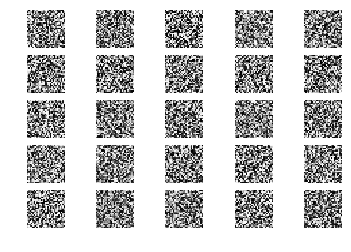

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


1 [D loss: 0.383691, acc.: 75.00%] [G loss: 0.755513]
2 [D loss: 0.355932, acc.: 81.25%] [G loss: 0.930368]
3 [D loss: 0.269550, acc.: 89.06%] [G loss: 1.097218]
4 [D loss: 0.205169, acc.: 96.88%] [G loss: 1.216384]
5 [D loss: 0.200561, acc.: 96.88%] [G loss: 1.334237]
6 [D loss: 0.192663, acc.: 96.88%] [G loss: 1.499315]
7 [D loss: 0.187035, acc.: 100.00%] [G loss: 1.586898]
8 [D loss: 0.155608, acc.: 100.00%] [G loss: 1.691854]
9 [D loss: 0.125833, acc.: 100.00%] [G loss: 1.726228]
10 [D loss: 0.131085, acc.: 98.44%] [G loss: 1.928516]
11 [D loss: 0.109622, acc.: 100.00%] [G loss: 1.803245]
12 [D loss: 0.091258, acc.: 100.00%] [G loss: 2.028106]
13 [D loss: 0.104863, acc.: 100.00%] [G loss: 2.049442]
14 [D loss: 0.075044, acc.: 100.00%] [G loss: 2.176438]
15 [D loss: 0.063999, acc.: 100.00%] [G loss: 2.306613]
16 [D loss: 0.085567, acc.: 100.00%] [G loss: 2.435909]
17 [D loss: 0.060228, acc.: 100.00%] [G loss: 2.357105]
18 [D loss: 0.067791, acc.: 100.00%] [G loss: 2.421449]
19 [D lo

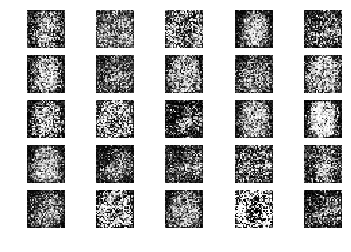

201 [D loss: 0.364405, acc.: 81.25%] [G loss: 3.209533]
202 [D loss: 0.457969, acc.: 79.69%] [G loss: 4.214200]
203 [D loss: 0.480233, acc.: 81.25%] [G loss: 3.033507]
204 [D loss: 0.702812, acc.: 68.75%] [G loss: 2.613973]
205 [D loss: 0.164496, acc.: 96.88%] [G loss: 3.496471]
206 [D loss: 0.528547, acc.: 71.88%] [G loss: 2.647915]
207 [D loss: 0.479695, acc.: 76.56%] [G loss: 2.952189]
208 [D loss: 0.260529, acc.: 92.19%] [G loss: 3.640079]
209 [D loss: 0.459224, acc.: 84.38%] [G loss: 2.916585]
210 [D loss: 0.437083, acc.: 73.44%] [G loss: 3.012702]
211 [D loss: 0.298753, acc.: 87.50%] [G loss: 2.903792]
212 [D loss: 0.337871, acc.: 85.94%] [G loss: 3.145812]
213 [D loss: 0.248016, acc.: 93.75%] [G loss: 3.820669]
214 [D loss: 0.423794, acc.: 81.25%] [G loss: 3.382685]
215 [D loss: 0.266118, acc.: 89.06%] [G loss: 3.764850]
216 [D loss: 0.773935, acc.: 62.50%] [G loss: 2.949185]
217 [D loss: 0.586952, acc.: 81.25%] [G loss: 2.715005]
218 [D loss: 0.436995, acc.: 82.81%] [G loss: 2.

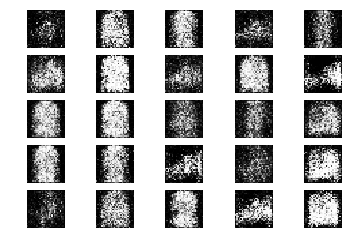

401 [D loss: 0.741965, acc.: 45.31%] [G loss: 0.863618]
402 [D loss: 0.716498, acc.: 45.31%] [G loss: 0.937845]
403 [D loss: 0.676757, acc.: 53.12%] [G loss: 0.930690]
404 [D loss: 0.739820, acc.: 46.88%] [G loss: 0.951046]
405 [D loss: 0.669019, acc.: 64.06%] [G loss: 0.848860]
406 [D loss: 0.632920, acc.: 65.62%] [G loss: 0.865350]
407 [D loss: 0.619645, acc.: 64.06%] [G loss: 0.896168]
408 [D loss: 0.688336, acc.: 59.38%] [G loss: 0.886952]
409 [D loss: 0.709487, acc.: 54.69%] [G loss: 0.910183]
410 [D loss: 0.656684, acc.: 53.12%] [G loss: 0.963721]
411 [D loss: 0.651299, acc.: 60.94%] [G loss: 0.966094]
412 [D loss: 0.668200, acc.: 56.25%] [G loss: 0.960143]
413 [D loss: 0.614756, acc.: 65.62%] [G loss: 0.917970]
414 [D loss: 0.642993, acc.: 67.19%] [G loss: 0.875072]
415 [D loss: 0.691226, acc.: 60.94%] [G loss: 0.864942]
416 [D loss: 0.618987, acc.: 59.38%] [G loss: 0.859709]
417 [D loss: 0.654862, acc.: 59.38%] [G loss: 1.007291]
418 [D loss: 0.699248, acc.: 60.94%] [G loss: 1.

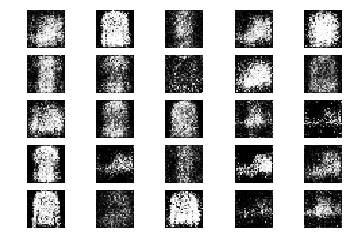

601 [D loss: 0.596886, acc.: 76.56%] [G loss: 0.838421]
602 [D loss: 0.622433, acc.: 64.06%] [G loss: 0.923082]
603 [D loss: 0.607110, acc.: 68.75%] [G loss: 0.916372]
604 [D loss: 0.664746, acc.: 62.50%] [G loss: 0.921492]
605 [D loss: 0.657011, acc.: 54.69%] [G loss: 0.977184]
606 [D loss: 0.685569, acc.: 59.38%] [G loss: 0.964056]
607 [D loss: 0.633101, acc.: 62.50%] [G loss: 0.874336]
608 [D loss: 0.640487, acc.: 62.50%] [G loss: 0.937946]
609 [D loss: 0.624759, acc.: 65.62%] [G loss: 1.026460]
610 [D loss: 0.579225, acc.: 67.19%] [G loss: 0.905006]
611 [D loss: 0.612863, acc.: 68.75%] [G loss: 0.890186]
612 [D loss: 0.696804, acc.: 57.81%] [G loss: 0.945557]
613 [D loss: 0.594157, acc.: 75.00%] [G loss: 0.871083]
614 [D loss: 0.621617, acc.: 62.50%] [G loss: 0.840815]
615 [D loss: 0.597782, acc.: 68.75%] [G loss: 0.831490]
616 [D loss: 0.561400, acc.: 70.31%] [G loss: 0.923848]
617 [D loss: 0.596313, acc.: 71.88%] [G loss: 0.981579]
618 [D loss: 0.650309, acc.: 62.50%] [G loss: 0.

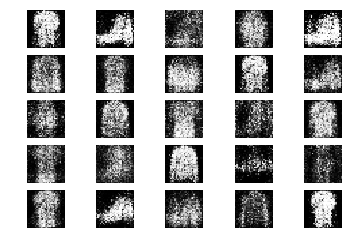

801 [D loss: 0.601008, acc.: 59.38%] [G loss: 0.923291]
802 [D loss: 0.585037, acc.: 64.06%] [G loss: 0.887179]
803 [D loss: 0.609713, acc.: 71.88%] [G loss: 0.943194]
804 [D loss: 0.533744, acc.: 82.81%] [G loss: 0.946510]
805 [D loss: 0.654252, acc.: 56.25%] [G loss: 0.889449]
806 [D loss: 0.643043, acc.: 62.50%] [G loss: 0.943117]
807 [D loss: 0.602017, acc.: 67.19%] [G loss: 0.826033]
808 [D loss: 0.658825, acc.: 62.50%] [G loss: 0.832748]
809 [D loss: 0.660614, acc.: 65.62%] [G loss: 0.845080]
810 [D loss: 0.594396, acc.: 71.88%] [G loss: 1.017431]
811 [D loss: 0.634032, acc.: 60.94%] [G loss: 0.944059]
812 [D loss: 0.668243, acc.: 67.19%] [G loss: 0.946823]
813 [D loss: 0.630661, acc.: 68.75%] [G loss: 0.907000]
814 [D loss: 0.597412, acc.: 68.75%] [G loss: 0.918228]
815 [D loss: 0.578890, acc.: 79.69%] [G loss: 0.913045]
816 [D loss: 0.681625, acc.: 65.62%] [G loss: 0.857114]
817 [D loss: 0.705142, acc.: 56.25%] [G loss: 0.871692]
818 [D loss: 0.647397, acc.: 57.81%] [G loss: 0.

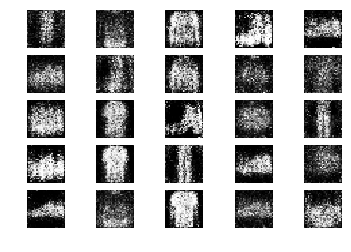

1001 [D loss: 0.634589, acc.: 65.62%] [G loss: 0.859583]
1002 [D loss: 0.681085, acc.: 65.62%] [G loss: 0.852805]
1003 [D loss: 0.650270, acc.: 56.25%] [G loss: 0.825340]
1004 [D loss: 0.671521, acc.: 67.19%] [G loss: 0.854520]
1005 [D loss: 0.653769, acc.: 64.06%] [G loss: 0.914357]
1006 [D loss: 0.701386, acc.: 50.00%] [G loss: 0.801462]
1007 [D loss: 0.566335, acc.: 73.44%] [G loss: 0.862737]
1008 [D loss: 0.668075, acc.: 64.06%] [G loss: 0.827592]
1009 [D loss: 0.592548, acc.: 68.75%] [G loss: 0.800155]
1010 [D loss: 0.637253, acc.: 67.19%] [G loss: 0.880932]
1011 [D loss: 0.687088, acc.: 57.81%] [G loss: 0.919244]
1012 [D loss: 0.649850, acc.: 60.94%] [G loss: 0.813904]
1013 [D loss: 0.676060, acc.: 65.62%] [G loss: 0.855425]
1014 [D loss: 0.593182, acc.: 68.75%] [G loss: 0.818385]
1015 [D loss: 0.699352, acc.: 48.44%] [G loss: 0.764964]
1016 [D loss: 0.681415, acc.: 57.81%] [G loss: 0.777467]
1017 [D loss: 0.641542, acc.: 60.94%] [G loss: 0.766519]
1018 [D loss: 0.648925, acc.: 6

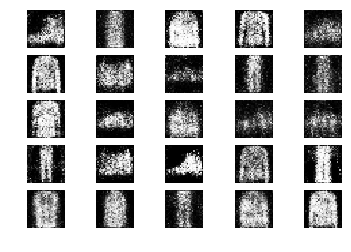

1201 [D loss: 0.660647, acc.: 60.94%] [G loss: 0.817765]
1202 [D loss: 0.626806, acc.: 65.62%] [G loss: 0.828457]
1203 [D loss: 0.706321, acc.: 56.25%] [G loss: 0.799899]
1204 [D loss: 0.659354, acc.: 64.06%] [G loss: 0.793889]
1205 [D loss: 0.663365, acc.: 65.62%] [G loss: 0.800340]
1206 [D loss: 0.653706, acc.: 62.50%] [G loss: 0.851480]
1207 [D loss: 0.610894, acc.: 68.75%] [G loss: 0.805761]
1208 [D loss: 0.610938, acc.: 62.50%] [G loss: 0.869130]
1209 [D loss: 0.627499, acc.: 71.88%] [G loss: 0.838075]
1210 [D loss: 0.645476, acc.: 57.81%] [G loss: 0.827817]
1211 [D loss: 0.625577, acc.: 62.50%] [G loss: 0.829432]
1212 [D loss: 0.634697, acc.: 67.19%] [G loss: 0.766205]
1213 [D loss: 0.595077, acc.: 68.75%] [G loss: 0.840145]
1214 [D loss: 0.563379, acc.: 75.00%] [G loss: 0.829766]
1215 [D loss: 0.645127, acc.: 65.62%] [G loss: 0.829650]
1216 [D loss: 0.656084, acc.: 68.75%] [G loss: 0.782694]
1217 [D loss: 0.634895, acc.: 64.06%] [G loss: 0.938184]
1218 [D loss: 0.623096, acc.: 6

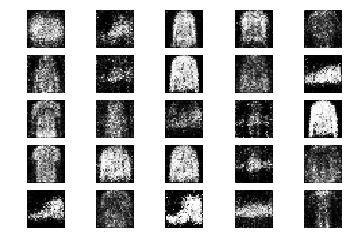

1401 [D loss: 0.640364, acc.: 53.12%] [G loss: 0.852142]
1402 [D loss: 0.615993, acc.: 70.31%] [G loss: 0.813055]
1403 [D loss: 0.616177, acc.: 67.19%] [G loss: 0.864299]
1404 [D loss: 0.596579, acc.: 68.75%] [G loss: 0.786130]
1405 [D loss: 0.603816, acc.: 70.31%] [G loss: 0.862900]
1406 [D loss: 0.598638, acc.: 65.62%] [G loss: 0.822875]
1407 [D loss: 0.682319, acc.: 56.25%] [G loss: 0.801604]
1408 [D loss: 0.609145, acc.: 67.19%] [G loss: 0.888909]
1409 [D loss: 0.719771, acc.: 45.31%] [G loss: 0.856634]
1410 [D loss: 0.567944, acc.: 70.31%] [G loss: 0.856843]
1411 [D loss: 0.644661, acc.: 50.00%] [G loss: 0.946051]
1412 [D loss: 0.599092, acc.: 73.44%] [G loss: 0.866720]
1413 [D loss: 0.696707, acc.: 53.12%] [G loss: 0.904288]
1414 [D loss: 0.611708, acc.: 75.00%] [G loss: 0.943126]
1415 [D loss: 0.622952, acc.: 59.38%] [G loss: 0.900459]
1416 [D loss: 0.617471, acc.: 57.81%] [G loss: 0.843644]
1417 [D loss: 0.685967, acc.: 59.38%] [G loss: 0.819310]
1418 [D loss: 0.611000, acc.: 6

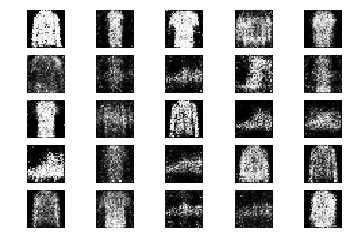

1601 [D loss: 0.591839, acc.: 68.75%] [G loss: 0.859190]
1602 [D loss: 0.664609, acc.: 54.69%] [G loss: 0.828029]
1603 [D loss: 0.667372, acc.: 54.69%] [G loss: 0.812140]
1604 [D loss: 0.636061, acc.: 64.06%] [G loss: 0.896545]
1605 [D loss: 0.648384, acc.: 57.81%] [G loss: 0.889090]
1606 [D loss: 0.609359, acc.: 70.31%] [G loss: 0.845627]
1607 [D loss: 0.603498, acc.: 60.94%] [G loss: 0.880287]
1608 [D loss: 0.594113, acc.: 71.88%] [G loss: 0.923987]
1609 [D loss: 0.585703, acc.: 68.75%] [G loss: 0.904097]
1610 [D loss: 0.556235, acc.: 71.88%] [G loss: 0.844767]
1611 [D loss: 0.643220, acc.: 59.38%] [G loss: 0.922112]
1612 [D loss: 0.594333, acc.: 68.75%] [G loss: 0.909060]
1613 [D loss: 0.567105, acc.: 68.75%] [G loss: 0.920515]
1614 [D loss: 0.725663, acc.: 48.44%] [G loss: 0.886683]
1615 [D loss: 0.618701, acc.: 68.75%] [G loss: 0.913142]
1616 [D loss: 0.603812, acc.: 70.31%] [G loss: 0.927590]
1617 [D loss: 0.609319, acc.: 60.94%] [G loss: 0.960175]
1618 [D loss: 0.634225, acc.: 6

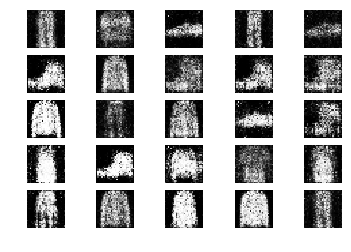

1801 [D loss: 0.619478, acc.: 62.50%] [G loss: 0.880738]
1802 [D loss: 0.605658, acc.: 67.19%] [G loss: 0.883695]
1803 [D loss: 0.683254, acc.: 57.81%] [G loss: 0.917327]
1804 [D loss: 0.624792, acc.: 68.75%] [G loss: 0.934248]
1805 [D loss: 0.659450, acc.: 62.50%] [G loss: 0.863387]
1806 [D loss: 0.609679, acc.: 64.06%] [G loss: 0.881181]
1807 [D loss: 0.623134, acc.: 68.75%] [G loss: 0.841372]
1808 [D loss: 0.608806, acc.: 70.31%] [G loss: 0.876283]
1809 [D loss: 0.615263, acc.: 62.50%] [G loss: 0.824476]
1810 [D loss: 0.595051, acc.: 71.88%] [G loss: 0.918813]
1811 [D loss: 0.652892, acc.: 59.38%] [G loss: 0.876392]
1812 [D loss: 0.668893, acc.: 59.38%] [G loss: 0.855384]
1813 [D loss: 0.617901, acc.: 67.19%] [G loss: 0.876692]
1814 [D loss: 0.639312, acc.: 62.50%] [G loss: 0.864459]
1815 [D loss: 0.624428, acc.: 68.75%] [G loss: 0.908900]
1816 [D loss: 0.645727, acc.: 65.62%] [G loss: 0.921427]
1817 [D loss: 0.626093, acc.: 65.62%] [G loss: 0.871278]
1818 [D loss: 0.637489, acc.: 5

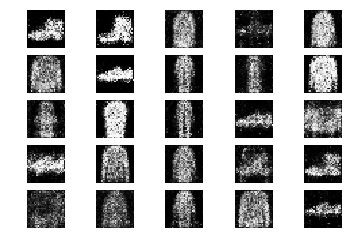

2001 [D loss: 0.624428, acc.: 59.38%] [G loss: 0.921659]
2002 [D loss: 0.687364, acc.: 56.25%] [G loss: 0.888513]
2003 [D loss: 0.611783, acc.: 65.62%] [G loss: 0.925506]
2004 [D loss: 0.667427, acc.: 62.50%] [G loss: 0.977226]
2005 [D loss: 0.637985, acc.: 65.62%] [G loss: 0.952743]
2006 [D loss: 0.623456, acc.: 62.50%] [G loss: 0.987820]
2007 [D loss: 0.584234, acc.: 76.56%] [G loss: 1.034105]
2008 [D loss: 0.634145, acc.: 64.06%] [G loss: 0.875028]
2009 [D loss: 0.613922, acc.: 67.19%] [G loss: 0.915083]
2010 [D loss: 0.617186, acc.: 64.06%] [G loss: 0.902901]
2011 [D loss: 0.628023, acc.: 65.62%] [G loss: 0.903829]
2012 [D loss: 0.630289, acc.: 71.88%] [G loss: 0.924151]
2013 [D loss: 0.638881, acc.: 57.81%] [G loss: 0.845793]
2014 [D loss: 0.646068, acc.: 65.62%] [G loss: 0.929385]
2015 [D loss: 0.644435, acc.: 53.12%] [G loss: 0.901824]
2016 [D loss: 0.639698, acc.: 68.75%] [G loss: 0.951533]
2017 [D loss: 0.699860, acc.: 53.12%] [G loss: 0.871135]
2018 [D loss: 0.617033, acc.: 6

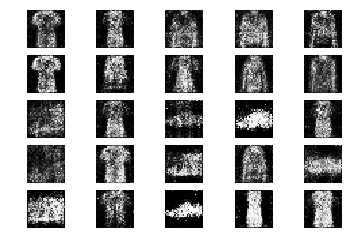

2201 [D loss: 0.668156, acc.: 57.81%] [G loss: 0.924841]
2202 [D loss: 0.696509, acc.: 60.94%] [G loss: 0.847234]
2203 [D loss: 0.659161, acc.: 53.12%] [G loss: 0.998662]
2204 [D loss: 0.656636, acc.: 59.38%] [G loss: 0.921950]
2205 [D loss: 0.597927, acc.: 68.75%] [G loss: 0.961153]
2206 [D loss: 0.627198, acc.: 64.06%] [G loss: 0.924006]
2207 [D loss: 0.587588, acc.: 71.88%] [G loss: 0.994530]
2208 [D loss: 0.641394, acc.: 60.94%] [G loss: 0.926023]
2209 [D loss: 0.594687, acc.: 75.00%] [G loss: 0.926014]
2210 [D loss: 0.666061, acc.: 50.00%] [G loss: 0.883861]
2211 [D loss: 0.645252, acc.: 53.12%] [G loss: 0.927150]
2212 [D loss: 0.574078, acc.: 59.38%] [G loss: 0.929559]
2213 [D loss: 0.559148, acc.: 70.31%] [G loss: 0.978138]
2214 [D loss: 0.612497, acc.: 64.06%] [G loss: 0.960349]
2215 [D loss: 0.535212, acc.: 76.56%] [G loss: 1.037179]
2216 [D loss: 0.683750, acc.: 57.81%] [G loss: 0.901071]
2217 [D loss: 0.635922, acc.: 64.06%] [G loss: 0.920183]
2218 [D loss: 0.638233, acc.: 6

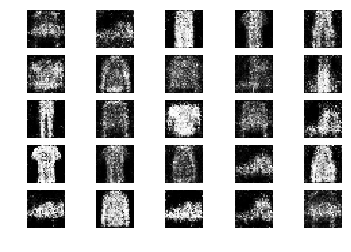

2401 [D loss: 0.637228, acc.: 68.75%] [G loss: 0.921662]
2402 [D loss: 0.573253, acc.: 68.75%] [G loss: 0.991140]
2403 [D loss: 0.615962, acc.: 62.50%] [G loss: 1.007983]
2404 [D loss: 0.649961, acc.: 59.38%] [G loss: 0.963696]
2405 [D loss: 0.644857, acc.: 64.06%] [G loss: 1.017770]
2406 [D loss: 0.580769, acc.: 70.31%] [G loss: 0.970232]
2407 [D loss: 0.600578, acc.: 70.31%] [G loss: 0.923696]
2408 [D loss: 0.630805, acc.: 59.38%] [G loss: 1.026498]
2409 [D loss: 0.580218, acc.: 70.31%] [G loss: 0.925216]
2410 [D loss: 0.729474, acc.: 51.56%] [G loss: 0.775604]
2411 [D loss: 0.579138, acc.: 67.19%] [G loss: 0.840251]
2412 [D loss: 0.616599, acc.: 67.19%] [G loss: 0.819711]
2413 [D loss: 0.635527, acc.: 67.19%] [G loss: 0.830755]
2414 [D loss: 0.608618, acc.: 65.62%] [G loss: 0.896206]
2415 [D loss: 0.667362, acc.: 59.38%] [G loss: 0.945608]
2416 [D loss: 0.566091, acc.: 75.00%] [G loss: 0.935850]
2417 [D loss: 0.673386, acc.: 57.81%] [G loss: 0.896539]
2418 [D loss: 0.651578, acc.: 5

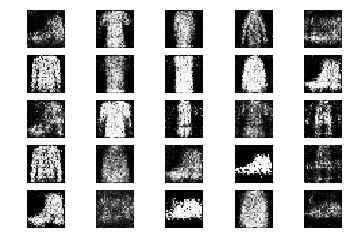

2601 [D loss: 0.637851, acc.: 62.50%] [G loss: 0.989545]
2602 [D loss: 0.649131, acc.: 59.38%] [G loss: 0.903558]
2603 [D loss: 0.705435, acc.: 54.69%] [G loss: 0.943155]
2604 [D loss: 0.606750, acc.: 65.62%] [G loss: 0.942800]
2605 [D loss: 0.568070, acc.: 71.88%] [G loss: 1.009916]
2606 [D loss: 0.576110, acc.: 75.00%] [G loss: 0.945059]
2607 [D loss: 0.514192, acc.: 85.94%] [G loss: 0.940696]
2608 [D loss: 0.607440, acc.: 60.94%] [G loss: 0.919087]
2609 [D loss: 0.676123, acc.: 57.81%] [G loss: 0.888180]
2610 [D loss: 0.717513, acc.: 50.00%] [G loss: 0.929553]
2611 [D loss: 0.569764, acc.: 75.00%] [G loss: 0.953189]
2612 [D loss: 0.679583, acc.: 57.81%] [G loss: 0.925287]
2613 [D loss: 0.724580, acc.: 53.12%] [G loss: 0.904256]
2614 [D loss: 0.697443, acc.: 48.44%] [G loss: 0.877887]
2615 [D loss: 0.607780, acc.: 64.06%] [G loss: 0.961239]
2616 [D loss: 0.666807, acc.: 54.69%] [G loss: 0.966533]
2617 [D loss: 0.718132, acc.: 51.56%] [G loss: 0.920768]
2618 [D loss: 0.661693, acc.: 6

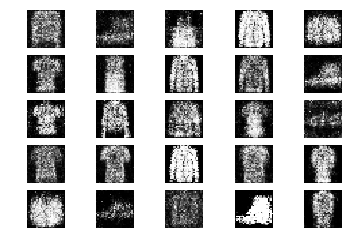

2801 [D loss: 0.654610, acc.: 57.81%] [G loss: 1.083293]
2802 [D loss: 0.596088, acc.: 67.19%] [G loss: 0.941331]
2803 [D loss: 0.678785, acc.: 59.38%] [G loss: 0.962877]
2804 [D loss: 0.693081, acc.: 62.50%] [G loss: 0.922388]
2805 [D loss: 0.655667, acc.: 64.06%] [G loss: 0.898572]
2806 [D loss: 0.594117, acc.: 57.81%] [G loss: 0.914623]
2807 [D loss: 0.613694, acc.: 71.88%] [G loss: 0.885721]
2808 [D loss: 0.628215, acc.: 71.88%] [G loss: 0.861478]
2809 [D loss: 0.651105, acc.: 56.25%] [G loss: 0.899251]
2810 [D loss: 0.611683, acc.: 70.31%] [G loss: 0.978748]
2811 [D loss: 0.605322, acc.: 73.44%] [G loss: 0.952734]
2812 [D loss: 0.631966, acc.: 71.88%] [G loss: 0.825933]
2813 [D loss: 0.643178, acc.: 56.25%] [G loss: 0.917209]
2814 [D loss: 0.621132, acc.: 62.50%] [G loss: 0.925405]
2815 [D loss: 0.658525, acc.: 60.94%] [G loss: 0.931389]
2816 [D loss: 0.616344, acc.: 62.50%] [G loss: 0.979235]
2817 [D loss: 0.583439, acc.: 71.88%] [G loss: 0.958539]
2818 [D loss: 0.644755, acc.: 6

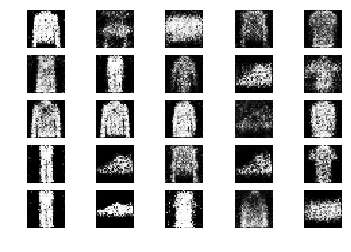

3001 [D loss: 0.611068, acc.: 67.19%] [G loss: 0.887167]
3002 [D loss: 0.632725, acc.: 64.06%] [G loss: 0.908402]
3003 [D loss: 0.626353, acc.: 75.00%] [G loss: 0.910915]
3004 [D loss: 0.664176, acc.: 54.69%] [G loss: 0.952292]
3005 [D loss: 0.594832, acc.: 71.88%] [G loss: 0.943631]
3006 [D loss: 0.614141, acc.: 71.88%] [G loss: 0.975580]
3007 [D loss: 0.613063, acc.: 68.75%] [G loss: 0.941829]
3008 [D loss: 0.603536, acc.: 78.12%] [G loss: 0.881103]
3009 [D loss: 0.696216, acc.: 50.00%] [G loss: 0.934211]
3010 [D loss: 0.653708, acc.: 60.94%] [G loss: 0.899815]
3011 [D loss: 0.667198, acc.: 70.31%] [G loss: 0.923869]
3012 [D loss: 0.613022, acc.: 67.19%] [G loss: 0.863117]
3013 [D loss: 0.655721, acc.: 60.94%] [G loss: 0.812893]
3014 [D loss: 0.548943, acc.: 75.00%] [G loss: 0.927407]
3015 [D loss: 0.672602, acc.: 57.81%] [G loss: 0.924248]
3016 [D loss: 0.650524, acc.: 62.50%] [G loss: 0.868804]
3017 [D loss: 0.653483, acc.: 57.81%] [G loss: 0.914061]
3018 [D loss: 0.640518, acc.: 7

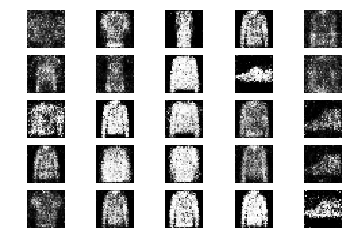

3201 [D loss: 0.599543, acc.: 70.31%] [G loss: 0.833139]
3202 [D loss: 0.627460, acc.: 62.50%] [G loss: 0.894702]
3203 [D loss: 0.647871, acc.: 60.94%] [G loss: 0.797434]
3204 [D loss: 0.644542, acc.: 65.62%] [G loss: 0.887696]
3205 [D loss: 0.654212, acc.: 57.81%] [G loss: 0.919116]
3206 [D loss: 0.621071, acc.: 57.81%] [G loss: 0.920604]
3207 [D loss: 0.650229, acc.: 59.38%] [G loss: 0.845685]
3208 [D loss: 0.678044, acc.: 51.56%] [G loss: 0.897754]
3209 [D loss: 0.606162, acc.: 71.88%] [G loss: 0.934536]
3210 [D loss: 0.606973, acc.: 64.06%] [G loss: 0.925144]
3211 [D loss: 0.677832, acc.: 59.38%] [G loss: 0.933825]
3212 [D loss: 0.633890, acc.: 71.88%] [G loss: 0.899183]
3213 [D loss: 0.665386, acc.: 56.25%] [G loss: 0.910420]
3214 [D loss: 0.605646, acc.: 65.62%] [G loss: 0.837453]
3215 [D loss: 0.665854, acc.: 51.56%] [G loss: 0.870899]
3216 [D loss: 0.673826, acc.: 50.00%] [G loss: 0.873201]
3217 [D loss: 0.658420, acc.: 65.62%] [G loss: 0.847261]
3218 [D loss: 0.653257, acc.: 6

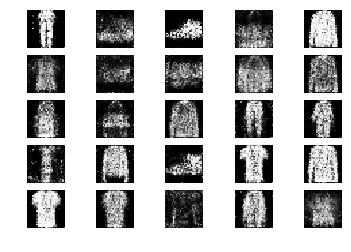

3401 [D loss: 0.798070, acc.: 45.31%] [G loss: 0.857239]
3402 [D loss: 0.724419, acc.: 56.25%] [G loss: 0.935260]
3403 [D loss: 0.609186, acc.: 65.62%] [G loss: 0.958882]
3404 [D loss: 0.655473, acc.: 57.81%] [G loss: 0.904482]
3405 [D loss: 0.655490, acc.: 64.06%] [G loss: 0.898074]
3406 [D loss: 0.655672, acc.: 64.06%] [G loss: 0.891133]
3407 [D loss: 0.589715, acc.: 70.31%] [G loss: 0.950078]
3408 [D loss: 0.691270, acc.: 64.06%] [G loss: 0.898805]
3409 [D loss: 0.557991, acc.: 75.00%] [G loss: 0.988678]
3410 [D loss: 0.665497, acc.: 59.38%] [G loss: 0.986160]
3411 [D loss: 0.656480, acc.: 67.19%] [G loss: 0.877073]
3412 [D loss: 0.693417, acc.: 57.81%] [G loss: 0.873565]
3413 [D loss: 0.715117, acc.: 53.12%] [G loss: 0.857993]
3414 [D loss: 0.643149, acc.: 60.94%] [G loss: 0.893105]
3415 [D loss: 0.639758, acc.: 62.50%] [G loss: 0.928278]
3416 [D loss: 0.639690, acc.: 65.62%] [G loss: 0.908977]
3417 [D loss: 0.637111, acc.: 64.06%] [G loss: 0.883746]
3418 [D loss: 0.569119, acc.: 7

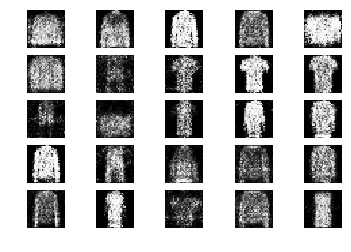

3601 [D loss: 0.698680, acc.: 54.69%] [G loss: 0.930990]
3602 [D loss: 0.596388, acc.: 67.19%] [G loss: 0.905428]
3603 [D loss: 0.625036, acc.: 67.19%] [G loss: 0.873104]
3604 [D loss: 0.687841, acc.: 54.69%] [G loss: 0.865534]
3605 [D loss: 0.643994, acc.: 68.75%] [G loss: 0.854281]
3606 [D loss: 0.663191, acc.: 67.19%] [G loss: 0.844833]
3607 [D loss: 0.631954, acc.: 65.62%] [G loss: 0.842460]
3608 [D loss: 0.656943, acc.: 54.69%] [G loss: 0.852294]
3609 [D loss: 0.685772, acc.: 56.25%] [G loss: 0.851425]
3610 [D loss: 0.680673, acc.: 57.81%] [G loss: 0.872551]
3611 [D loss: 0.644064, acc.: 57.81%] [G loss: 0.923517]
3612 [D loss: 0.705361, acc.: 48.44%] [G loss: 0.882846]
3613 [D loss: 0.638299, acc.: 59.38%] [G loss: 0.893094]
3614 [D loss: 0.715093, acc.: 43.75%] [G loss: 0.886079]
3615 [D loss: 0.607632, acc.: 62.50%] [G loss: 0.942317]
3616 [D loss: 0.683738, acc.: 56.25%] [G loss: 0.857125]
3617 [D loss: 0.637183, acc.: 60.94%] [G loss: 0.879067]
3618 [D loss: 0.630775, acc.: 6

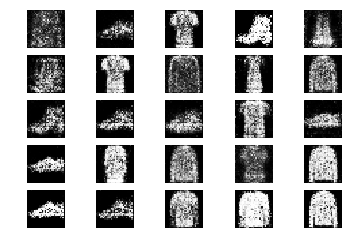

3801 [D loss: 0.587368, acc.: 73.44%] [G loss: 0.922745]
3802 [D loss: 0.613399, acc.: 68.75%] [G loss: 0.945486]
3803 [D loss: 0.708956, acc.: 54.69%] [G loss: 0.893296]
3804 [D loss: 0.668362, acc.: 59.38%] [G loss: 0.949907]
3805 [D loss: 0.683620, acc.: 53.12%] [G loss: 0.892136]
3806 [D loss: 0.666139, acc.: 56.25%] [G loss: 0.866480]
3807 [D loss: 0.616015, acc.: 67.19%] [G loss: 0.900000]
3808 [D loss: 0.702089, acc.: 60.94%] [G loss: 0.898606]
3809 [D loss: 0.661235, acc.: 64.06%] [G loss: 0.860794]
3810 [D loss: 0.642308, acc.: 60.94%] [G loss: 0.750146]
3811 [D loss: 0.645621, acc.: 64.06%] [G loss: 0.792615]
3812 [D loss: 0.603327, acc.: 62.50%] [G loss: 0.881528]
3813 [D loss: 0.684228, acc.: 56.25%] [G loss: 0.926115]
3814 [D loss: 0.645097, acc.: 54.69%] [G loss: 0.874138]
3815 [D loss: 0.644117, acc.: 65.62%] [G loss: 0.859090]
3816 [D loss: 0.722247, acc.: 45.31%] [G loss: 0.834070]
3817 [D loss: 0.690250, acc.: 54.69%] [G loss: 0.828251]
3818 [D loss: 0.653972, acc.: 6

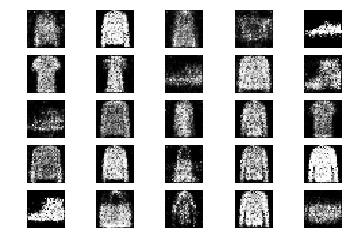

4001 [D loss: 0.639633, acc.: 65.62%] [G loss: 0.868546]
4002 [D loss: 0.699057, acc.: 54.69%] [G loss: 0.846597]
4003 [D loss: 0.604873, acc.: 65.62%] [G loss: 0.893995]
4004 [D loss: 0.640434, acc.: 59.38%] [G loss: 0.889968]
4005 [D loss: 0.697591, acc.: 46.88%] [G loss: 0.837985]
4006 [D loss: 0.578367, acc.: 71.88%] [G loss: 0.866951]
4007 [D loss: 0.681210, acc.: 50.00%] [G loss: 0.870068]
4008 [D loss: 0.664817, acc.: 62.50%] [G loss: 0.915254]
4009 [D loss: 0.571720, acc.: 78.12%] [G loss: 0.905176]
4010 [D loss: 0.625521, acc.: 65.62%] [G loss: 0.903817]
4011 [D loss: 0.674381, acc.: 51.56%] [G loss: 0.820191]
4012 [D loss: 0.629045, acc.: 65.62%] [G loss: 0.848043]
4013 [D loss: 0.631646, acc.: 62.50%] [G loss: 0.917229]
4014 [D loss: 0.624071, acc.: 62.50%] [G loss: 0.880540]
4015 [D loss: 0.659865, acc.: 54.69%] [G loss: 0.897658]
4016 [D loss: 0.635862, acc.: 64.06%] [G loss: 0.807609]
4017 [D loss: 0.651291, acc.: 60.94%] [G loss: 0.878344]
4018 [D loss: 0.633680, acc.: 6

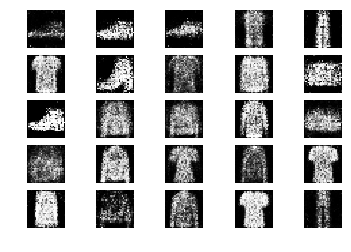

4201 [D loss: 0.678726, acc.: 54.69%] [G loss: 0.868747]
4202 [D loss: 0.658262, acc.: 54.69%] [G loss: 0.896911]
4203 [D loss: 0.644426, acc.: 62.50%] [G loss: 0.904338]
4204 [D loss: 0.656862, acc.: 57.81%] [G loss: 0.909873]
4205 [D loss: 0.647628, acc.: 65.62%] [G loss: 0.872030]
4206 [D loss: 0.693449, acc.: 46.88%] [G loss: 0.842705]
4207 [D loss: 0.664880, acc.: 57.81%] [G loss: 0.958195]
4208 [D loss: 0.670715, acc.: 62.50%] [G loss: 0.883722]
4209 [D loss: 0.630908, acc.: 71.88%] [G loss: 0.883451]
4210 [D loss: 0.698563, acc.: 54.69%] [G loss: 0.890284]
4211 [D loss: 0.641593, acc.: 62.50%] [G loss: 0.912713]
4212 [D loss: 0.676074, acc.: 56.25%] [G loss: 0.927672]
4213 [D loss: 0.618583, acc.: 65.62%] [G loss: 0.867189]
4214 [D loss: 0.627760, acc.: 68.75%] [G loss: 0.900125]
4215 [D loss: 0.621720, acc.: 68.75%] [G loss: 0.900365]
4216 [D loss: 0.680173, acc.: 54.69%] [G loss: 0.855838]
4217 [D loss: 0.627370, acc.: 60.94%] [G loss: 0.899091]
4218 [D loss: 0.630909, acc.: 6

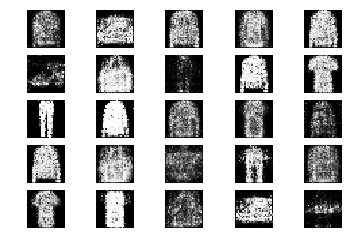

4401 [D loss: 0.650703, acc.: 64.06%] [G loss: 0.968630]
4402 [D loss: 0.701485, acc.: 53.12%] [G loss: 0.893377]
4403 [D loss: 0.645003, acc.: 60.94%] [G loss: 0.835206]
4404 [D loss: 0.637981, acc.: 57.81%] [G loss: 0.908222]
4405 [D loss: 0.671262, acc.: 59.38%] [G loss: 0.916005]
4406 [D loss: 0.614450, acc.: 76.56%] [G loss: 0.949758]
4407 [D loss: 0.580954, acc.: 78.12%] [G loss: 0.818130]
4408 [D loss: 0.632572, acc.: 68.75%] [G loss: 0.903766]
4409 [D loss: 0.629992, acc.: 70.31%] [G loss: 0.924311]
4410 [D loss: 0.624531, acc.: 67.19%] [G loss: 0.863770]
4411 [D loss: 0.657593, acc.: 67.19%] [G loss: 0.798504]
4412 [D loss: 0.650153, acc.: 57.81%] [G loss: 0.917643]
4413 [D loss: 0.666756, acc.: 60.94%] [G loss: 0.889480]
4414 [D loss: 0.650467, acc.: 64.06%] [G loss: 0.877684]
4415 [D loss: 0.664276, acc.: 62.50%] [G loss: 0.874916]
4416 [D loss: 0.655789, acc.: 60.94%] [G loss: 0.867988]
4417 [D loss: 0.668706, acc.: 50.00%] [G loss: 0.910381]
4418 [D loss: 0.618404, acc.: 6

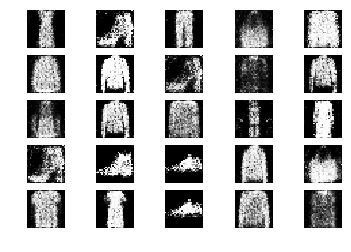

4601 [D loss: 0.685312, acc.: 56.25%] [G loss: 0.876702]
4602 [D loss: 0.583670, acc.: 73.44%] [G loss: 0.928314]
4603 [D loss: 0.573738, acc.: 78.12%] [G loss: 0.845053]
4604 [D loss: 0.631579, acc.: 67.19%] [G loss: 0.879256]
4605 [D loss: 0.755085, acc.: 56.25%] [G loss: 0.825201]
4606 [D loss: 0.720737, acc.: 53.12%] [G loss: 0.893053]
4607 [D loss: 0.581923, acc.: 70.31%] [G loss: 0.885451]
4608 [D loss: 0.676761, acc.: 59.38%] [G loss: 0.929465]
4609 [D loss: 0.632097, acc.: 57.81%] [G loss: 0.918176]
4610 [D loss: 0.607389, acc.: 62.50%] [G loss: 0.946581]
4611 [D loss: 0.646635, acc.: 60.94%] [G loss: 0.857360]
4612 [D loss: 0.660287, acc.: 60.94%] [G loss: 0.852731]
4613 [D loss: 0.639071, acc.: 64.06%] [G loss: 0.911829]
4614 [D loss: 0.644856, acc.: 57.81%] [G loss: 0.922421]
4615 [D loss: 0.641690, acc.: 62.50%] [G loss: 0.879154]
4616 [D loss: 0.626182, acc.: 65.62%] [G loss: 0.902136]
4617 [D loss: 0.662358, acc.: 57.81%] [G loss: 0.914449]
4618 [D loss: 0.689154, acc.: 5

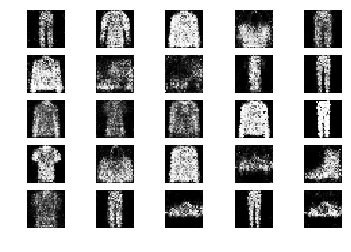

4801 [D loss: 0.647221, acc.: 57.81%] [G loss: 0.899008]
4802 [D loss: 0.628047, acc.: 65.62%] [G loss: 0.878861]
4803 [D loss: 0.587905, acc.: 68.75%] [G loss: 0.964277]
4804 [D loss: 0.688093, acc.: 64.06%] [G loss: 0.913499]
4805 [D loss: 0.641021, acc.: 60.94%] [G loss: 0.889359]
4806 [D loss: 0.681413, acc.: 54.69%] [G loss: 0.860226]
4807 [D loss: 0.633489, acc.: 62.50%] [G loss: 0.872144]
4808 [D loss: 0.705753, acc.: 57.81%] [G loss: 0.785921]
4809 [D loss: 0.595657, acc.: 64.06%] [G loss: 0.894294]
4810 [D loss: 0.690138, acc.: 56.25%] [G loss: 0.891417]
4811 [D loss: 0.644220, acc.: 64.06%] [G loss: 0.929410]
4812 [D loss: 0.635944, acc.: 64.06%] [G loss: 0.946445]
4813 [D loss: 0.683638, acc.: 59.38%] [G loss: 0.872445]
4814 [D loss: 0.639065, acc.: 67.19%] [G loss: 0.930609]
4815 [D loss: 0.649126, acc.: 64.06%] [G loss: 0.937267]
4816 [D loss: 0.630996, acc.: 65.62%] [G loss: 0.818429]
4817 [D loss: 0.639802, acc.: 62.50%] [G loss: 0.918310]
4818 [D loss: 0.703473, acc.: 5

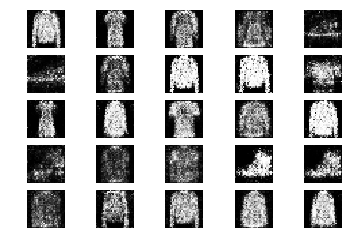

5001 [D loss: 0.650843, acc.: 64.06%] [G loss: 0.922627]
5002 [D loss: 0.674933, acc.: 57.81%] [G loss: 0.940475]
5003 [D loss: 0.654144, acc.: 59.38%] [G loss: 0.919735]
5004 [D loss: 0.648059, acc.: 67.19%] [G loss: 0.921292]
5005 [D loss: 0.629171, acc.: 65.62%] [G loss: 0.894747]
5006 [D loss: 0.643428, acc.: 64.06%] [G loss: 0.896041]
5007 [D loss: 0.643525, acc.: 60.94%] [G loss: 0.888917]
5008 [D loss: 0.618868, acc.: 73.44%] [G loss: 0.872961]
5009 [D loss: 0.691653, acc.: 56.25%] [G loss: 0.830484]
5010 [D loss: 0.704689, acc.: 54.69%] [G loss: 0.849383]
5011 [D loss: 0.612828, acc.: 64.06%] [G loss: 0.844337]
5012 [D loss: 0.666765, acc.: 57.81%] [G loss: 0.881500]
5013 [D loss: 0.674926, acc.: 48.44%] [G loss: 0.877556]
5014 [D loss: 0.641507, acc.: 64.06%] [G loss: 0.868373]
5015 [D loss: 0.611196, acc.: 68.75%] [G loss: 0.906812]
5016 [D loss: 0.654841, acc.: 56.25%] [G loss: 0.854270]
5017 [D loss: 0.698720, acc.: 60.94%] [G loss: 0.889934]
5018 [D loss: 0.574494, acc.: 7

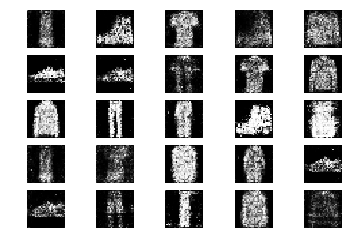

5201 [D loss: 0.601125, acc.: 68.75%] [G loss: 0.853240]
5202 [D loss: 0.636247, acc.: 60.94%] [G loss: 0.767233]
5203 [D loss: 0.720403, acc.: 54.69%] [G loss: 0.878819]
5204 [D loss: 0.639032, acc.: 60.94%] [G loss: 0.825898]
5205 [D loss: 0.677216, acc.: 53.12%] [G loss: 0.843373]
5206 [D loss: 0.639159, acc.: 67.19%] [G loss: 0.942286]
5207 [D loss: 0.665010, acc.: 64.06%] [G loss: 0.870269]
5208 [D loss: 0.669682, acc.: 54.69%] [G loss: 0.882687]
5209 [D loss: 0.671867, acc.: 56.25%] [G loss: 0.847091]
5210 [D loss: 0.612292, acc.: 64.06%] [G loss: 0.861983]
5211 [D loss: 0.642047, acc.: 64.06%] [G loss: 0.789493]
5212 [D loss: 0.629817, acc.: 68.75%] [G loss: 0.886739]
5213 [D loss: 0.680431, acc.: 60.94%] [G loss: 0.897944]
5214 [D loss: 0.743253, acc.: 57.81%] [G loss: 0.943237]
5215 [D loss: 0.732490, acc.: 51.56%] [G loss: 0.983563]
5216 [D loss: 0.595806, acc.: 68.75%] [G loss: 0.862971]
5217 [D loss: 0.697383, acc.: 59.38%] [G loss: 0.902204]
5218 [D loss: 0.643014, acc.: 6

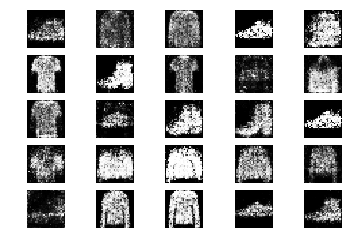

5401 [D loss: 0.660369, acc.: 54.69%] [G loss: 0.877198]
5402 [D loss: 0.641737, acc.: 57.81%] [G loss: 0.886931]
5403 [D loss: 0.601218, acc.: 75.00%] [G loss: 0.913145]
5404 [D loss: 0.762422, acc.: 45.31%] [G loss: 0.796291]
5405 [D loss: 0.570653, acc.: 68.75%] [G loss: 0.906015]
5406 [D loss: 0.668193, acc.: 59.38%] [G loss: 0.905115]
5407 [D loss: 0.664954, acc.: 64.06%] [G loss: 0.838600]
5408 [D loss: 0.662444, acc.: 64.06%] [G loss: 0.915569]
5409 [D loss: 0.640330, acc.: 67.19%] [G loss: 0.846053]
5410 [D loss: 0.653171, acc.: 60.94%] [G loss: 0.884060]
5411 [D loss: 0.679998, acc.: 60.94%] [G loss: 0.792753]
5412 [D loss: 0.640814, acc.: 62.50%] [G loss: 0.832182]
5413 [D loss: 0.672187, acc.: 60.94%] [G loss: 0.886701]
5414 [D loss: 0.627205, acc.: 68.75%] [G loss: 0.837332]
5415 [D loss: 0.704731, acc.: 46.88%] [G loss: 0.794884]
5416 [D loss: 0.677259, acc.: 57.81%] [G loss: 0.837705]
5417 [D loss: 0.631600, acc.: 73.44%] [G loss: 0.900790]
5418 [D loss: 0.614412, acc.: 6

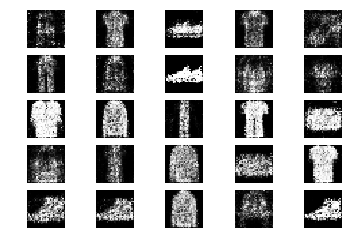

5601 [D loss: 0.624793, acc.: 75.00%] [G loss: 0.952078]
5602 [D loss: 0.623757, acc.: 64.06%] [G loss: 0.937956]
5603 [D loss: 0.606228, acc.: 60.94%] [G loss: 0.927680]
5604 [D loss: 0.674696, acc.: 53.12%] [G loss: 0.889856]
5605 [D loss: 0.607141, acc.: 70.31%] [G loss: 0.862915]
5606 [D loss: 0.677656, acc.: 65.62%] [G loss: 0.873884]
5607 [D loss: 0.658476, acc.: 64.06%] [G loss: 0.890707]
5608 [D loss: 0.647927, acc.: 62.50%] [G loss: 0.816961]
5609 [D loss: 0.654796, acc.: 60.94%] [G loss: 0.873689]
5610 [D loss: 0.699952, acc.: 54.69%] [G loss: 0.824664]
5611 [D loss: 0.611601, acc.: 71.88%] [G loss: 0.851744]
5612 [D loss: 0.759001, acc.: 53.12%] [G loss: 0.870886]
5613 [D loss: 0.608871, acc.: 65.62%] [G loss: 0.898617]
5614 [D loss: 0.655482, acc.: 65.62%] [G loss: 0.983690]
5615 [D loss: 0.564154, acc.: 73.44%] [G loss: 0.975045]
5616 [D loss: 0.729426, acc.: 48.44%] [G loss: 0.907684]
5617 [D loss: 0.662274, acc.: 56.25%] [G loss: 0.843942]
5618 [D loss: 0.653839, acc.: 6

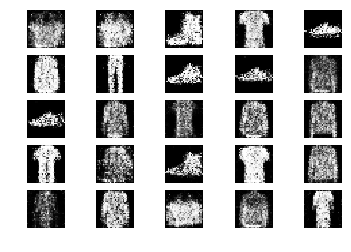

5801 [D loss: 0.732641, acc.: 50.00%] [G loss: 0.841788]
5802 [D loss: 0.629303, acc.: 64.06%] [G loss: 0.863342]
5803 [D loss: 0.612569, acc.: 65.62%] [G loss: 0.804460]
5804 [D loss: 0.643785, acc.: 62.50%] [G loss: 0.906962]
5805 [D loss: 0.623761, acc.: 59.38%] [G loss: 0.875253]
5806 [D loss: 0.665351, acc.: 62.50%] [G loss: 0.898685]
5807 [D loss: 0.663253, acc.: 54.69%] [G loss: 0.955695]
5808 [D loss: 0.597463, acc.: 70.31%] [G loss: 0.904671]
5809 [D loss: 0.639817, acc.: 59.38%] [G loss: 0.992478]
5810 [D loss: 0.640955, acc.: 62.50%] [G loss: 0.839299]
5811 [D loss: 0.712941, acc.: 50.00%] [G loss: 0.904817]
5812 [D loss: 0.674860, acc.: 62.50%] [G loss: 0.946599]
5813 [D loss: 0.666516, acc.: 57.81%] [G loss: 0.895326]
5814 [D loss: 0.615247, acc.: 70.31%] [G loss: 0.929798]
5815 [D loss: 0.610326, acc.: 65.62%] [G loss: 0.850479]
5816 [D loss: 0.660159, acc.: 62.50%] [G loss: 0.913189]
5817 [D loss: 0.702609, acc.: 48.44%] [G loss: 0.893418]
5818 [D loss: 0.599888, acc.: 7

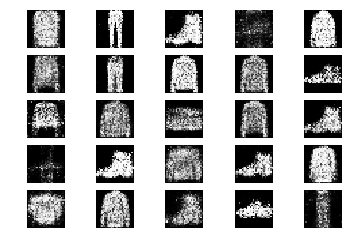

6001 [D loss: 0.676029, acc.: 59.38%] [G loss: 0.963400]
6002 [D loss: 0.625875, acc.: 59.38%] [G loss: 0.940264]
6003 [D loss: 0.651069, acc.: 59.38%] [G loss: 0.924210]
6004 [D loss: 0.680787, acc.: 56.25%] [G loss: 0.945123]
6005 [D loss: 0.633737, acc.: 62.50%] [G loss: 0.825315]
6006 [D loss: 0.636866, acc.: 65.62%] [G loss: 0.832435]
6007 [D loss: 0.641870, acc.: 62.50%] [G loss: 0.845530]
6008 [D loss: 0.621408, acc.: 65.62%] [G loss: 0.877268]
6009 [D loss: 0.643074, acc.: 65.62%] [G loss: 0.838619]
6010 [D loss: 0.612820, acc.: 65.62%] [G loss: 0.927746]
6011 [D loss: 0.634052, acc.: 64.06%] [G loss: 0.846728]
6012 [D loss: 0.625480, acc.: 65.62%] [G loss: 0.930279]
6013 [D loss: 0.656184, acc.: 64.06%] [G loss: 0.941106]
6014 [D loss: 0.672903, acc.: 59.38%] [G loss: 0.901196]
6015 [D loss: 0.668117, acc.: 59.38%] [G loss: 0.826277]
6016 [D loss: 0.660949, acc.: 60.94%] [G loss: 0.992293]
6017 [D loss: 0.678355, acc.: 70.31%] [G loss: 0.879297]
6018 [D loss: 0.665479, acc.: 5

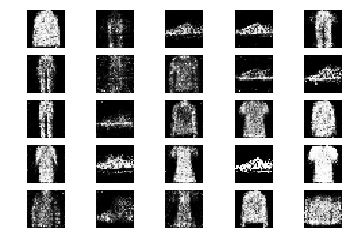

6201 [D loss: 0.594543, acc.: 73.44%] [G loss: 0.885522]
6202 [D loss: 0.621062, acc.: 64.06%] [G loss: 0.885691]
6203 [D loss: 0.614087, acc.: 65.62%] [G loss: 0.900692]
6204 [D loss: 0.616804, acc.: 67.19%] [G loss: 0.894911]
6205 [D loss: 0.671168, acc.: 59.38%] [G loss: 0.948460]
6206 [D loss: 0.588716, acc.: 64.06%] [G loss: 1.030444]
6207 [D loss: 0.713628, acc.: 56.25%] [G loss: 0.994556]
6208 [D loss: 0.684365, acc.: 48.44%] [G loss: 0.958562]
6209 [D loss: 0.645374, acc.: 65.62%] [G loss: 0.994816]
6210 [D loss: 0.644138, acc.: 57.81%] [G loss: 0.995817]
6211 [D loss: 0.669309, acc.: 57.81%] [G loss: 0.805640]
6212 [D loss: 0.649291, acc.: 60.94%] [G loss: 0.808807]
6213 [D loss: 0.705912, acc.: 54.69%] [G loss: 0.861760]
6214 [D loss: 0.609348, acc.: 73.44%] [G loss: 0.902841]
6215 [D loss: 0.595809, acc.: 68.75%] [G loss: 0.904103]
6216 [D loss: 0.594328, acc.: 71.88%] [G loss: 0.886832]
6217 [D loss: 0.634880, acc.: 68.75%] [G loss: 0.900978]
6218 [D loss: 0.683237, acc.: 5

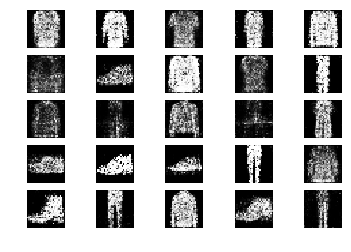

6401 [D loss: 0.696163, acc.: 53.12%] [G loss: 0.976780]
6402 [D loss: 0.657659, acc.: 57.81%] [G loss: 1.033702]
6403 [D loss: 0.610789, acc.: 70.31%] [G loss: 0.966498]
6404 [D loss: 0.565710, acc.: 71.88%] [G loss: 0.951376]
6405 [D loss: 0.667007, acc.: 51.56%] [G loss: 0.868888]
6406 [D loss: 0.643247, acc.: 57.81%] [G loss: 0.896242]
6407 [D loss: 0.599689, acc.: 64.06%] [G loss: 0.934817]
6408 [D loss: 0.646226, acc.: 60.94%] [G loss: 0.932427]
6409 [D loss: 0.639643, acc.: 67.19%] [G loss: 0.869167]
6410 [D loss: 0.657351, acc.: 64.06%] [G loss: 0.953631]
6411 [D loss: 0.628913, acc.: 64.06%] [G loss: 0.917411]
6412 [D loss: 0.679224, acc.: 65.62%] [G loss: 0.902242]
6413 [D loss: 0.638917, acc.: 57.81%] [G loss: 0.965263]
6414 [D loss: 0.662701, acc.: 60.94%] [G loss: 0.917288]
6415 [D loss: 0.623132, acc.: 68.75%] [G loss: 0.851466]
6416 [D loss: 0.653489, acc.: 62.50%] [G loss: 0.935119]
6417 [D loss: 0.675853, acc.: 60.94%] [G loss: 0.877304]
6418 [D loss: 0.635326, acc.: 6

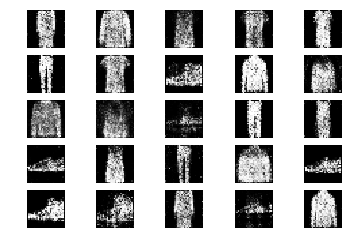

6601 [D loss: 0.663485, acc.: 59.38%] [G loss: 0.860273]
6602 [D loss: 0.641104, acc.: 64.06%] [G loss: 0.909493]
6603 [D loss: 0.755778, acc.: 43.75%] [G loss: 0.886554]
6604 [D loss: 0.717242, acc.: 53.12%] [G loss: 0.830872]
6605 [D loss: 0.674203, acc.: 62.50%] [G loss: 0.938624]
6606 [D loss: 0.675078, acc.: 56.25%] [G loss: 0.821669]
6607 [D loss: 0.676492, acc.: 57.81%] [G loss: 0.837687]
6608 [D loss: 0.681044, acc.: 54.69%] [G loss: 0.839184]
6609 [D loss: 0.603727, acc.: 70.31%] [G loss: 0.922928]
6610 [D loss: 0.661851, acc.: 62.50%] [G loss: 1.003284]
6611 [D loss: 0.662782, acc.: 56.25%] [G loss: 0.889822]
6612 [D loss: 0.658165, acc.: 57.81%] [G loss: 0.924089]
6613 [D loss: 0.673757, acc.: 54.69%] [G loss: 0.933717]
6614 [D loss: 0.697028, acc.: 54.69%] [G loss: 0.915949]
6615 [D loss: 0.592006, acc.: 68.75%] [G loss: 0.936401]
6616 [D loss: 0.641968, acc.: 59.38%] [G loss: 0.986230]
6617 [D loss: 0.701515, acc.: 50.00%] [G loss: 0.950630]
6618 [D loss: 0.640164, acc.: 6

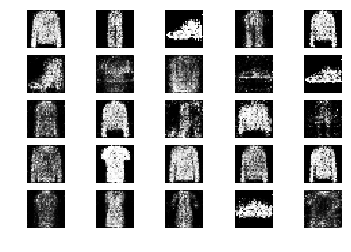

6801 [D loss: 0.652244, acc.: 60.94%] [G loss: 0.915725]
6802 [D loss: 0.586496, acc.: 75.00%] [G loss: 0.849746]
6803 [D loss: 0.626682, acc.: 67.19%] [G loss: 0.888760]
6804 [D loss: 0.622047, acc.: 65.62%] [G loss: 0.930623]
6805 [D loss: 0.622604, acc.: 60.94%] [G loss: 0.937917]
6806 [D loss: 0.723272, acc.: 54.69%] [G loss: 0.906071]
6807 [D loss: 0.637777, acc.: 57.81%] [G loss: 0.892914]
6808 [D loss: 0.655050, acc.: 60.94%] [G loss: 0.893119]
6809 [D loss: 0.652275, acc.: 65.62%] [G loss: 0.893467]
6810 [D loss: 0.645129, acc.: 65.62%] [G loss: 0.956773]
6811 [D loss: 0.647944, acc.: 64.06%] [G loss: 0.905835]
6812 [D loss: 0.664357, acc.: 67.19%] [G loss: 0.870583]
6813 [D loss: 0.693060, acc.: 53.12%] [G loss: 0.834324]
6814 [D loss: 0.660456, acc.: 54.69%] [G loss: 0.874312]
6815 [D loss: 0.637241, acc.: 68.75%] [G loss: 0.882194]
6816 [D loss: 0.731842, acc.: 53.12%] [G loss: 0.933950]
6817 [D loss: 0.602207, acc.: 75.00%] [G loss: 0.910824]
6818 [D loss: 0.635278, acc.: 6

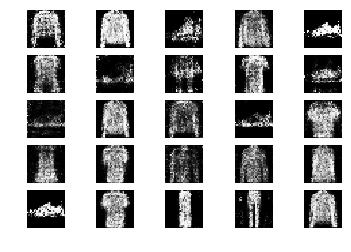

7001 [D loss: 0.627147, acc.: 60.94%] [G loss: 0.954883]
7002 [D loss: 0.680446, acc.: 56.25%] [G loss: 0.954703]
7003 [D loss: 0.647195, acc.: 59.38%] [G loss: 0.983007]
7004 [D loss: 0.651094, acc.: 60.94%] [G loss: 0.958247]
7005 [D loss: 0.617017, acc.: 67.19%] [G loss: 0.951568]
7006 [D loss: 0.676449, acc.: 60.94%] [G loss: 0.916838]
7007 [D loss: 0.597569, acc.: 68.75%] [G loss: 0.998703]
7008 [D loss: 0.669425, acc.: 65.62%] [G loss: 0.925661]
7009 [D loss: 0.603224, acc.: 73.44%] [G loss: 0.906162]
7010 [D loss: 0.613394, acc.: 65.62%] [G loss: 0.895818]
7011 [D loss: 0.566691, acc.: 71.88%] [G loss: 0.955046]
7012 [D loss: 0.640425, acc.: 64.06%] [G loss: 0.983421]
7013 [D loss: 0.682004, acc.: 59.38%] [G loss: 0.895319]
7014 [D loss: 0.578560, acc.: 71.88%] [G loss: 0.879883]
7015 [D loss: 0.685787, acc.: 57.81%] [G loss: 0.848203]
7016 [D loss: 0.611791, acc.: 68.75%] [G loss: 0.962684]
7017 [D loss: 0.652672, acc.: 60.94%] [G loss: 0.845713]
7018 [D loss: 0.650153, acc.: 6

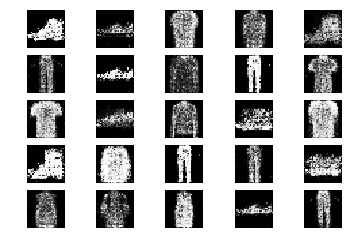

7201 [D loss: 0.658451, acc.: 59.38%] [G loss: 0.948761]
7202 [D loss: 0.644068, acc.: 62.50%] [G loss: 0.942156]
7203 [D loss: 0.686400, acc.: 54.69%] [G loss: 0.910181]
7204 [D loss: 0.665689, acc.: 54.69%] [G loss: 0.960928]
7205 [D loss: 0.654836, acc.: 70.31%] [G loss: 0.986400]
7206 [D loss: 0.634420, acc.: 60.94%] [G loss: 0.868790]
7207 [D loss: 0.645578, acc.: 64.06%] [G loss: 0.867280]
7208 [D loss: 0.680403, acc.: 56.25%] [G loss: 0.897661]
7209 [D loss: 0.627551, acc.: 60.94%] [G loss: 0.929786]
7210 [D loss: 0.693190, acc.: 56.25%] [G loss: 1.000164]
7211 [D loss: 0.716181, acc.: 50.00%] [G loss: 0.910511]
7212 [D loss: 0.646392, acc.: 57.81%] [G loss: 0.869571]
7213 [D loss: 0.648068, acc.: 60.94%] [G loss: 0.936217]
7214 [D loss: 0.610643, acc.: 64.06%] [G loss: 0.908627]
7215 [D loss: 0.616600, acc.: 68.75%] [G loss: 0.881671]
7216 [D loss: 0.616731, acc.: 68.75%] [G loss: 0.932406]
7217 [D loss: 0.673874, acc.: 57.81%] [G loss: 0.917720]
7218 [D loss: 0.646182, acc.: 6

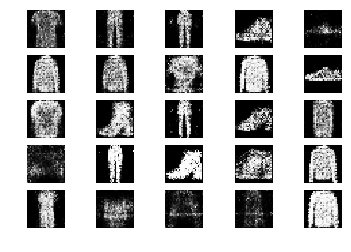

7401 [D loss: 0.614319, acc.: 65.62%] [G loss: 0.853233]
7402 [D loss: 0.639463, acc.: 60.94%] [G loss: 0.886483]
7403 [D loss: 0.659886, acc.: 59.38%] [G loss: 0.890885]
7404 [D loss: 0.650950, acc.: 54.69%] [G loss: 0.886971]
7405 [D loss: 0.616762, acc.: 64.06%] [G loss: 1.009323]
7406 [D loss: 0.690711, acc.: 56.25%] [G loss: 0.946185]
7407 [D loss: 0.680045, acc.: 57.81%] [G loss: 0.961568]
7408 [D loss: 0.644538, acc.: 57.81%] [G loss: 0.908165]
7409 [D loss: 0.645290, acc.: 65.62%] [G loss: 1.032013]
7410 [D loss: 0.664600, acc.: 51.56%] [G loss: 0.929549]
7411 [D loss: 0.707013, acc.: 53.12%] [G loss: 0.891420]
7412 [D loss: 0.655133, acc.: 57.81%] [G loss: 0.915063]
7413 [D loss: 0.689055, acc.: 57.81%] [G loss: 0.852618]
7414 [D loss: 0.641415, acc.: 67.19%] [G loss: 0.860409]
7415 [D loss: 0.655681, acc.: 59.38%] [G loss: 0.872540]
7416 [D loss: 0.688065, acc.: 60.94%] [G loss: 0.864508]
7417 [D loss: 0.623434, acc.: 70.31%] [G loss: 0.863589]
7418 [D loss: 0.702243, acc.: 5

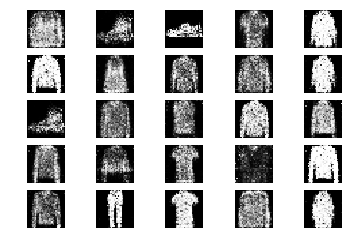

7601 [D loss: 0.661207, acc.: 57.81%] [G loss: 0.848527]
7602 [D loss: 0.677946, acc.: 53.12%] [G loss: 0.882604]
7603 [D loss: 0.609595, acc.: 64.06%] [G loss: 0.860144]
7604 [D loss: 0.609869, acc.: 68.75%] [G loss: 0.902926]
7605 [D loss: 0.644114, acc.: 60.94%] [G loss: 0.830218]
7606 [D loss: 0.658803, acc.: 59.38%] [G loss: 0.827920]
7607 [D loss: 0.706849, acc.: 56.25%] [G loss: 0.901914]
7608 [D loss: 0.636879, acc.: 62.50%] [G loss: 0.953221]
7609 [D loss: 0.605243, acc.: 68.75%] [G loss: 0.909264]
7610 [D loss: 0.614739, acc.: 60.94%] [G loss: 0.962666]
7611 [D loss: 0.648930, acc.: 60.94%] [G loss: 0.907854]
7612 [D loss: 0.653916, acc.: 64.06%] [G loss: 0.880606]
7613 [D loss: 0.673538, acc.: 60.94%] [G loss: 0.897727]
7614 [D loss: 0.614577, acc.: 64.06%] [G loss: 0.891560]
7615 [D loss: 0.694999, acc.: 48.44%] [G loss: 0.900144]
7616 [D loss: 0.685178, acc.: 57.81%] [G loss: 0.849638]
7617 [D loss: 0.615851, acc.: 60.94%] [G loss: 0.873473]
7618 [D loss: 0.647076, acc.: 6

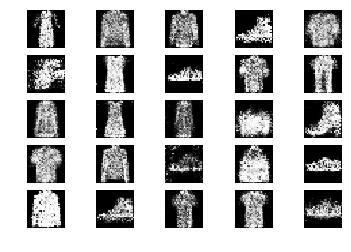

7801 [D loss: 0.641432, acc.: 60.94%] [G loss: 0.835022]
7802 [D loss: 0.635082, acc.: 64.06%] [G loss: 0.922893]
7803 [D loss: 0.643002, acc.: 67.19%] [G loss: 1.030139]
7804 [D loss: 0.654856, acc.: 62.50%] [G loss: 0.960755]
7805 [D loss: 0.674614, acc.: 59.38%] [G loss: 0.960998]
7806 [D loss: 0.613611, acc.: 65.62%] [G loss: 0.857477]
7807 [D loss: 0.657588, acc.: 62.50%] [G loss: 0.855294]
7808 [D loss: 0.680683, acc.: 57.81%] [G loss: 0.892006]
7809 [D loss: 0.691871, acc.: 56.25%] [G loss: 0.935638]
7810 [D loss: 0.722373, acc.: 51.56%] [G loss: 0.868908]
7811 [D loss: 0.623488, acc.: 67.19%] [G loss: 0.833502]
7812 [D loss: 0.641839, acc.: 64.06%] [G loss: 0.943192]
7813 [D loss: 0.704917, acc.: 59.38%] [G loss: 0.882445]
7814 [D loss: 0.660655, acc.: 67.19%] [G loss: 0.947611]
7815 [D loss: 0.682365, acc.: 60.94%] [G loss: 0.884547]
7816 [D loss: 0.623743, acc.: 68.75%] [G loss: 0.909417]
7817 [D loss: 0.612997, acc.: 65.62%] [G loss: 0.879560]
7818 [D loss: 0.708885, acc.: 5

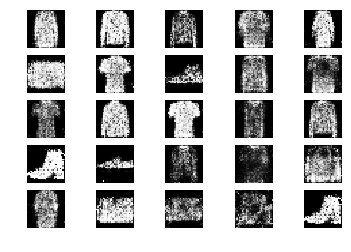

8001 [D loss: 0.653963, acc.: 60.94%] [G loss: 0.815153]
8002 [D loss: 0.665831, acc.: 60.94%] [G loss: 0.837821]
8003 [D loss: 0.697881, acc.: 56.25%] [G loss: 0.901024]
8004 [D loss: 0.657439, acc.: 64.06%] [G loss: 0.906761]
8005 [D loss: 0.598310, acc.: 68.75%] [G loss: 0.928516]
8006 [D loss: 0.649242, acc.: 67.19%] [G loss: 0.869241]
8007 [D loss: 0.633885, acc.: 71.88%] [G loss: 0.938780]
8008 [D loss: 0.650454, acc.: 65.62%] [G loss: 0.931981]
8009 [D loss: 0.620819, acc.: 68.75%] [G loss: 0.891514]
8010 [D loss: 0.660936, acc.: 60.94%] [G loss: 0.955824]
8011 [D loss: 0.609887, acc.: 70.31%] [G loss: 0.966379]
8012 [D loss: 0.659798, acc.: 64.06%] [G loss: 0.879578]
8013 [D loss: 0.693997, acc.: 56.25%] [G loss: 0.968190]
8014 [D loss: 0.691840, acc.: 54.69%] [G loss: 0.905300]
8015 [D loss: 0.634830, acc.: 67.19%] [G loss: 0.889024]
8016 [D loss: 0.616481, acc.: 67.19%] [G loss: 0.951198]
8017 [D loss: 0.675793, acc.: 54.69%] [G loss: 0.910538]
8018 [D loss: 0.638462, acc.: 6

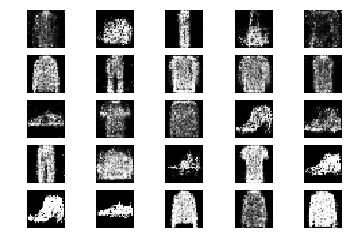

8201 [D loss: 0.677441, acc.: 64.06%] [G loss: 0.910247]
8202 [D loss: 0.667070, acc.: 59.38%] [G loss: 0.937317]
8203 [D loss: 0.616911, acc.: 60.94%] [G loss: 0.972263]
8204 [D loss: 0.681426, acc.: 59.38%] [G loss: 0.934342]
8205 [D loss: 0.623157, acc.: 62.50%] [G loss: 0.900438]
8206 [D loss: 0.627682, acc.: 65.62%] [G loss: 0.808930]
8207 [D loss: 0.651045, acc.: 62.50%] [G loss: 0.853050]
8208 [D loss: 0.655001, acc.: 60.94%] [G loss: 0.779271]
8209 [D loss: 0.688755, acc.: 62.50%] [G loss: 0.807120]
8210 [D loss: 0.622336, acc.: 68.75%] [G loss: 0.817054]
8211 [D loss: 0.673946, acc.: 57.81%] [G loss: 0.866511]
8212 [D loss: 0.638318, acc.: 64.06%] [G loss: 0.809190]
8213 [D loss: 0.612427, acc.: 70.31%] [G loss: 0.839707]
8214 [D loss: 0.688629, acc.: 53.12%] [G loss: 0.874179]
8215 [D loss: 0.650189, acc.: 65.62%] [G loss: 0.867073]
8216 [D loss: 0.678746, acc.: 53.12%] [G loss: 0.873910]
8217 [D loss: 0.784955, acc.: 53.12%] [G loss: 0.895359]
8218 [D loss: 0.672814, acc.: 5

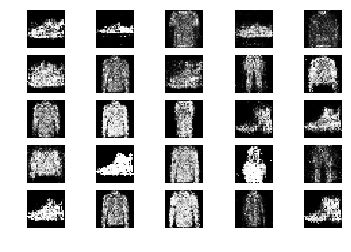

8401 [D loss: 0.700363, acc.: 51.56%] [G loss: 0.783669]
8402 [D loss: 0.708793, acc.: 62.50%] [G loss: 0.796697]
8403 [D loss: 0.660571, acc.: 60.94%] [G loss: 0.847913]
8404 [D loss: 0.689891, acc.: 59.38%] [G loss: 0.918567]
8405 [D loss: 0.634002, acc.: 59.38%] [G loss: 0.804084]
8406 [D loss: 0.675298, acc.: 65.62%] [G loss: 0.856533]
8407 [D loss: 0.606120, acc.: 73.44%] [G loss: 0.978136]
8408 [D loss: 0.657893, acc.: 65.62%] [G loss: 0.998442]
8409 [D loss: 0.712106, acc.: 53.12%] [G loss: 0.914508]
8410 [D loss: 0.607251, acc.: 62.50%] [G loss: 0.864826]
8411 [D loss: 0.683942, acc.: 56.25%] [G loss: 0.851878]
8412 [D loss: 0.676321, acc.: 65.62%] [G loss: 0.891965]
8413 [D loss: 0.648113, acc.: 54.69%] [G loss: 0.795222]
8414 [D loss: 0.680622, acc.: 56.25%] [G loss: 0.856517]
8415 [D loss: 0.622116, acc.: 60.94%] [G loss: 0.805516]
8416 [D loss: 0.640234, acc.: 73.44%] [G loss: 0.875411]
8417 [D loss: 0.608008, acc.: 68.75%] [G loss: 0.948740]
8418 [D loss: 0.655019, acc.: 6

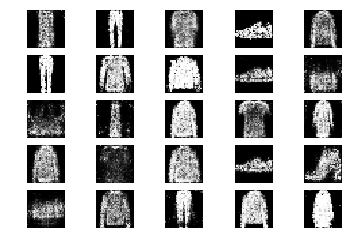

8601 [D loss: 0.730243, acc.: 48.44%] [G loss: 0.918516]
8602 [D loss: 0.677507, acc.: 62.50%] [G loss: 1.067079]
8603 [D loss: 0.708889, acc.: 46.88%] [G loss: 0.935068]
8604 [D loss: 0.670552, acc.: 53.12%] [G loss: 0.907792]
8605 [D loss: 0.641348, acc.: 64.06%] [G loss: 0.916729]
8606 [D loss: 0.675332, acc.: 65.62%] [G loss: 0.813996]
8607 [D loss: 0.663873, acc.: 60.94%] [G loss: 0.847051]
8608 [D loss: 0.705594, acc.: 51.56%] [G loss: 0.883898]
8609 [D loss: 0.686174, acc.: 46.88%] [G loss: 0.891413]
8610 [D loss: 0.720317, acc.: 42.19%] [G loss: 0.816791]
8611 [D loss: 0.709900, acc.: 56.25%] [G loss: 0.830867]
8612 [D loss: 0.657938, acc.: 65.62%] [G loss: 0.798946]
8613 [D loss: 0.554343, acc.: 82.81%] [G loss: 0.876665]
8614 [D loss: 0.687483, acc.: 64.06%] [G loss: 0.807582]
8615 [D loss: 0.632644, acc.: 62.50%] [G loss: 0.746515]
8616 [D loss: 0.653505, acc.: 67.19%] [G loss: 0.792436]
8617 [D loss: 0.694979, acc.: 57.81%] [G loss: 0.834383]
8618 [D loss: 0.596939, acc.: 6

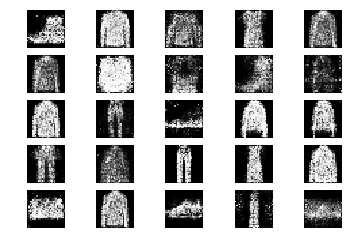

8801 [D loss: 0.656821, acc.: 56.25%] [G loss: 0.888137]
8802 [D loss: 0.656989, acc.: 51.56%] [G loss: 0.980407]
8803 [D loss: 0.623679, acc.: 67.19%] [G loss: 0.904984]
8804 [D loss: 0.682090, acc.: 59.38%] [G loss: 0.931801]
8805 [D loss: 0.658033, acc.: 51.56%] [G loss: 0.863500]
8806 [D loss: 0.661881, acc.: 56.25%] [G loss: 0.877196]
8807 [D loss: 0.677072, acc.: 50.00%] [G loss: 0.840946]
8808 [D loss: 0.669217, acc.: 60.94%] [G loss: 0.868120]
8809 [D loss: 0.681755, acc.: 54.69%] [G loss: 0.909200]
8810 [D loss: 0.677340, acc.: 56.25%] [G loss: 0.864475]
8811 [D loss: 0.622392, acc.: 71.88%] [G loss: 0.887689]
8812 [D loss: 0.636771, acc.: 59.38%] [G loss: 0.847933]
8813 [D loss: 0.641738, acc.: 62.50%] [G loss: 0.942507]
8814 [D loss: 0.660586, acc.: 64.06%] [G loss: 0.983698]
8815 [D loss: 0.652913, acc.: 64.06%] [G loss: 0.970040]
8816 [D loss: 0.722435, acc.: 42.19%] [G loss: 0.910913]
8817 [D loss: 0.664501, acc.: 57.81%] [G loss: 0.884836]
8818 [D loss: 0.704971, acc.: 5

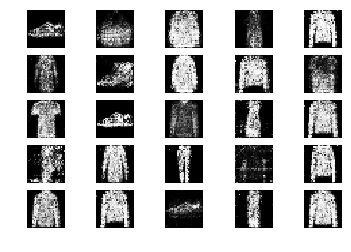

9001 [D loss: 0.659104, acc.: 60.94%] [G loss: 0.944703]
9002 [D loss: 0.680205, acc.: 67.19%] [G loss: 0.913215]
9003 [D loss: 0.659007, acc.: 64.06%] [G loss: 0.938177]
9004 [D loss: 0.638161, acc.: 59.38%] [G loss: 0.956135]
9005 [D loss: 0.727106, acc.: 54.69%] [G loss: 0.991510]
9006 [D loss: 0.660014, acc.: 59.38%] [G loss: 0.850031]
9007 [D loss: 0.660321, acc.: 57.81%] [G loss: 0.894957]
9008 [D loss: 0.641055, acc.: 65.62%] [G loss: 0.875463]
9009 [D loss: 0.693142, acc.: 51.56%] [G loss: 0.781630]
9010 [D loss: 0.650302, acc.: 64.06%] [G loss: 0.893055]
9011 [D loss: 0.644437, acc.: 62.50%] [G loss: 0.856338]
9012 [D loss: 0.662906, acc.: 62.50%] [G loss: 0.901147]
9013 [D loss: 0.676281, acc.: 54.69%] [G loss: 0.991066]
9014 [D loss: 0.611370, acc.: 68.75%] [G loss: 0.924029]
9015 [D loss: 0.664933, acc.: 64.06%] [G loss: 0.905564]
9016 [D loss: 0.655138, acc.: 62.50%] [G loss: 0.882647]
9017 [D loss: 0.678487, acc.: 51.56%] [G loss: 0.888648]
9018 [D loss: 0.631220, acc.: 6

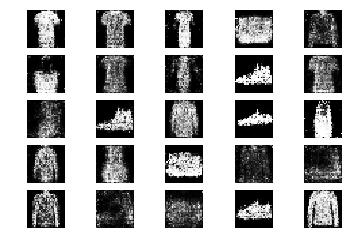

9201 [D loss: 0.672914, acc.: 60.94%] [G loss: 0.896900]
9202 [D loss: 0.722131, acc.: 45.31%] [G loss: 0.848935]
9203 [D loss: 0.649590, acc.: 64.06%] [G loss: 0.914830]
9204 [D loss: 0.619911, acc.: 71.88%] [G loss: 0.928278]
9205 [D loss: 0.662975, acc.: 68.75%] [G loss: 0.871223]
9206 [D loss: 0.636204, acc.: 64.06%] [G loss: 0.845207]
9207 [D loss: 0.744255, acc.: 46.88%] [G loss: 0.865278]
9208 [D loss: 0.632884, acc.: 68.75%] [G loss: 0.908390]
9209 [D loss: 0.621150, acc.: 68.75%] [G loss: 0.879722]
9210 [D loss: 0.641118, acc.: 68.75%] [G loss: 0.889676]
9211 [D loss: 0.650644, acc.: 60.94%] [G loss: 0.853876]
9212 [D loss: 0.713743, acc.: 54.69%] [G loss: 0.886982]
9213 [D loss: 0.704629, acc.: 59.38%] [G loss: 0.860129]
9214 [D loss: 0.672618, acc.: 60.94%] [G loss: 0.884181]
9215 [D loss: 0.720314, acc.: 62.50%] [G loss: 0.920312]
9216 [D loss: 0.633092, acc.: 71.88%] [G loss: 0.911057]
9217 [D loss: 0.685876, acc.: 56.25%] [G loss: 0.926074]
9218 [D loss: 0.670756, acc.: 6

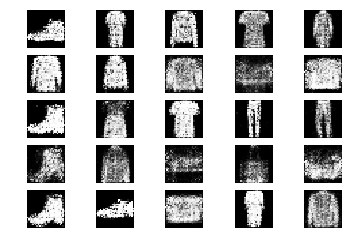

9401 [D loss: 0.637749, acc.: 64.06%] [G loss: 0.921220]
9402 [D loss: 0.727285, acc.: 53.12%] [G loss: 0.858032]
9403 [D loss: 0.678458, acc.: 50.00%] [G loss: 0.809248]
9404 [D loss: 0.655510, acc.: 67.19%] [G loss: 0.931851]
9405 [D loss: 0.652863, acc.: 64.06%] [G loss: 0.886915]
9406 [D loss: 0.696542, acc.: 42.19%] [G loss: 0.825896]
9407 [D loss: 0.658806, acc.: 57.81%] [G loss: 0.902996]
9408 [D loss: 0.677106, acc.: 62.50%] [G loss: 0.880121]
9409 [D loss: 0.603505, acc.: 65.62%] [G loss: 0.778260]
9410 [D loss: 0.686785, acc.: 54.69%] [G loss: 0.808264]
9411 [D loss: 0.710071, acc.: 56.25%] [G loss: 1.007893]
9412 [D loss: 0.688557, acc.: 56.25%] [G loss: 0.829380]
9413 [D loss: 0.635852, acc.: 67.19%] [G loss: 0.910076]
9414 [D loss: 0.670262, acc.: 60.94%] [G loss: 0.926154]
9415 [D loss: 0.702816, acc.: 54.69%] [G loss: 0.963962]
9416 [D loss: 0.689595, acc.: 56.25%] [G loss: 0.933101]
9417 [D loss: 0.732054, acc.: 43.75%] [G loss: 0.901407]
9418 [D loss: 0.671747, acc.: 5

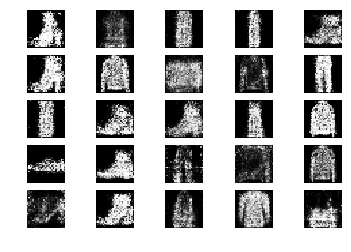

9601 [D loss: 0.611019, acc.: 75.00%] [G loss: 0.828968]
9602 [D loss: 0.674902, acc.: 51.56%] [G loss: 0.840168]
9603 [D loss: 0.655590, acc.: 57.81%] [G loss: 0.879822]
9604 [D loss: 0.674919, acc.: 57.81%] [G loss: 0.884502]
9605 [D loss: 0.658082, acc.: 60.94%] [G loss: 0.883324]
9606 [D loss: 0.672468, acc.: 56.25%] [G loss: 0.808452]
9607 [D loss: 0.657483, acc.: 59.38%] [G loss: 0.895925]
9608 [D loss: 0.661442, acc.: 60.94%] [G loss: 0.848501]
9609 [D loss: 0.706577, acc.: 53.12%] [G loss: 0.857878]
9610 [D loss: 0.661399, acc.: 64.06%] [G loss: 0.799828]
9611 [D loss: 0.629527, acc.: 67.19%] [G loss: 0.862142]
9612 [D loss: 0.652339, acc.: 59.38%] [G loss: 0.880507]
9613 [D loss: 0.673030, acc.: 59.38%] [G loss: 0.914921]
9614 [D loss: 0.644183, acc.: 64.06%] [G loss: 0.887371]
9615 [D loss: 0.639296, acc.: 62.50%] [G loss: 0.908169]
9616 [D loss: 0.675175, acc.: 46.88%] [G loss: 0.853371]
9617 [D loss: 0.594340, acc.: 68.75%] [G loss: 0.879949]
9618 [D loss: 0.694403, acc.: 5

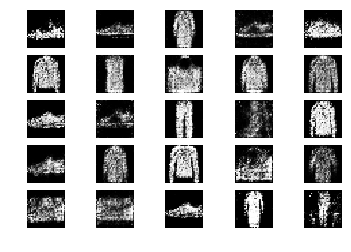

9801 [D loss: 0.706523, acc.: 53.12%] [G loss: 0.848649]
9802 [D loss: 0.729674, acc.: 45.31%] [G loss: 0.826140]
9803 [D loss: 0.633797, acc.: 64.06%] [G loss: 0.903334]
9804 [D loss: 0.681014, acc.: 57.81%] [G loss: 0.812511]
9805 [D loss: 0.629573, acc.: 68.75%] [G loss: 0.830197]
9806 [D loss: 0.674486, acc.: 60.94%] [G loss: 0.893720]
9807 [D loss: 0.648089, acc.: 62.50%] [G loss: 0.924057]
9808 [D loss: 0.655422, acc.: 60.94%] [G loss: 0.946975]
9809 [D loss: 0.655576, acc.: 54.69%] [G loss: 0.921120]
9810 [D loss: 0.636428, acc.: 65.62%] [G loss: 0.898648]
9811 [D loss: 0.643000, acc.: 65.62%] [G loss: 0.977097]
9812 [D loss: 0.613167, acc.: 62.50%] [G loss: 0.905914]
9813 [D loss: 0.674776, acc.: 53.12%] [G loss: 0.937055]
9814 [D loss: 0.664033, acc.: 62.50%] [G loss: 0.948156]
9815 [D loss: 0.646980, acc.: 57.81%] [G loss: 0.914860]
9816 [D loss: 0.627442, acc.: 70.31%] [G loss: 0.868363]
9817 [D loss: 0.635670, acc.: 60.94%] [G loss: 0.819463]
9818 [D loss: 0.686094, acc.: 5

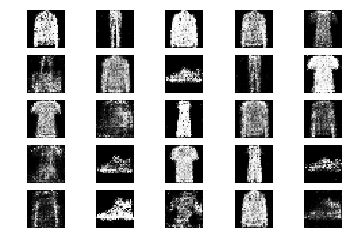

10001 [D loss: 0.749354, acc.: 57.81%] [G loss: 0.957295]
10002 [D loss: 0.633627, acc.: 62.50%] [G loss: 0.958428]
10003 [D loss: 0.704990, acc.: 54.69%] [G loss: 0.811651]
10004 [D loss: 0.695759, acc.: 51.56%] [G loss: 0.778119]
10005 [D loss: 0.626883, acc.: 71.88%] [G loss: 0.809115]
10006 [D loss: 0.667047, acc.: 60.94%] [G loss: 0.852795]
10007 [D loss: 0.680118, acc.: 56.25%] [G loss: 0.942286]
10008 [D loss: 0.662015, acc.: 59.38%] [G loss: 0.908483]
10009 [D loss: 0.687526, acc.: 53.12%] [G loss: 0.944167]
10010 [D loss: 0.613292, acc.: 75.00%] [G loss: 0.902632]
10011 [D loss: 0.667085, acc.: 60.94%] [G loss: 0.904580]
10012 [D loss: 0.648702, acc.: 62.50%] [G loss: 0.966282]
10013 [D loss: 0.682653, acc.: 54.69%] [G loss: 0.845261]
10014 [D loss: 0.731684, acc.: 46.88%] [G loss: 0.815124]
10015 [D loss: 0.705939, acc.: 48.44%] [G loss: 0.824654]
10016 [D loss: 0.679476, acc.: 59.38%] [G loss: 0.899174]
10017 [D loss: 0.611161, acc.: 65.62%] [G loss: 0.881799]
10018 [D loss:

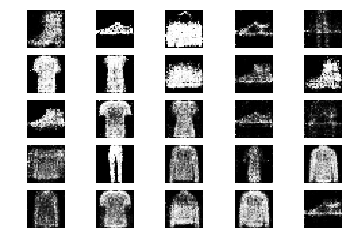

10201 [D loss: 0.643832, acc.: 64.06%] [G loss: 0.933931]
10202 [D loss: 0.643705, acc.: 64.06%] [G loss: 0.895716]
10203 [D loss: 0.628804, acc.: 65.62%] [G loss: 0.891303]
10204 [D loss: 0.624090, acc.: 62.50%] [G loss: 0.879195]
10205 [D loss: 0.642824, acc.: 65.62%] [G loss: 0.832017]
10206 [D loss: 0.673460, acc.: 59.38%] [G loss: 0.843976]
10207 [D loss: 0.612855, acc.: 67.19%] [G loss: 0.909169]
10208 [D loss: 0.671082, acc.: 56.25%] [G loss: 0.861969]
10209 [D loss: 0.655925, acc.: 59.38%] [G loss: 0.866176]
10210 [D loss: 0.637958, acc.: 60.94%] [G loss: 0.910850]
10211 [D loss: 0.632793, acc.: 70.31%] [G loss: 0.944944]
10212 [D loss: 0.695566, acc.: 56.25%] [G loss: 0.903915]
10213 [D loss: 0.578889, acc.: 73.44%] [G loss: 0.938640]
10214 [D loss: 0.612480, acc.: 65.62%] [G loss: 0.892101]
10215 [D loss: 0.628391, acc.: 65.62%] [G loss: 0.918264]
10216 [D loss: 0.631901, acc.: 64.06%] [G loss: 0.857206]
10217 [D loss: 0.642927, acc.: 64.06%] [G loss: 0.860860]
10218 [D loss:

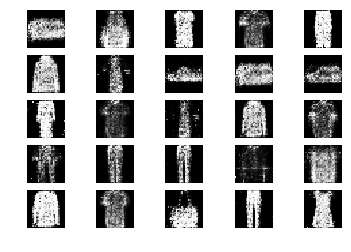

10401 [D loss: 0.670160, acc.: 57.81%] [G loss: 0.827797]
10402 [D loss: 0.644526, acc.: 57.81%] [G loss: 0.849958]
10403 [D loss: 0.625169, acc.: 73.44%] [G loss: 0.870108]
10404 [D loss: 0.658774, acc.: 60.94%] [G loss: 0.831757]
10405 [D loss: 0.688860, acc.: 56.25%] [G loss: 0.872846]
10406 [D loss: 0.700226, acc.: 56.25%] [G loss: 0.974636]
10407 [D loss: 0.638478, acc.: 65.62%] [G loss: 0.960150]
10408 [D loss: 0.655823, acc.: 54.69%] [G loss: 0.844201]
10409 [D loss: 0.604020, acc.: 75.00%] [G loss: 0.830635]
10410 [D loss: 0.633126, acc.: 67.19%] [G loss: 0.899391]
10411 [D loss: 0.693585, acc.: 54.69%] [G loss: 0.859878]
10412 [D loss: 0.667504, acc.: 54.69%] [G loss: 0.870725]
10413 [D loss: 0.639708, acc.: 60.94%] [G loss: 0.949283]
10414 [D loss: 0.618780, acc.: 65.62%] [G loss: 0.917408]
10415 [D loss: 0.678786, acc.: 56.25%] [G loss: 0.918339]
10416 [D loss: 0.665093, acc.: 59.38%] [G loss: 0.875264]
10417 [D loss: 0.660735, acc.: 57.81%] [G loss: 0.848427]
10418 [D loss:

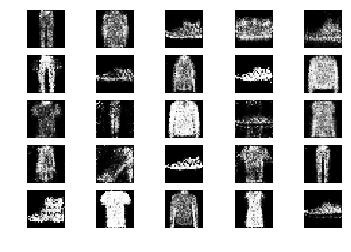

10601 [D loss: 0.626211, acc.: 68.75%] [G loss: 0.843771]
10602 [D loss: 0.631171, acc.: 68.75%] [G loss: 0.880457]
10603 [D loss: 0.624743, acc.: 70.31%] [G loss: 0.909376]
10604 [D loss: 0.662184, acc.: 60.94%] [G loss: 0.829176]
10605 [D loss: 0.619598, acc.: 64.06%] [G loss: 0.829613]
10606 [D loss: 0.635105, acc.: 64.06%] [G loss: 0.864190]
10607 [D loss: 0.681855, acc.: 59.38%] [G loss: 0.832589]
10608 [D loss: 0.664854, acc.: 60.94%] [G loss: 0.884891]
10609 [D loss: 0.670203, acc.: 59.38%] [G loss: 0.802472]
10610 [D loss: 0.624613, acc.: 70.31%] [G loss: 0.869237]
10611 [D loss: 0.672094, acc.: 65.62%] [G loss: 0.882458]
10612 [D loss: 0.601722, acc.: 70.31%] [G loss: 0.898585]
10613 [D loss: 0.692160, acc.: 51.56%] [G loss: 0.904512]
10614 [D loss: 0.699791, acc.: 54.69%] [G loss: 0.867314]
10615 [D loss: 0.705071, acc.: 59.38%] [G loss: 0.813526]
10616 [D loss: 0.615024, acc.: 70.31%] [G loss: 0.832065]
10617 [D loss: 0.658873, acc.: 62.50%] [G loss: 0.909037]
10618 [D loss:

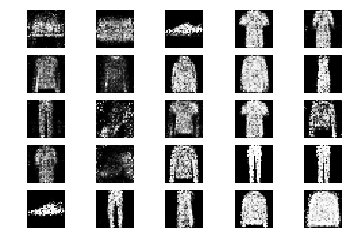

10801 [D loss: 0.638972, acc.: 56.25%] [G loss: 0.899672]
10802 [D loss: 0.677026, acc.: 64.06%] [G loss: 0.817171]
10803 [D loss: 0.650731, acc.: 62.50%] [G loss: 0.844808]
10804 [D loss: 0.681844, acc.: 48.44%] [G loss: 0.884594]
10805 [D loss: 0.601006, acc.: 67.19%] [G loss: 0.938712]
10806 [D loss: 0.659041, acc.: 54.69%] [G loss: 0.911840]
10807 [D loss: 0.627893, acc.: 62.50%] [G loss: 0.835214]
10808 [D loss: 0.633039, acc.: 65.62%] [G loss: 0.888463]
10809 [D loss: 0.644007, acc.: 60.94%] [G loss: 0.882997]
10810 [D loss: 0.662355, acc.: 56.25%] [G loss: 0.888569]
10811 [D loss: 0.633001, acc.: 67.19%] [G loss: 0.847976]
10812 [D loss: 0.668312, acc.: 64.06%] [G loss: 0.902861]
10813 [D loss: 0.681854, acc.: 56.25%] [G loss: 0.836248]
10814 [D loss: 0.675986, acc.: 62.50%] [G loss: 0.840933]
10815 [D loss: 0.665343, acc.: 56.25%] [G loss: 0.887004]
10816 [D loss: 0.628807, acc.: 65.62%] [G loss: 0.851783]
10817 [D loss: 0.611388, acc.: 73.44%] [G loss: 0.885961]
10818 [D loss:

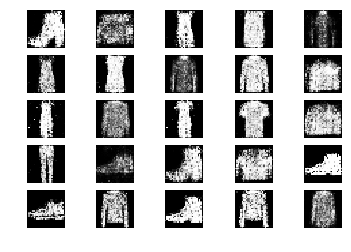

11001 [D loss: 0.616609, acc.: 67.19%] [G loss: 0.924083]
11002 [D loss: 0.751967, acc.: 43.75%] [G loss: 0.907984]
11003 [D loss: 0.687449, acc.: 59.38%] [G loss: 0.967817]
11004 [D loss: 0.647076, acc.: 56.25%] [G loss: 0.923221]
11005 [D loss: 0.652500, acc.: 56.25%] [G loss: 1.001885]
11006 [D loss: 0.690360, acc.: 59.38%] [G loss: 0.835621]
11007 [D loss: 0.661759, acc.: 62.50%] [G loss: 0.898283]
11008 [D loss: 0.643462, acc.: 56.25%] [G loss: 0.871760]
11009 [D loss: 0.636802, acc.: 64.06%] [G loss: 0.904977]
11010 [D loss: 0.663512, acc.: 57.81%] [G loss: 0.890718]
11011 [D loss: 0.605949, acc.: 64.06%] [G loss: 0.848084]
11012 [D loss: 0.671562, acc.: 60.94%] [G loss: 0.871955]
11013 [D loss: 0.654422, acc.: 64.06%] [G loss: 0.836756]
11014 [D loss: 0.617676, acc.: 68.75%] [G loss: 0.895380]
11015 [D loss: 0.666215, acc.: 60.94%] [G loss: 0.870341]
11016 [D loss: 0.569540, acc.: 75.00%] [G loss: 0.841955]
11017 [D loss: 0.699801, acc.: 54.69%] [G loss: 0.871960]
11018 [D loss:

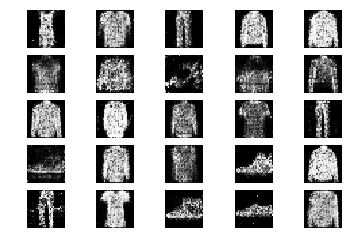

11201 [D loss: 0.664029, acc.: 64.06%] [G loss: 0.848933]
11202 [D loss: 0.647796, acc.: 65.62%] [G loss: 0.938139]
11203 [D loss: 0.639266, acc.: 60.94%] [G loss: 0.829081]
11204 [D loss: 0.634520, acc.: 67.19%] [G loss: 0.810849]
11205 [D loss: 0.595682, acc.: 67.19%] [G loss: 0.900169]
11206 [D loss: 0.632603, acc.: 62.50%] [G loss: 0.886455]
11207 [D loss: 0.647271, acc.: 73.44%] [G loss: 0.828617]
11208 [D loss: 0.636551, acc.: 64.06%] [G loss: 0.900671]
11209 [D loss: 0.624364, acc.: 65.62%] [G loss: 0.906785]
11210 [D loss: 0.608430, acc.: 67.19%] [G loss: 0.903336]
11211 [D loss: 0.678122, acc.: 60.94%] [G loss: 0.948899]
11212 [D loss: 0.707889, acc.: 56.25%] [G loss: 0.891522]
11213 [D loss: 0.652042, acc.: 65.62%] [G loss: 0.789389]
11214 [D loss: 0.631903, acc.: 59.38%] [G loss: 0.795892]
11215 [D loss: 0.642811, acc.: 57.81%] [G loss: 0.847600]
11216 [D loss: 0.619038, acc.: 71.88%] [G loss: 0.870794]
11217 [D loss: 0.608863, acc.: 64.06%] [G loss: 0.917595]
11218 [D loss:

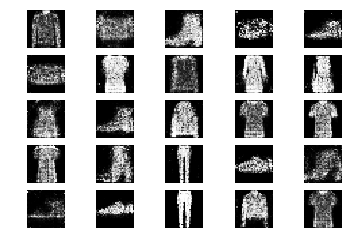

11401 [D loss: 0.691029, acc.: 57.81%] [G loss: 0.919225]
11402 [D loss: 0.651928, acc.: 60.94%] [G loss: 0.901791]
11403 [D loss: 0.710588, acc.: 57.81%] [G loss: 0.895909]
11404 [D loss: 0.646406, acc.: 62.50%] [G loss: 0.868555]
11405 [D loss: 0.638105, acc.: 65.62%] [G loss: 0.847769]
11406 [D loss: 0.623860, acc.: 70.31%] [G loss: 0.895510]
11407 [D loss: 0.635413, acc.: 70.31%] [G loss: 0.886141]
11408 [D loss: 0.617467, acc.: 64.06%] [G loss: 0.828049]
11409 [D loss: 0.670265, acc.: 62.50%] [G loss: 0.806468]
11410 [D loss: 0.677333, acc.: 53.12%] [G loss: 0.961334]
11411 [D loss: 0.642497, acc.: 64.06%] [G loss: 0.876822]
11412 [D loss: 0.683716, acc.: 57.81%] [G loss: 0.896133]
11413 [D loss: 0.666933, acc.: 60.94%] [G loss: 0.852685]
11414 [D loss: 0.650000, acc.: 60.94%] [G loss: 0.884767]
11415 [D loss: 0.666991, acc.: 56.25%] [G loss: 0.924207]
11416 [D loss: 0.639454, acc.: 70.31%] [G loss: 0.897668]
11417 [D loss: 0.661733, acc.: 59.38%] [G loss: 0.864034]
11418 [D loss:

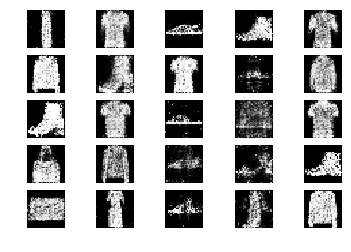

11601 [D loss: 0.668451, acc.: 54.69%] [G loss: 0.917056]
11602 [D loss: 0.659050, acc.: 57.81%] [G loss: 0.880495]
11603 [D loss: 0.660343, acc.: 68.75%] [G loss: 0.870131]
11604 [D loss: 0.738445, acc.: 56.25%] [G loss: 0.844180]
11605 [D loss: 0.635619, acc.: 62.50%] [G loss: 0.797066]
11606 [D loss: 0.657866, acc.: 54.69%] [G loss: 0.892539]
11607 [D loss: 0.634278, acc.: 64.06%] [G loss: 0.909598]
11608 [D loss: 0.661185, acc.: 59.38%] [G loss: 0.843786]
11609 [D loss: 0.645831, acc.: 57.81%] [G loss: 0.917831]
11610 [D loss: 0.608626, acc.: 70.31%] [G loss: 0.914954]
11611 [D loss: 0.564171, acc.: 71.88%] [G loss: 0.988046]
11612 [D loss: 0.762161, acc.: 51.56%] [G loss: 0.855621]
11613 [D loss: 0.675045, acc.: 57.81%] [G loss: 0.845049]
11614 [D loss: 0.641264, acc.: 64.06%] [G loss: 0.892134]
11615 [D loss: 0.602922, acc.: 65.62%] [G loss: 0.920195]
11616 [D loss: 0.673058, acc.: 59.38%] [G loss: 0.883042]
11617 [D loss: 0.632990, acc.: 71.88%] [G loss: 0.913105]
11618 [D loss:

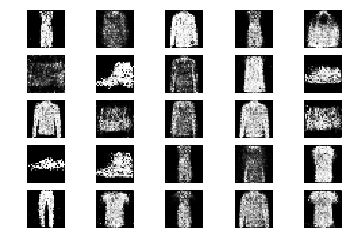

11801 [D loss: 0.707267, acc.: 54.69%] [G loss: 0.885324]
11802 [D loss: 0.667820, acc.: 53.12%] [G loss: 0.869581]
11803 [D loss: 0.649699, acc.: 60.94%] [G loss: 0.757628]
11804 [D loss: 0.674308, acc.: 53.12%] [G loss: 0.876566]
11805 [D loss: 0.731008, acc.: 51.56%] [G loss: 0.897779]
11806 [D loss: 0.628590, acc.: 64.06%] [G loss: 0.926434]
11807 [D loss: 0.713632, acc.: 45.31%] [G loss: 0.834936]
11808 [D loss: 0.660780, acc.: 56.25%] [G loss: 0.887440]
11809 [D loss: 0.602545, acc.: 75.00%] [G loss: 0.880308]
11810 [D loss: 0.640152, acc.: 65.62%] [G loss: 0.848462]
11811 [D loss: 0.635457, acc.: 62.50%] [G loss: 0.856717]
11812 [D loss: 0.732753, acc.: 53.12%] [G loss: 0.855023]
11813 [D loss: 0.700603, acc.: 59.38%] [G loss: 0.890161]
11814 [D loss: 0.656971, acc.: 60.94%] [G loss: 0.892138]
11815 [D loss: 0.691286, acc.: 54.69%] [G loss: 0.950521]
11816 [D loss: 0.703809, acc.: 54.69%] [G loss: 0.968294]
11817 [D loss: 0.674675, acc.: 54.69%] [G loss: 0.877981]
11818 [D loss:

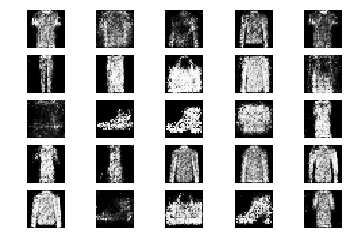

12001 [D loss: 0.636594, acc.: 64.06%] [G loss: 0.883744]
12002 [D loss: 0.700788, acc.: 57.81%] [G loss: 0.898160]
12003 [D loss: 0.693546, acc.: 62.50%] [G loss: 0.862602]
12004 [D loss: 0.672493, acc.: 50.00%] [G loss: 0.941884]
12005 [D loss: 0.731976, acc.: 45.31%] [G loss: 0.960967]
12006 [D loss: 0.655126, acc.: 57.81%] [G loss: 0.944032]
12007 [D loss: 0.659829, acc.: 59.38%] [G loss: 0.983228]
12008 [D loss: 0.711543, acc.: 50.00%] [G loss: 0.890677]
12009 [D loss: 0.629878, acc.: 71.88%] [G loss: 0.886930]
12010 [D loss: 0.703695, acc.: 51.56%] [G loss: 0.907148]
12011 [D loss: 0.652113, acc.: 56.25%] [G loss: 0.889870]
12012 [D loss: 0.630591, acc.: 64.06%] [G loss: 0.917370]
12013 [D loss: 0.708938, acc.: 50.00%] [G loss: 0.922084]
12014 [D loss: 0.661015, acc.: 56.25%] [G loss: 0.931367]
12015 [D loss: 0.702014, acc.: 53.12%] [G loss: 0.856332]
12016 [D loss: 0.701617, acc.: 56.25%] [G loss: 0.897910]
12017 [D loss: 0.675671, acc.: 62.50%] [G loss: 0.937082]
12018 [D loss:

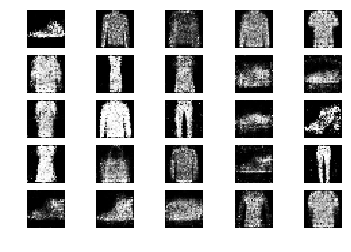

12201 [D loss: 0.626253, acc.: 64.06%] [G loss: 0.861903]
12202 [D loss: 0.636263, acc.: 62.50%] [G loss: 0.933429]
12203 [D loss: 0.674394, acc.: 60.94%] [G loss: 0.878833]
12204 [D loss: 0.592783, acc.: 67.19%] [G loss: 0.839953]
12205 [D loss: 0.622604, acc.: 71.88%] [G loss: 0.858873]
12206 [D loss: 0.699119, acc.: 53.12%] [G loss: 0.817064]
12207 [D loss: 0.661510, acc.: 53.12%] [G loss: 0.804429]
12208 [D loss: 0.675260, acc.: 59.38%] [G loss: 0.735182]
12209 [D loss: 0.689953, acc.: 53.12%] [G loss: 0.859735]
12210 [D loss: 0.648365, acc.: 68.75%] [G loss: 0.894423]
12211 [D loss: 0.701538, acc.: 53.12%] [G loss: 0.960671]
12212 [D loss: 0.639202, acc.: 57.81%] [G loss: 0.904977]
12213 [D loss: 0.677052, acc.: 54.69%] [G loss: 0.886176]
12214 [D loss: 0.631668, acc.: 62.50%] [G loss: 0.848417]
12215 [D loss: 0.670073, acc.: 64.06%] [G loss: 0.782889]
12216 [D loss: 0.768243, acc.: 42.19%] [G loss: 0.822074]
12217 [D loss: 0.688456, acc.: 54.69%] [G loss: 0.786710]
12218 [D loss:

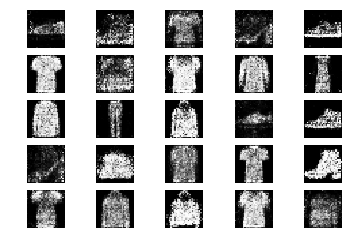

12401 [D loss: 0.623707, acc.: 68.75%] [G loss: 0.798124]
12402 [D loss: 0.634574, acc.: 65.62%] [G loss: 0.874344]
12403 [D loss: 0.702659, acc.: 46.88%] [G loss: 0.807939]
12404 [D loss: 0.632970, acc.: 57.81%] [G loss: 0.862487]
12405 [D loss: 0.627469, acc.: 67.19%] [G loss: 0.835597]
12406 [D loss: 0.671828, acc.: 60.94%] [G loss: 0.950785]
12407 [D loss: 0.631268, acc.: 65.62%] [G loss: 0.879807]
12408 [D loss: 0.657266, acc.: 57.81%] [G loss: 0.916399]
12409 [D loss: 0.714254, acc.: 42.19%] [G loss: 0.910823]
12410 [D loss: 0.626405, acc.: 67.19%] [G loss: 0.904942]
12411 [D loss: 0.699190, acc.: 51.56%] [G loss: 0.894175]
12412 [D loss: 0.723995, acc.: 57.81%] [G loss: 0.891673]
12413 [D loss: 0.626706, acc.: 65.62%] [G loss: 0.809486]
12414 [D loss: 0.658319, acc.: 62.50%] [G loss: 0.906530]
12415 [D loss: 0.706800, acc.: 50.00%] [G loss: 0.942768]
12416 [D loss: 0.699795, acc.: 54.69%] [G loss: 0.895174]
12417 [D loss: 0.615565, acc.: 67.19%] [G loss: 0.895731]
12418 [D loss:

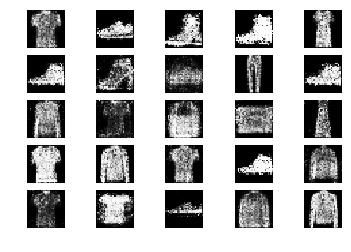

12601 [D loss: 0.680558, acc.: 62.50%] [G loss: 0.775597]
12602 [D loss: 0.649010, acc.: 65.62%] [G loss: 0.825681]
12603 [D loss: 0.612069, acc.: 65.62%] [G loss: 0.944034]
12604 [D loss: 0.623607, acc.: 65.62%] [G loss: 0.933989]
12605 [D loss: 0.633387, acc.: 68.75%] [G loss: 0.907976]
12606 [D loss: 0.692086, acc.: 59.38%] [G loss: 0.844001]
12607 [D loss: 0.670333, acc.: 60.94%] [G loss: 0.924992]
12608 [D loss: 0.658229, acc.: 60.94%] [G loss: 0.930003]
12609 [D loss: 0.631663, acc.: 68.75%] [G loss: 0.902236]
12610 [D loss: 0.633540, acc.: 67.19%] [G loss: 0.820820]
12611 [D loss: 0.627900, acc.: 60.94%] [G loss: 0.871651]
12612 [D loss: 0.707578, acc.: 51.56%] [G loss: 0.910060]
12613 [D loss: 0.638740, acc.: 60.94%] [G loss: 0.914988]
12614 [D loss: 0.627661, acc.: 60.94%] [G loss: 0.834072]
12615 [D loss: 0.751477, acc.: 43.75%] [G loss: 0.814536]
12616 [D loss: 0.648441, acc.: 65.62%] [G loss: 0.869133]
12617 [D loss: 0.673591, acc.: 57.81%] [G loss: 0.881570]
12618 [D loss:

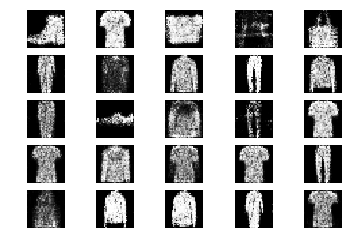

12801 [D loss: 0.650129, acc.: 56.25%] [G loss: 0.855552]
12802 [D loss: 0.696725, acc.: 60.94%] [G loss: 0.848306]
12803 [D loss: 0.577822, acc.: 67.19%] [G loss: 0.946360]
12804 [D loss: 0.668657, acc.: 59.38%] [G loss: 0.937501]
12805 [D loss: 0.651031, acc.: 65.62%] [G loss: 0.898228]
12806 [D loss: 0.650699, acc.: 62.50%] [G loss: 0.879055]
12807 [D loss: 0.597567, acc.: 70.31%] [G loss: 0.960350]
12808 [D loss: 0.625302, acc.: 68.75%] [G loss: 0.965006]
12809 [D loss: 0.713716, acc.: 46.88%] [G loss: 0.914461]
12810 [D loss: 0.630850, acc.: 64.06%] [G loss: 0.851997]
12811 [D loss: 0.623417, acc.: 60.94%] [G loss: 0.842858]
12812 [D loss: 0.649823, acc.: 57.81%] [G loss: 0.829292]
12813 [D loss: 0.658928, acc.: 56.25%] [G loss: 0.906609]
12814 [D loss: 0.650953, acc.: 60.94%] [G loss: 0.952363]
12815 [D loss: 0.672445, acc.: 56.25%] [G loss: 0.881165]
12816 [D loss: 0.638382, acc.: 62.50%] [G loss: 0.917016]
12817 [D loss: 0.599831, acc.: 78.12%] [G loss: 0.925732]
12818 [D loss:

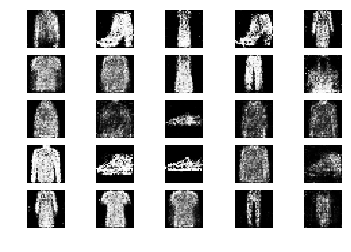

13001 [D loss: 0.634952, acc.: 68.75%] [G loss: 0.854015]
13002 [D loss: 0.691236, acc.: 53.12%] [G loss: 0.856572]
13003 [D loss: 0.671651, acc.: 65.62%] [G loss: 0.911675]
13004 [D loss: 0.733832, acc.: 48.44%] [G loss: 0.903998]
13005 [D loss: 0.642563, acc.: 67.19%] [G loss: 0.887959]
13006 [D loss: 0.657345, acc.: 60.94%] [G loss: 0.944321]
13007 [D loss: 0.629512, acc.: 68.75%] [G loss: 0.886838]
13008 [D loss: 0.714408, acc.: 54.69%] [G loss: 0.892101]
13009 [D loss: 0.616075, acc.: 70.31%] [G loss: 0.887791]
13010 [D loss: 0.637911, acc.: 70.31%] [G loss: 0.908893]
13011 [D loss: 0.687068, acc.: 51.56%] [G loss: 0.868052]
13012 [D loss: 0.681850, acc.: 56.25%] [G loss: 0.814668]
13013 [D loss: 0.680727, acc.: 57.81%] [G loss: 0.903083]
13014 [D loss: 0.675035, acc.: 59.38%] [G loss: 0.827549]
13015 [D loss: 0.628277, acc.: 60.94%] [G loss: 0.875153]
13016 [D loss: 0.681810, acc.: 57.81%] [G loss: 0.881392]
13017 [D loss: 0.689390, acc.: 57.81%] [G loss: 0.807907]
13018 [D loss:

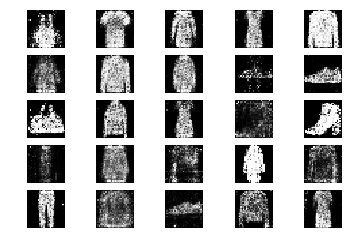

13201 [D loss: 0.652525, acc.: 59.38%] [G loss: 0.797266]
13202 [D loss: 0.701494, acc.: 45.31%] [G loss: 0.851945]
13203 [D loss: 0.656919, acc.: 53.12%] [G loss: 0.874669]
13204 [D loss: 0.735032, acc.: 51.56%] [G loss: 0.878940]
13205 [D loss: 0.661555, acc.: 57.81%] [G loss: 0.888933]
13206 [D loss: 0.666915, acc.: 60.94%] [G loss: 0.895958]
13207 [D loss: 0.677143, acc.: 57.81%] [G loss: 0.855669]
13208 [D loss: 0.663957, acc.: 54.69%] [G loss: 0.869958]
13209 [D loss: 0.665312, acc.: 56.25%] [G loss: 0.948388]
13210 [D loss: 0.669414, acc.: 59.38%] [G loss: 0.978376]
13211 [D loss: 0.694885, acc.: 60.94%] [G loss: 1.000491]
13212 [D loss: 0.679415, acc.: 53.12%] [G loss: 0.899799]
13213 [D loss: 0.667514, acc.: 59.38%] [G loss: 0.837195]
13214 [D loss: 0.629677, acc.: 65.62%] [G loss: 0.812566]
13215 [D loss: 0.628923, acc.: 68.75%] [G loss: 0.879389]
13216 [D loss: 0.637518, acc.: 68.75%] [G loss: 0.805641]
13217 [D loss: 0.705484, acc.: 53.12%] [G loss: 0.862387]
13218 [D loss:

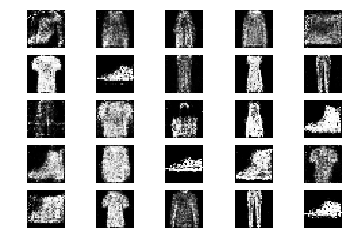

13401 [D loss: 0.640129, acc.: 60.94%] [G loss: 0.871642]
13402 [D loss: 0.697221, acc.: 57.81%] [G loss: 0.865880]
13403 [D loss: 0.634495, acc.: 60.94%] [G loss: 0.819987]
13404 [D loss: 0.650459, acc.: 70.31%] [G loss: 0.827492]
13405 [D loss: 0.662815, acc.: 59.38%] [G loss: 0.943016]
13406 [D loss: 0.599572, acc.: 70.31%] [G loss: 0.900185]
13407 [D loss: 0.663584, acc.: 60.94%] [G loss: 0.939528]
13408 [D loss: 0.676250, acc.: 64.06%] [G loss: 0.950641]
13409 [D loss: 0.664130, acc.: 59.38%] [G loss: 0.865377]
13410 [D loss: 0.651401, acc.: 60.94%] [G loss: 0.984927]
13411 [D loss: 0.688409, acc.: 62.50%] [G loss: 0.879712]
13412 [D loss: 0.622122, acc.: 71.88%] [G loss: 0.925130]
13413 [D loss: 0.602592, acc.: 67.19%] [G loss: 0.896714]
13414 [D loss: 0.590923, acc.: 70.31%] [G loss: 0.965620]
13415 [D loss: 0.650788, acc.: 64.06%] [G loss: 0.913583]
13416 [D loss: 0.670404, acc.: 60.94%] [G loss: 0.941574]
13417 [D loss: 0.652592, acc.: 60.94%] [G loss: 0.929782]
13418 [D loss:

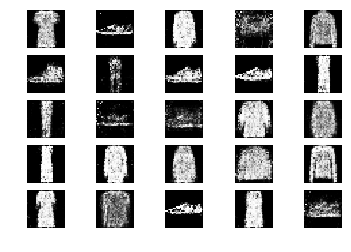

13601 [D loss: 0.642507, acc.: 64.06%] [G loss: 0.899486]
13602 [D loss: 0.652055, acc.: 59.38%] [G loss: 0.848929]
13603 [D loss: 0.607344, acc.: 71.88%] [G loss: 0.761381]
13604 [D loss: 0.692311, acc.: 51.56%] [G loss: 0.849626]
13605 [D loss: 0.589090, acc.: 70.31%] [G loss: 0.878476]
13606 [D loss: 0.629130, acc.: 60.94%] [G loss: 0.969248]
13607 [D loss: 0.673597, acc.: 62.50%] [G loss: 0.998476]
13608 [D loss: 0.692369, acc.: 53.12%] [G loss: 0.913477]
13609 [D loss: 0.693751, acc.: 57.81%] [G loss: 0.861810]
13610 [D loss: 0.681619, acc.: 59.38%] [G loss: 0.942947]
13611 [D loss: 0.629119, acc.: 65.62%] [G loss: 0.894669]
13612 [D loss: 0.630371, acc.: 64.06%] [G loss: 0.901807]
13613 [D loss: 0.670906, acc.: 54.69%] [G loss: 0.920794]
13614 [D loss: 0.646693, acc.: 68.75%] [G loss: 0.794076]
13615 [D loss: 0.675070, acc.: 56.25%] [G loss: 0.931010]
13616 [D loss: 0.672652, acc.: 53.12%] [G loss: 0.914099]
13617 [D loss: 0.690171, acc.: 56.25%] [G loss: 0.954486]
13618 [D loss:

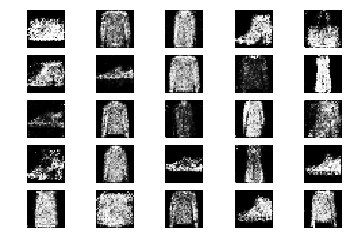

13801 [D loss: 0.686782, acc.: 59.38%] [G loss: 0.889994]
13802 [D loss: 0.684164, acc.: 53.12%] [G loss: 0.902790]
13803 [D loss: 0.682767, acc.: 65.62%] [G loss: 0.852842]
13804 [D loss: 0.667642, acc.: 64.06%] [G loss: 0.933071]
13805 [D loss: 0.718301, acc.: 51.56%] [G loss: 0.879058]
13806 [D loss: 0.649468, acc.: 65.62%] [G loss: 0.898265]
13807 [D loss: 0.633360, acc.: 62.50%] [G loss: 0.799838]
13808 [D loss: 0.612626, acc.: 68.75%] [G loss: 0.873632]
13809 [D loss: 0.616316, acc.: 68.75%] [G loss: 0.839338]
13810 [D loss: 0.675130, acc.: 64.06%] [G loss: 0.825269]
13811 [D loss: 0.700665, acc.: 53.12%] [G loss: 0.922316]
13812 [D loss: 0.649249, acc.: 54.69%] [G loss: 0.836252]
13813 [D loss: 0.591978, acc.: 76.56%] [G loss: 0.944269]
13814 [D loss: 0.585637, acc.: 68.75%] [G loss: 0.916058]
13815 [D loss: 0.646116, acc.: 62.50%] [G loss: 0.926952]
13816 [D loss: 0.639144, acc.: 68.75%] [G loss: 0.922973]
13817 [D loss: 0.598397, acc.: 70.31%] [G loss: 0.882898]
13818 [D loss:

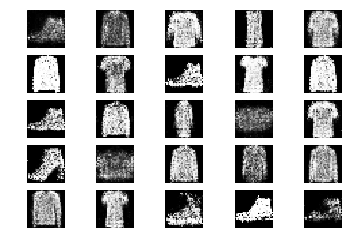

14001 [D loss: 0.688403, acc.: 50.00%] [G loss: 0.893698]
14002 [D loss: 0.616592, acc.: 73.44%] [G loss: 0.865486]
14003 [D loss: 0.696465, acc.: 54.69%] [G loss: 0.904166]
14004 [D loss: 0.630446, acc.: 67.19%] [G loss: 0.903848]
14005 [D loss: 0.657407, acc.: 57.81%] [G loss: 0.950278]
14006 [D loss: 0.643314, acc.: 64.06%] [G loss: 0.916122]
14007 [D loss: 0.708105, acc.: 54.69%] [G loss: 0.937794]
14008 [D loss: 0.708141, acc.: 48.44%] [G loss: 0.875845]
14009 [D loss: 0.593886, acc.: 68.75%] [G loss: 0.975079]
14010 [D loss: 0.645689, acc.: 56.25%] [G loss: 0.849523]
14011 [D loss: 0.643110, acc.: 68.75%] [G loss: 0.864348]
14012 [D loss: 0.671238, acc.: 60.94%] [G loss: 0.799104]
14013 [D loss: 0.639744, acc.: 57.81%] [G loss: 0.844875]
14014 [D loss: 0.648950, acc.: 68.75%] [G loss: 0.850934]
14015 [D loss: 0.674240, acc.: 54.69%] [G loss: 0.866197]
14016 [D loss: 0.670316, acc.: 60.94%] [G loss: 0.872858]
14017 [D loss: 0.667396, acc.: 54.69%] [G loss: 0.844420]
14018 [D loss:

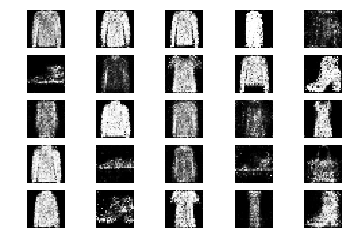

14201 [D loss: 0.698138, acc.: 50.00%] [G loss: 0.855502]
14202 [D loss: 0.638406, acc.: 62.50%] [G loss: 0.933295]
14203 [D loss: 0.661191, acc.: 56.25%] [G loss: 0.928050]
14204 [D loss: 0.670239, acc.: 60.94%] [G loss: 0.877709]
14205 [D loss: 0.655311, acc.: 57.81%] [G loss: 0.874007]
14206 [D loss: 0.693392, acc.: 57.81%] [G loss: 0.909100]
14207 [D loss: 0.653279, acc.: 53.12%] [G loss: 0.849919]
14208 [D loss: 0.660433, acc.: 57.81%] [G loss: 0.929625]
14209 [D loss: 0.616170, acc.: 70.31%] [G loss: 0.858678]
14210 [D loss: 0.615081, acc.: 65.62%] [G loss: 0.917544]
14211 [D loss: 0.599623, acc.: 60.94%] [G loss: 0.963651]
14212 [D loss: 0.672256, acc.: 57.81%] [G loss: 0.910175]
14213 [D loss: 0.656660, acc.: 59.38%] [G loss: 0.885773]
14214 [D loss: 0.689074, acc.: 54.69%] [G loss: 0.854936]
14215 [D loss: 0.656781, acc.: 65.62%] [G loss: 0.866216]
14216 [D loss: 0.609181, acc.: 65.62%] [G loss: 0.881553]
14217 [D loss: 0.704448, acc.: 59.38%] [G loss: 0.885038]
14218 [D loss:

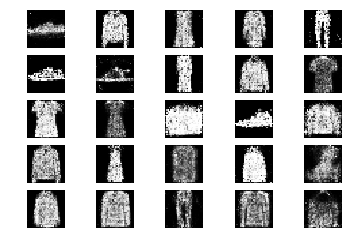

14401 [D loss: 0.636609, acc.: 57.81%] [G loss: 0.851787]
14402 [D loss: 0.664448, acc.: 62.50%] [G loss: 0.905381]
14403 [D loss: 0.659747, acc.: 57.81%] [G loss: 0.877918]
14404 [D loss: 0.651971, acc.: 57.81%] [G loss: 0.860343]
14405 [D loss: 0.662925, acc.: 59.38%] [G loss: 0.879194]
14406 [D loss: 0.665861, acc.: 54.69%] [G loss: 0.906138]
14407 [D loss: 0.604692, acc.: 70.31%] [G loss: 0.831225]
14408 [D loss: 0.658038, acc.: 68.75%] [G loss: 0.911155]
14409 [D loss: 0.655184, acc.: 57.81%] [G loss: 0.883862]
14410 [D loss: 0.681053, acc.: 51.56%] [G loss: 0.986800]
14411 [D loss: 0.638514, acc.: 62.50%] [G loss: 0.918505]
14412 [D loss: 0.699028, acc.: 53.12%] [G loss: 0.920381]
14413 [D loss: 0.661322, acc.: 64.06%] [G loss: 0.942607]
14414 [D loss: 0.644891, acc.: 64.06%] [G loss: 0.964774]
14415 [D loss: 0.639914, acc.: 70.31%] [G loss: 0.847450]
14416 [D loss: 0.649753, acc.: 60.94%] [G loss: 0.869761]
14417 [D loss: 0.642208, acc.: 59.38%] [G loss: 0.893484]
14418 [D loss:

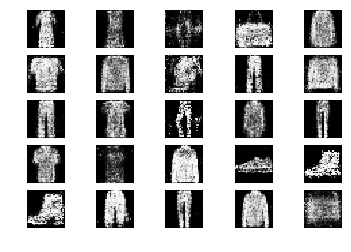

14601 [D loss: 0.704170, acc.: 50.00%] [G loss: 0.958012]
14602 [D loss: 0.652585, acc.: 60.94%] [G loss: 0.860749]
14603 [D loss: 0.649858, acc.: 62.50%] [G loss: 0.839909]
14604 [D loss: 0.635107, acc.: 67.19%] [G loss: 0.870270]
14605 [D loss: 0.653583, acc.: 57.81%] [G loss: 0.918093]
14606 [D loss: 0.665365, acc.: 60.94%] [G loss: 0.938849]
14607 [D loss: 0.699931, acc.: 57.81%] [G loss: 0.865487]
14608 [D loss: 0.652002, acc.: 60.94%] [G loss: 0.968404]
14609 [D loss: 0.603262, acc.: 70.31%] [G loss: 0.911409]
14610 [D loss: 0.625564, acc.: 64.06%] [G loss: 0.902398]
14611 [D loss: 0.657388, acc.: 60.94%] [G loss: 0.874213]
14612 [D loss: 0.710199, acc.: 48.44%] [G loss: 0.888760]
14613 [D loss: 0.620514, acc.: 70.31%] [G loss: 0.868665]
14614 [D loss: 0.675436, acc.: 64.06%] [G loss: 0.890391]
14615 [D loss: 0.639925, acc.: 60.94%] [G loss: 0.932211]
14616 [D loss: 0.683881, acc.: 54.69%] [G loss: 0.936879]
14617 [D loss: 0.640062, acc.: 62.50%] [G loss: 0.837323]
14618 [D loss:

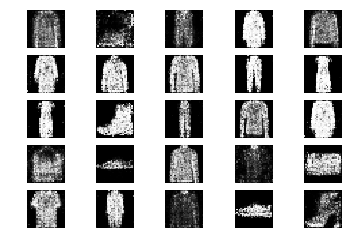

14801 [D loss: 0.600824, acc.: 73.44%] [G loss: 0.944719]
14802 [D loss: 0.585748, acc.: 70.31%] [G loss: 0.879044]
14803 [D loss: 0.692181, acc.: 56.25%] [G loss: 0.947505]
14804 [D loss: 0.618877, acc.: 65.62%] [G loss: 0.995698]
14805 [D loss: 0.559427, acc.: 76.56%] [G loss: 0.996457]
14806 [D loss: 0.650140, acc.: 64.06%] [G loss: 0.941376]
14807 [D loss: 0.644867, acc.: 67.19%] [G loss: 0.882312]
14808 [D loss: 0.654449, acc.: 60.94%] [G loss: 0.842155]
14809 [D loss: 0.659280, acc.: 60.94%] [G loss: 0.915703]
14810 [D loss: 0.587339, acc.: 75.00%] [G loss: 0.837897]
14811 [D loss: 0.683694, acc.: 50.00%] [G loss: 0.906078]
14812 [D loss: 0.640538, acc.: 60.94%] [G loss: 0.890596]
14813 [D loss: 0.685275, acc.: 64.06%] [G loss: 0.909489]
14814 [D loss: 0.668323, acc.: 57.81%] [G loss: 0.951410]
14815 [D loss: 0.601666, acc.: 65.62%] [G loss: 0.915929]
14816 [D loss: 0.597362, acc.: 65.62%] [G loss: 0.965364]
14817 [D loss: 0.642439, acc.: 67.19%] [G loss: 0.962400]
14818 [D loss:

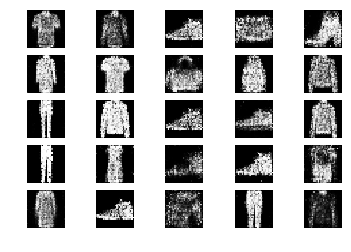

15001 [D loss: 0.652130, acc.: 65.62%] [G loss: 0.909689]
15002 [D loss: 0.606779, acc.: 68.75%] [G loss: 0.767797]
15003 [D loss: 0.676997, acc.: 59.38%] [G loss: 0.868471]
15004 [D loss: 0.700236, acc.: 54.69%] [G loss: 0.852345]
15005 [D loss: 0.729345, acc.: 56.25%] [G loss: 0.892438]
15006 [D loss: 0.629074, acc.: 67.19%] [G loss: 0.894577]
15007 [D loss: 0.692187, acc.: 53.12%] [G loss: 0.882377]
15008 [D loss: 0.662761, acc.: 59.38%] [G loss: 0.961284]
15009 [D loss: 0.638715, acc.: 57.81%] [G loss: 0.969599]
15010 [D loss: 0.643256, acc.: 59.38%] [G loss: 0.956129]
15011 [D loss: 0.696832, acc.: 59.38%] [G loss: 0.904635]
15012 [D loss: 0.664990, acc.: 62.50%] [G loss: 0.832836]
15013 [D loss: 0.645975, acc.: 67.19%] [G loss: 0.841044]
15014 [D loss: 0.657714, acc.: 56.25%] [G loss: 0.851778]
15015 [D loss: 0.633783, acc.: 65.62%] [G loss: 0.874443]
15016 [D loss: 0.665875, acc.: 56.25%] [G loss: 0.928254]
15017 [D loss: 0.611275, acc.: 70.31%] [G loss: 0.892863]
15018 [D loss:

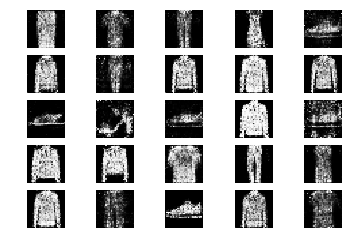

15201 [D loss: 0.615128, acc.: 65.62%] [G loss: 0.964399]
15202 [D loss: 0.659714, acc.: 56.25%] [G loss: 0.976727]
15203 [D loss: 0.637007, acc.: 67.19%] [G loss: 0.923555]
15204 [D loss: 0.665337, acc.: 53.12%] [G loss: 0.845424]
15205 [D loss: 0.664848, acc.: 59.38%] [G loss: 0.935804]
15206 [D loss: 0.605694, acc.: 65.62%] [G loss: 0.916679]
15207 [D loss: 0.690167, acc.: 48.44%] [G loss: 0.871822]
15208 [D loss: 0.701222, acc.: 56.25%] [G loss: 0.887154]
15209 [D loss: 0.654824, acc.: 57.81%] [G loss: 0.857179]
15210 [D loss: 0.665118, acc.: 53.12%] [G loss: 0.809955]
15211 [D loss: 0.562733, acc.: 79.69%] [G loss: 0.932993]
15212 [D loss: 0.673171, acc.: 60.94%] [G loss: 0.837229]
15213 [D loss: 0.609665, acc.: 67.19%] [G loss: 0.876993]
15214 [D loss: 0.671590, acc.: 62.50%] [G loss: 0.867399]
15215 [D loss: 0.567161, acc.: 71.88%] [G loss: 0.974453]
15216 [D loss: 0.710933, acc.: 48.44%] [G loss: 0.913847]
15217 [D loss: 0.675896, acc.: 56.25%] [G loss: 0.860482]
15218 [D loss:

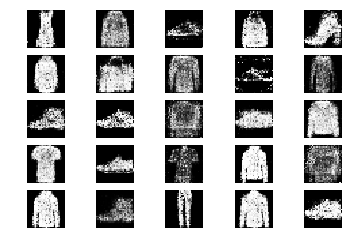

15401 [D loss: 0.631864, acc.: 65.62%] [G loss: 0.876354]
15402 [D loss: 0.668835, acc.: 56.25%] [G loss: 0.923416]
15403 [D loss: 0.570884, acc.: 67.19%] [G loss: 0.984033]
15404 [D loss: 0.691654, acc.: 51.56%] [G loss: 0.899412]
15405 [D loss: 0.606722, acc.: 64.06%] [G loss: 0.911111]
15406 [D loss: 0.643232, acc.: 64.06%] [G loss: 0.936479]
15407 [D loss: 0.627618, acc.: 64.06%] [G loss: 0.887740]
15408 [D loss: 0.722279, acc.: 57.81%] [G loss: 0.870864]
15409 [D loss: 0.625056, acc.: 64.06%] [G loss: 0.748509]
15410 [D loss: 0.713830, acc.: 54.69%] [G loss: 0.851157]
15411 [D loss: 0.643357, acc.: 68.75%] [G loss: 0.856387]
15412 [D loss: 0.682833, acc.: 56.25%] [G loss: 0.873705]
15413 [D loss: 0.641637, acc.: 65.62%] [G loss: 0.913672]
15414 [D loss: 0.679102, acc.: 62.50%] [G loss: 0.914795]
15415 [D loss: 0.616146, acc.: 68.75%] [G loss: 0.863108]
15416 [D loss: 0.619377, acc.: 64.06%] [G loss: 0.934652]
15417 [D loss: 0.677386, acc.: 54.69%] [G loss: 0.877799]
15418 [D loss:

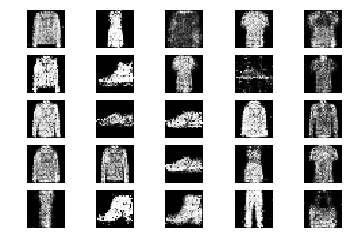

15601 [D loss: 0.668418, acc.: 62.50%] [G loss: 0.766532]
15602 [D loss: 0.664351, acc.: 57.81%] [G loss: 0.811111]
15603 [D loss: 0.700403, acc.: 59.38%] [G loss: 0.864013]
15604 [D loss: 0.611349, acc.: 60.94%] [G loss: 0.849301]
15605 [D loss: 0.700727, acc.: 48.44%] [G loss: 0.863623]
15606 [D loss: 0.604294, acc.: 71.88%] [G loss: 0.848604]
15607 [D loss: 0.698528, acc.: 54.69%] [G loss: 0.901082]
15608 [D loss: 0.627794, acc.: 65.62%] [G loss: 0.870120]
15609 [D loss: 0.688433, acc.: 59.38%] [G loss: 0.900103]
15610 [D loss: 0.727018, acc.: 51.56%] [G loss: 0.856451]
15611 [D loss: 0.707671, acc.: 53.12%] [G loss: 0.907533]
15612 [D loss: 0.629628, acc.: 65.62%] [G loss: 0.959236]
15613 [D loss: 0.622026, acc.: 70.31%] [G loss: 0.967767]
15614 [D loss: 0.640832, acc.: 67.19%] [G loss: 0.894972]
15615 [D loss: 0.653824, acc.: 60.94%] [G loss: 0.903961]
15616 [D loss: 0.638615, acc.: 65.62%] [G loss: 0.957798]
15617 [D loss: 0.665635, acc.: 60.94%] [G loss: 0.980564]
15618 [D loss:

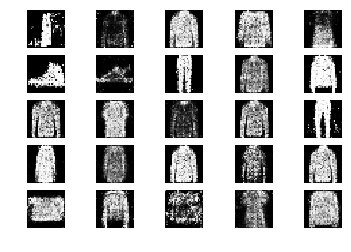

15801 [D loss: 0.632414, acc.: 62.50%] [G loss: 0.889873]
15802 [D loss: 0.617895, acc.: 67.19%] [G loss: 0.940210]
15803 [D loss: 0.633562, acc.: 70.31%] [G loss: 0.994463]
15804 [D loss: 0.694543, acc.: 57.81%] [G loss: 0.935159]
15805 [D loss: 0.670608, acc.: 56.25%] [G loss: 0.914628]
15806 [D loss: 0.678439, acc.: 53.12%] [G loss: 0.903193]
15807 [D loss: 0.582442, acc.: 70.31%] [G loss: 0.967345]
15808 [D loss: 0.724669, acc.: 51.56%] [G loss: 0.861888]
15809 [D loss: 0.671138, acc.: 54.69%] [G loss: 0.864066]
15810 [D loss: 0.585969, acc.: 67.19%] [G loss: 0.960966]
15811 [D loss: 0.635294, acc.: 62.50%] [G loss: 0.868970]
15812 [D loss: 0.704794, acc.: 57.81%] [G loss: 0.915323]
15813 [D loss: 0.649582, acc.: 59.38%] [G loss: 0.987333]
15814 [D loss: 0.632730, acc.: 59.38%] [G loss: 0.911381]
15815 [D loss: 0.696515, acc.: 50.00%] [G loss: 0.885645]
15816 [D loss: 0.694499, acc.: 54.69%] [G loss: 0.959935]
15817 [D loss: 0.588939, acc.: 70.31%] [G loss: 0.965015]
15818 [D loss:

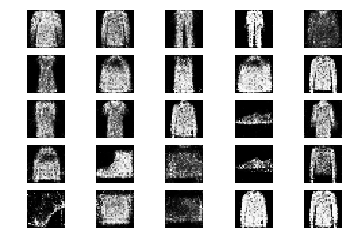

16001 [D loss: 0.708376, acc.: 59.38%] [G loss: 0.877228]
16002 [D loss: 0.724477, acc.: 53.12%] [G loss: 0.869884]
16003 [D loss: 0.632043, acc.: 65.62%] [G loss: 0.880290]
16004 [D loss: 0.663601, acc.: 68.75%] [G loss: 0.912855]
16005 [D loss: 0.716541, acc.: 56.25%] [G loss: 0.848584]
16006 [D loss: 0.659036, acc.: 60.94%] [G loss: 0.861889]
16007 [D loss: 0.677614, acc.: 54.69%] [G loss: 0.860276]
16008 [D loss: 0.660537, acc.: 56.25%] [G loss: 0.774875]
16009 [D loss: 0.601270, acc.: 65.62%] [G loss: 0.844734]
16010 [D loss: 0.633936, acc.: 62.50%] [G loss: 0.898359]
16011 [D loss: 0.589807, acc.: 70.31%] [G loss: 0.936802]
16012 [D loss: 0.627376, acc.: 57.81%] [G loss: 0.998575]
16013 [D loss: 0.656360, acc.: 60.94%] [G loss: 0.895908]
16014 [D loss: 0.610388, acc.: 64.06%] [G loss: 0.984386]
16015 [D loss: 0.634530, acc.: 67.19%] [G loss: 0.847441]
16016 [D loss: 0.633112, acc.: 65.62%] [G loss: 0.917334]
16017 [D loss: 0.662640, acc.: 60.94%] [G loss: 0.901405]
16018 [D loss:

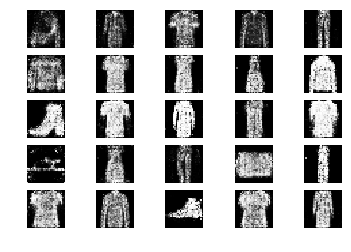

16201 [D loss: 0.695237, acc.: 51.56%] [G loss: 0.985083]
16202 [D loss: 0.630476, acc.: 56.25%] [G loss: 0.912216]
16203 [D loss: 0.723028, acc.: 51.56%] [G loss: 0.880621]
16204 [D loss: 0.660018, acc.: 56.25%] [G loss: 0.883301]
16205 [D loss: 0.686006, acc.: 53.12%] [G loss: 0.869645]
16206 [D loss: 0.663153, acc.: 57.81%] [G loss: 0.975030]
16207 [D loss: 0.618584, acc.: 70.31%] [G loss: 0.932816]
16208 [D loss: 0.694188, acc.: 57.81%] [G loss: 0.880033]
16209 [D loss: 0.621560, acc.: 65.62%] [G loss: 0.931005]
16210 [D loss: 0.695821, acc.: 53.12%] [G loss: 0.891375]
16211 [D loss: 0.670334, acc.: 62.50%] [G loss: 0.887132]
16212 [D loss: 0.700103, acc.: 46.88%] [G loss: 0.847224]
16213 [D loss: 0.646049, acc.: 57.81%] [G loss: 0.932114]
16214 [D loss: 0.684288, acc.: 56.25%] [G loss: 0.912467]
16215 [D loss: 0.657048, acc.: 62.50%] [G loss: 0.977202]
16216 [D loss: 0.667890, acc.: 60.94%] [G loss: 0.939443]
16217 [D loss: 0.612743, acc.: 65.62%] [G loss: 0.950741]
16218 [D loss:

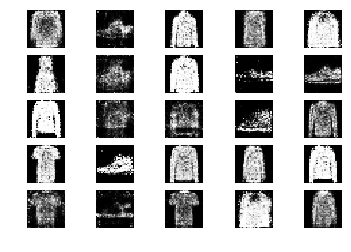

16401 [D loss: 0.643617, acc.: 67.19%] [G loss: 0.858409]
16402 [D loss: 0.702483, acc.: 59.38%] [G loss: 0.823367]
16403 [D loss: 0.613939, acc.: 62.50%] [G loss: 0.985885]
16404 [D loss: 0.727229, acc.: 57.81%] [G loss: 0.847540]
16405 [D loss: 0.648295, acc.: 60.94%] [G loss: 0.922802]
16406 [D loss: 0.663821, acc.: 59.38%] [G loss: 0.863059]
16407 [D loss: 0.624296, acc.: 64.06%] [G loss: 1.030275]
16408 [D loss: 0.636591, acc.: 64.06%] [G loss: 0.937041]
16409 [D loss: 0.666067, acc.: 65.62%] [G loss: 0.866170]
16410 [D loss: 0.635481, acc.: 67.19%] [G loss: 0.877361]
16411 [D loss: 0.679024, acc.: 60.94%] [G loss: 0.964765]
16412 [D loss: 0.574547, acc.: 65.62%] [G loss: 0.982466]
16413 [D loss: 0.681580, acc.: 56.25%] [G loss: 0.970929]
16414 [D loss: 0.589160, acc.: 67.19%] [G loss: 0.890986]
16415 [D loss: 0.597331, acc.: 65.62%] [G loss: 0.927691]
16416 [D loss: 0.594678, acc.: 76.56%] [G loss: 0.911304]
16417 [D loss: 0.644940, acc.: 59.38%] [G loss: 1.028522]
16418 [D loss:

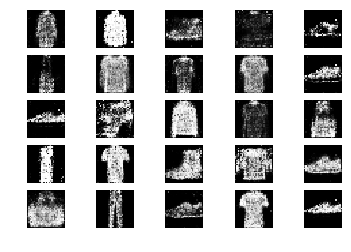

16601 [D loss: 0.614894, acc.: 67.19%] [G loss: 1.010680]
16602 [D loss: 0.634938, acc.: 65.62%] [G loss: 1.004478]
16603 [D loss: 0.664178, acc.: 64.06%] [G loss: 0.993114]
16604 [D loss: 0.636132, acc.: 67.19%] [G loss: 0.883047]
16605 [D loss: 0.644889, acc.: 68.75%] [G loss: 0.991987]
16606 [D loss: 0.625036, acc.: 60.94%] [G loss: 0.922285]
16607 [D loss: 0.647892, acc.: 65.62%] [G loss: 0.960471]
16608 [D loss: 0.614974, acc.: 68.75%] [G loss: 0.907465]
16609 [D loss: 0.708878, acc.: 54.69%] [G loss: 0.947917]
16610 [D loss: 0.642218, acc.: 62.50%] [G loss: 0.848981]
16611 [D loss: 0.598758, acc.: 67.19%] [G loss: 0.872119]
16612 [D loss: 0.637945, acc.: 65.62%] [G loss: 0.904338]
16613 [D loss: 0.696251, acc.: 51.56%] [G loss: 0.925024]
16614 [D loss: 0.698536, acc.: 54.69%] [G loss: 0.910618]
16615 [D loss: 0.656141, acc.: 60.94%] [G loss: 0.915969]
16616 [D loss: 0.672464, acc.: 59.38%] [G loss: 0.904685]
16617 [D loss: 0.669725, acc.: 64.06%] [G loss: 0.909366]
16618 [D loss:

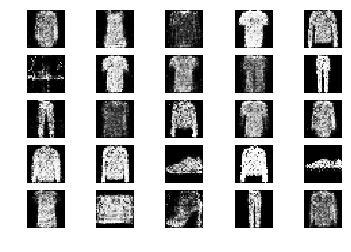

16801 [D loss: 0.596970, acc.: 68.75%] [G loss: 0.851992]
16802 [D loss: 0.655774, acc.: 56.25%] [G loss: 0.838648]
16803 [D loss: 0.598777, acc.: 73.44%] [G loss: 0.851550]
16804 [D loss: 0.650730, acc.: 62.50%] [G loss: 0.863051]
16805 [D loss: 0.692787, acc.: 45.31%] [G loss: 0.848416]
16806 [D loss: 0.652493, acc.: 53.12%] [G loss: 0.872907]
16807 [D loss: 0.713659, acc.: 59.38%] [G loss: 0.908855]
16808 [D loss: 0.598721, acc.: 67.19%] [G loss: 0.886848]
16809 [D loss: 0.605176, acc.: 67.19%] [G loss: 0.891770]
16810 [D loss: 0.736060, acc.: 54.69%] [G loss: 0.920860]
16811 [D loss: 0.611683, acc.: 70.31%] [G loss: 0.911094]
16812 [D loss: 0.627804, acc.: 60.94%] [G loss: 0.953689]
16813 [D loss: 0.673576, acc.: 62.50%] [G loss: 0.932545]
16814 [D loss: 0.636136, acc.: 62.50%] [G loss: 0.965900]
16815 [D loss: 0.627738, acc.: 59.38%] [G loss: 0.933135]
16816 [D loss: 0.635971, acc.: 62.50%] [G loss: 0.948742]
16817 [D loss: 0.648123, acc.: 57.81%] [G loss: 0.946507]
16818 [D loss:

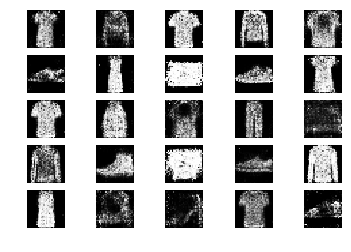

17001 [D loss: 0.660484, acc.: 60.94%] [G loss: 0.903202]
17002 [D loss: 0.670683, acc.: 60.94%] [G loss: 0.846528]
17003 [D loss: 0.656005, acc.: 62.50%] [G loss: 0.934083]
17004 [D loss: 0.686468, acc.: 54.69%] [G loss: 0.859846]
17005 [D loss: 0.603494, acc.: 68.75%] [G loss: 0.871078]
17006 [D loss: 0.604724, acc.: 70.31%] [G loss: 0.806125]
17007 [D loss: 0.693852, acc.: 53.12%] [G loss: 0.853131]
17008 [D loss: 0.667889, acc.: 56.25%] [G loss: 0.921653]
17009 [D loss: 0.677179, acc.: 56.25%] [G loss: 0.949538]
17010 [D loss: 0.606118, acc.: 73.44%] [G loss: 0.980660]
17011 [D loss: 0.664942, acc.: 57.81%] [G loss: 0.846668]
17012 [D loss: 0.584286, acc.: 68.75%] [G loss: 0.932001]
17013 [D loss: 0.658859, acc.: 57.81%] [G loss: 0.978001]
17014 [D loss: 0.731470, acc.: 51.56%] [G loss: 0.983185]
17015 [D loss: 0.708696, acc.: 53.12%] [G loss: 0.948228]
17016 [D loss: 0.637412, acc.: 73.44%] [G loss: 0.932587]
17017 [D loss: 0.606103, acc.: 71.88%] [G loss: 0.850535]
17018 [D loss:

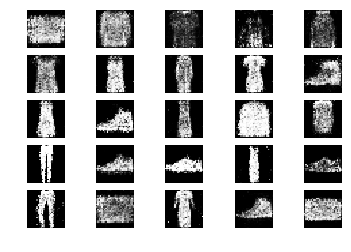

17201 [D loss: 0.664894, acc.: 60.94%] [G loss: 0.913194]
17202 [D loss: 0.643271, acc.: 62.50%] [G loss: 0.953228]
17203 [D loss: 0.717140, acc.: 56.25%] [G loss: 0.854288]
17204 [D loss: 0.644348, acc.: 59.38%] [G loss: 0.883085]
17205 [D loss: 0.616707, acc.: 73.44%] [G loss: 0.847873]
17206 [D loss: 0.720692, acc.: 50.00%] [G loss: 0.859743]
17207 [D loss: 0.643043, acc.: 57.81%] [G loss: 0.836980]
17208 [D loss: 0.638129, acc.: 64.06%] [G loss: 0.840376]
17209 [D loss: 0.671450, acc.: 59.38%] [G loss: 0.888558]
17210 [D loss: 0.762666, acc.: 51.56%] [G loss: 0.849974]
17211 [D loss: 0.600566, acc.: 62.50%] [G loss: 0.928295]
17212 [D loss: 0.754332, acc.: 46.88%] [G loss: 0.828649]
17213 [D loss: 0.605361, acc.: 62.50%] [G loss: 0.893140]
17214 [D loss: 0.694589, acc.: 53.12%] [G loss: 0.888465]
17215 [D loss: 0.696518, acc.: 54.69%] [G loss: 0.853106]
17216 [D loss: 0.629020, acc.: 67.19%] [G loss: 0.853855]
17217 [D loss: 0.692860, acc.: 53.12%] [G loss: 0.839813]
17218 [D loss:

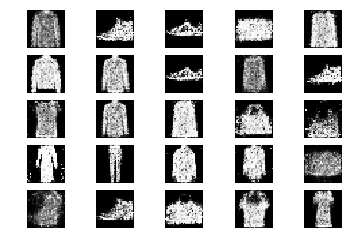

17401 [D loss: 0.665513, acc.: 57.81%] [G loss: 0.946559]
17402 [D loss: 0.675097, acc.: 59.38%] [G loss: 0.915335]
17403 [D loss: 0.646713, acc.: 53.12%] [G loss: 0.895554]
17404 [D loss: 0.694258, acc.: 56.25%] [G loss: 0.877964]
17405 [D loss: 0.633279, acc.: 62.50%] [G loss: 0.898878]
17406 [D loss: 0.632961, acc.: 62.50%] [G loss: 0.787789]
17407 [D loss: 0.649424, acc.: 62.50%] [G loss: 0.855578]
17408 [D loss: 0.657683, acc.: 62.50%] [G loss: 0.846613]
17409 [D loss: 0.661898, acc.: 64.06%] [G loss: 0.912971]
17410 [D loss: 0.664180, acc.: 57.81%] [G loss: 0.936366]
17411 [D loss: 0.666831, acc.: 51.56%] [G loss: 0.908684]
17412 [D loss: 0.692125, acc.: 56.25%] [G loss: 0.934523]
17413 [D loss: 0.647867, acc.: 57.81%] [G loss: 0.963694]
17414 [D loss: 0.693327, acc.: 53.12%] [G loss: 0.894600]
17415 [D loss: 0.608334, acc.: 65.62%] [G loss: 0.878975]
17416 [D loss: 0.635220, acc.: 67.19%] [G loss: 0.843473]
17417 [D loss: 0.664752, acc.: 54.69%] [G loss: 0.840683]
17418 [D loss:

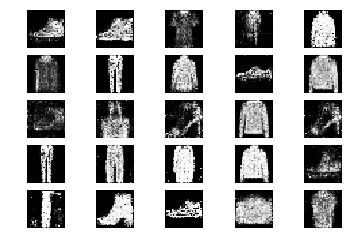

17601 [D loss: 0.656396, acc.: 57.81%] [G loss: 0.839126]
17602 [D loss: 0.655845, acc.: 59.38%] [G loss: 0.851355]
17603 [D loss: 0.646848, acc.: 56.25%] [G loss: 0.883604]
17604 [D loss: 0.647092, acc.: 65.62%] [G loss: 0.892340]
17605 [D loss: 0.658637, acc.: 59.38%] [G loss: 0.954581]
17606 [D loss: 0.702506, acc.: 57.81%] [G loss: 0.886621]
17607 [D loss: 0.665607, acc.: 65.62%] [G loss: 0.899810]
17608 [D loss: 0.639530, acc.: 65.62%] [G loss: 0.894678]
17609 [D loss: 0.558021, acc.: 71.88%] [G loss: 0.869976]
17610 [D loss: 0.687328, acc.: 54.69%] [G loss: 0.981394]
17611 [D loss: 0.652745, acc.: 59.38%] [G loss: 0.822888]
17612 [D loss: 0.673914, acc.: 56.25%] [G loss: 0.855749]
17613 [D loss: 0.663997, acc.: 59.38%] [G loss: 0.910561]
17614 [D loss: 0.652883, acc.: 67.19%] [G loss: 0.922754]
17615 [D loss: 0.634541, acc.: 62.50%] [G loss: 0.915321]
17616 [D loss: 0.586010, acc.: 70.31%] [G loss: 0.998337]
17617 [D loss: 0.651440, acc.: 62.50%] [G loss: 0.898030]
17618 [D loss:

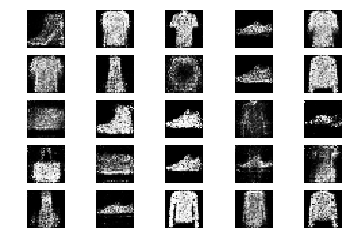

17801 [D loss: 0.676331, acc.: 57.81%] [G loss: 1.022197]
17802 [D loss: 0.724167, acc.: 54.69%] [G loss: 0.867047]
17803 [D loss: 0.649808, acc.: 64.06%] [G loss: 0.967629]
17804 [D loss: 0.613815, acc.: 67.19%] [G loss: 0.894240]
17805 [D loss: 0.704656, acc.: 46.88%] [G loss: 0.862129]
17806 [D loss: 0.660659, acc.: 57.81%] [G loss: 0.881219]
17807 [D loss: 0.679982, acc.: 64.06%] [G loss: 0.880561]
17808 [D loss: 0.634312, acc.: 62.50%] [G loss: 0.884179]
17809 [D loss: 0.697305, acc.: 54.69%] [G loss: 0.875696]
17810 [D loss: 0.633446, acc.: 65.62%] [G loss: 1.029156]
17811 [D loss: 0.602050, acc.: 62.50%] [G loss: 0.905818]
17812 [D loss: 0.604146, acc.: 65.62%] [G loss: 0.899612]
17813 [D loss: 0.667052, acc.: 60.94%] [G loss: 0.934382]
17814 [D loss: 0.696031, acc.: 57.81%] [G loss: 0.994410]
17815 [D loss: 0.651543, acc.: 54.69%] [G loss: 0.917391]
17816 [D loss: 0.728952, acc.: 50.00%] [G loss: 0.938752]
17817 [D loss: 0.652548, acc.: 60.94%] [G loss: 0.957802]
17818 [D loss:

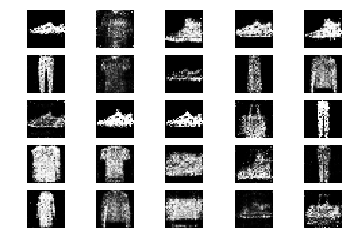

18001 [D loss: 0.607980, acc.: 67.19%] [G loss: 0.943897]
18002 [D loss: 0.641912, acc.: 65.62%] [G loss: 0.887499]
18003 [D loss: 0.610212, acc.: 68.75%] [G loss: 0.896260]
18004 [D loss: 0.588318, acc.: 70.31%] [G loss: 0.931930]
18005 [D loss: 0.583108, acc.: 67.19%] [G loss: 0.939920]
18006 [D loss: 0.661335, acc.: 64.06%] [G loss: 0.937618]
18007 [D loss: 0.707563, acc.: 56.25%] [G loss: 0.968973]
18008 [D loss: 0.656284, acc.: 59.38%] [G loss: 0.835638]
18009 [D loss: 0.723295, acc.: 46.88%] [G loss: 0.851272]
18010 [D loss: 0.619803, acc.: 62.50%] [G loss: 0.874201]
18011 [D loss: 0.680135, acc.: 57.81%] [G loss: 0.902889]
18012 [D loss: 0.583613, acc.: 70.31%] [G loss: 0.930324]
18013 [D loss: 0.617272, acc.: 68.75%] [G loss: 0.943836]
18014 [D loss: 0.665509, acc.: 59.38%] [G loss: 0.915444]
18015 [D loss: 0.614259, acc.: 62.50%] [G loss: 0.879085]
18016 [D loss: 0.637086, acc.: 62.50%] [G loss: 0.859323]
18017 [D loss: 0.668299, acc.: 57.81%] [G loss: 0.899378]
18018 [D loss:

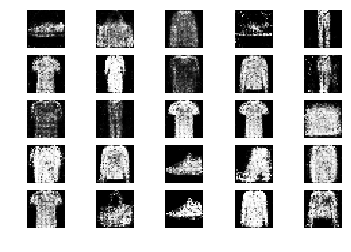

18201 [D loss: 0.658671, acc.: 57.81%] [G loss: 0.903043]
18202 [D loss: 0.611628, acc.: 60.94%] [G loss: 0.913478]
18203 [D loss: 0.651897, acc.: 56.25%] [G loss: 0.869770]
18204 [D loss: 0.635991, acc.: 65.62%] [G loss: 0.993013]
18205 [D loss: 0.645472, acc.: 57.81%] [G loss: 0.891166]
18206 [D loss: 0.698385, acc.: 57.81%] [G loss: 0.877378]
18207 [D loss: 0.675973, acc.: 62.50%] [G loss: 0.906387]
18208 [D loss: 0.660655, acc.: 64.06%] [G loss: 0.924217]
18209 [D loss: 0.630788, acc.: 59.38%] [G loss: 0.887214]
18210 [D loss: 0.525886, acc.: 76.56%] [G loss: 0.887688]
18211 [D loss: 0.681012, acc.: 56.25%] [G loss: 0.942102]
18212 [D loss: 0.655450, acc.: 57.81%] [G loss: 0.999352]
18213 [D loss: 0.683971, acc.: 53.12%] [G loss: 0.893250]
18214 [D loss: 0.579333, acc.: 73.44%] [G loss: 0.921826]
18215 [D loss: 0.644925, acc.: 64.06%] [G loss: 0.830041]
18216 [D loss: 0.678923, acc.: 59.38%] [G loss: 0.945051]
18217 [D loss: 0.664859, acc.: 57.81%] [G loss: 0.926772]
18218 [D loss:

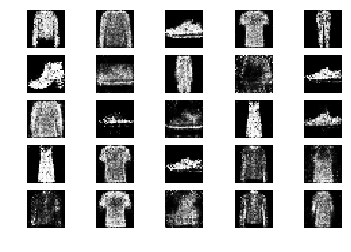

18401 [D loss: 0.609313, acc.: 67.19%] [G loss: 0.905508]
18402 [D loss: 0.652226, acc.: 59.38%] [G loss: 0.940017]
18403 [D loss: 0.621606, acc.: 62.50%] [G loss: 0.867110]
18404 [D loss: 0.673660, acc.: 56.25%] [G loss: 0.906531]
18405 [D loss: 0.667990, acc.: 60.94%] [G loss: 0.901236]
18406 [D loss: 0.732371, acc.: 53.12%] [G loss: 0.987285]
18407 [D loss: 0.643480, acc.: 65.62%] [G loss: 0.856287]
18408 [D loss: 0.656078, acc.: 67.19%] [G loss: 0.816160]
18409 [D loss: 0.667934, acc.: 68.75%] [G loss: 0.895445]
18410 [D loss: 0.644629, acc.: 59.38%] [G loss: 0.889326]
18411 [D loss: 0.654464, acc.: 59.38%] [G loss: 0.902113]
18412 [D loss: 0.628471, acc.: 57.81%] [G loss: 0.953595]
18413 [D loss: 0.628822, acc.: 67.19%] [G loss: 0.913652]
18414 [D loss: 0.632807, acc.: 67.19%] [G loss: 0.788463]
18415 [D loss: 0.691773, acc.: 53.12%] [G loss: 0.884770]
18416 [D loss: 0.606041, acc.: 73.44%] [G loss: 0.877945]
18417 [D loss: 0.594477, acc.: 65.62%] [G loss: 0.873692]
18418 [D loss:

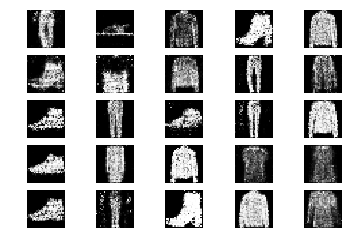

18601 [D loss: 0.683185, acc.: 60.94%] [G loss: 0.857331]
18602 [D loss: 0.647708, acc.: 62.50%] [G loss: 0.945455]
18603 [D loss: 0.640135, acc.: 64.06%] [G loss: 1.041836]
18604 [D loss: 0.673317, acc.: 57.81%] [G loss: 0.975111]
18605 [D loss: 0.717704, acc.: 56.25%] [G loss: 0.953999]
18606 [D loss: 0.664584, acc.: 62.50%] [G loss: 0.944997]
18607 [D loss: 0.643026, acc.: 64.06%] [G loss: 0.914923]
18608 [D loss: 0.681590, acc.: 56.25%] [G loss: 0.933354]
18609 [D loss: 0.630573, acc.: 73.44%] [G loss: 0.903760]
18610 [D loss: 0.656415, acc.: 64.06%] [G loss: 0.910397]
18611 [D loss: 0.618848, acc.: 62.50%] [G loss: 0.888827]
18612 [D loss: 0.674442, acc.: 53.12%] [G loss: 0.905101]
18613 [D loss: 0.633545, acc.: 65.62%] [G loss: 0.864617]
18614 [D loss: 0.628419, acc.: 65.62%] [G loss: 0.919914]
18615 [D loss: 0.602962, acc.: 67.19%] [G loss: 0.905929]
18616 [D loss: 0.708916, acc.: 51.56%] [G loss: 1.040844]
18617 [D loss: 0.604262, acc.: 67.19%] [G loss: 0.924836]
18618 [D loss:

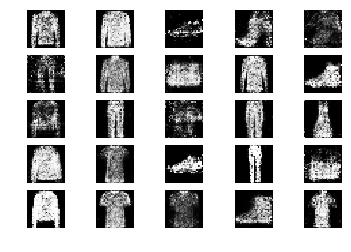

18801 [D loss: 0.618547, acc.: 65.62%] [G loss: 0.948345]
18802 [D loss: 0.674378, acc.: 64.06%] [G loss: 0.835337]
18803 [D loss: 0.655449, acc.: 51.56%] [G loss: 0.859433]
18804 [D loss: 0.687035, acc.: 53.12%] [G loss: 0.922018]
18805 [D loss: 0.661014, acc.: 56.25%] [G loss: 0.930693]
18806 [D loss: 0.615674, acc.: 67.19%] [G loss: 0.953233]
18807 [D loss: 0.697488, acc.: 62.50%] [G loss: 0.942509]
18808 [D loss: 0.635121, acc.: 62.50%] [G loss: 0.990153]
18809 [D loss: 0.638850, acc.: 67.19%] [G loss: 0.982971]
18810 [D loss: 0.666084, acc.: 64.06%] [G loss: 0.980563]
18811 [D loss: 0.645949, acc.: 64.06%] [G loss: 1.033058]
18812 [D loss: 0.593120, acc.: 62.50%] [G loss: 1.027656]
18813 [D loss: 0.681015, acc.: 53.12%] [G loss: 1.004219]
18814 [D loss: 0.698029, acc.: 62.50%] [G loss: 0.960115]
18815 [D loss: 0.624505, acc.: 64.06%] [G loss: 0.982094]
18816 [D loss: 0.665326, acc.: 57.81%] [G loss: 0.957679]
18817 [D loss: 0.649373, acc.: 62.50%] [G loss: 0.964417]
18818 [D loss:

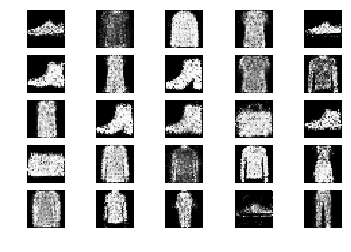

19001 [D loss: 0.685632, acc.: 56.25%] [G loss: 0.909396]
19002 [D loss: 0.691282, acc.: 60.94%] [G loss: 0.869373]
19003 [D loss: 0.676249, acc.: 62.50%] [G loss: 0.819867]
19004 [D loss: 0.681742, acc.: 56.25%] [G loss: 0.849827]
19005 [D loss: 0.624424, acc.: 65.62%] [G loss: 0.808562]
19006 [D loss: 0.667103, acc.: 56.25%] [G loss: 0.926213]
19007 [D loss: 0.713466, acc.: 48.44%] [G loss: 0.994439]
19008 [D loss: 0.638679, acc.: 62.50%] [G loss: 0.967422]
19009 [D loss: 0.600743, acc.: 67.19%] [G loss: 0.867438]
19010 [D loss: 0.640324, acc.: 67.19%] [G loss: 0.951355]
19011 [D loss: 0.621712, acc.: 67.19%] [G loss: 0.832069]
19012 [D loss: 0.618456, acc.: 59.38%] [G loss: 0.932324]
19013 [D loss: 0.653659, acc.: 51.56%] [G loss: 0.873478]
19014 [D loss: 0.699025, acc.: 57.81%] [G loss: 0.847433]
19015 [D loss: 0.632950, acc.: 60.94%] [G loss: 0.957856]
19016 [D loss: 0.632993, acc.: 62.50%] [G loss: 0.996303]
19017 [D loss: 0.647420, acc.: 57.81%] [G loss: 0.914564]
19018 [D loss:

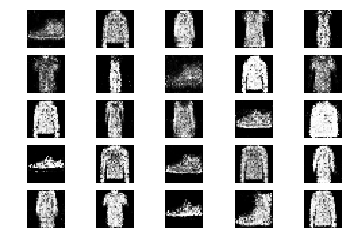

19201 [D loss: 0.674988, acc.: 50.00%] [G loss: 0.906913]
19202 [D loss: 0.583137, acc.: 71.88%] [G loss: 0.877379]
19203 [D loss: 0.707187, acc.: 59.38%] [G loss: 0.879202]
19204 [D loss: 0.594519, acc.: 73.44%] [G loss: 0.948982]
19205 [D loss: 0.674885, acc.: 56.25%] [G loss: 0.968052]
19206 [D loss: 0.635862, acc.: 62.50%] [G loss: 0.873626]
19207 [D loss: 0.708580, acc.: 50.00%] [G loss: 0.903226]
19208 [D loss: 0.678628, acc.: 57.81%] [G loss: 0.904273]
19209 [D loss: 0.665216, acc.: 59.38%] [G loss: 0.849055]
19210 [D loss: 0.606462, acc.: 68.75%] [G loss: 0.971849]
19211 [D loss: 0.634897, acc.: 67.19%] [G loss: 0.926370]
19212 [D loss: 0.631469, acc.: 62.50%] [G loss: 0.932052]
19213 [D loss: 0.612054, acc.: 64.06%] [G loss: 1.008626]
19214 [D loss: 0.693070, acc.: 54.69%] [G loss: 0.978290]
19215 [D loss: 0.640271, acc.: 62.50%] [G loss: 0.929335]
19216 [D loss: 0.628866, acc.: 65.62%] [G loss: 0.966302]
19217 [D loss: 0.630151, acc.: 60.94%] [G loss: 0.907350]
19218 [D loss:

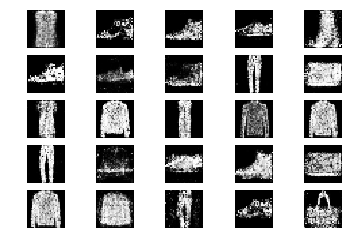

19401 [D loss: 0.649421, acc.: 67.19%] [G loss: 1.052011]
19402 [D loss: 0.658882, acc.: 60.94%] [G loss: 0.939736]
19403 [D loss: 0.646193, acc.: 60.94%] [G loss: 0.903338]
19404 [D loss: 0.696099, acc.: 56.25%] [G loss: 0.882137]
19405 [D loss: 0.684466, acc.: 54.69%] [G loss: 0.835205]
19406 [D loss: 0.650460, acc.: 59.38%] [G loss: 0.870538]
19407 [D loss: 0.686929, acc.: 50.00%] [G loss: 0.855474]
19408 [D loss: 0.640265, acc.: 60.94%] [G loss: 0.907222]
19409 [D loss: 0.611004, acc.: 68.75%] [G loss: 0.883724]
19410 [D loss: 0.667781, acc.: 53.12%] [G loss: 0.866476]
19411 [D loss: 0.683990, acc.: 54.69%] [G loss: 0.831749]
19412 [D loss: 0.689591, acc.: 60.94%] [G loss: 0.820677]
19413 [D loss: 0.680140, acc.: 54.69%] [G loss: 0.840509]
19414 [D loss: 0.614413, acc.: 64.06%] [G loss: 0.899624]
19415 [D loss: 0.662449, acc.: 67.19%] [G loss: 0.857672]
19416 [D loss: 0.693381, acc.: 59.38%] [G loss: 0.822731]
19417 [D loss: 0.660910, acc.: 59.38%] [G loss: 0.929712]
19418 [D loss:

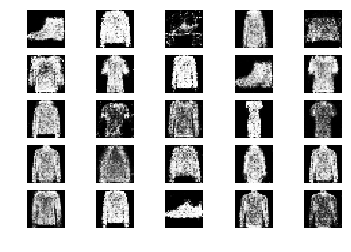

19601 [D loss: 0.609926, acc.: 59.38%] [G loss: 0.976566]
19602 [D loss: 0.594669, acc.: 73.44%] [G loss: 0.946024]
19603 [D loss: 0.629870, acc.: 60.94%] [G loss: 0.822454]
19604 [D loss: 0.653752, acc.: 64.06%] [G loss: 0.913760]
19605 [D loss: 0.618944, acc.: 64.06%] [G loss: 0.925799]
19606 [D loss: 0.677189, acc.: 53.12%] [G loss: 1.070107]
19607 [D loss: 0.630132, acc.: 60.94%] [G loss: 0.931448]
19608 [D loss: 0.623315, acc.: 62.50%] [G loss: 0.906229]
19609 [D loss: 0.650474, acc.: 60.94%] [G loss: 0.892573]
19610 [D loss: 0.602309, acc.: 71.88%] [G loss: 0.930841]
19611 [D loss: 0.644898, acc.: 57.81%] [G loss: 0.893797]
19612 [D loss: 0.723239, acc.: 59.38%] [G loss: 0.931772]
19613 [D loss: 0.639596, acc.: 60.94%] [G loss: 0.869614]
19614 [D loss: 0.614623, acc.: 68.75%] [G loss: 1.007576]
19615 [D loss: 0.646179, acc.: 64.06%] [G loss: 0.963597]
19616 [D loss: 0.643565, acc.: 59.38%] [G loss: 1.015076]
19617 [D loss: 0.614420, acc.: 65.62%] [G loss: 0.863556]
19618 [D loss:

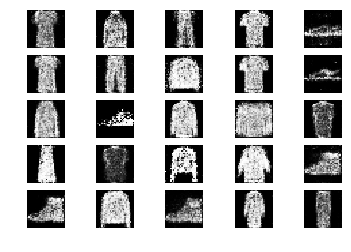

19801 [D loss: 0.627436, acc.: 65.62%] [G loss: 0.846002]
19802 [D loss: 0.699862, acc.: 51.56%] [G loss: 0.943987]
19803 [D loss: 0.696344, acc.: 50.00%] [G loss: 0.883319]
19804 [D loss: 0.738105, acc.: 48.44%] [G loss: 0.898651]
19805 [D loss: 0.636309, acc.: 65.62%] [G loss: 0.871033]
19806 [D loss: 0.657130, acc.: 54.69%] [G loss: 0.888782]
19807 [D loss: 0.668325, acc.: 56.25%] [G loss: 0.926312]
19808 [D loss: 0.633911, acc.: 62.50%] [G loss: 0.996264]
19809 [D loss: 0.674079, acc.: 62.50%] [G loss: 0.866393]
19810 [D loss: 0.624591, acc.: 65.62%] [G loss: 0.934143]
19811 [D loss: 0.619514, acc.: 67.19%] [G loss: 0.934009]
19812 [D loss: 0.626033, acc.: 65.62%] [G loss: 0.891899]
19813 [D loss: 0.660789, acc.: 60.94%] [G loss: 0.864658]
19814 [D loss: 0.594465, acc.: 70.31%] [G loss: 0.883043]
19815 [D loss: 0.639323, acc.: 70.31%] [G loss: 0.970291]
19816 [D loss: 0.639877, acc.: 65.62%] [G loss: 0.867486]
19817 [D loss: 0.597292, acc.: 70.31%] [G loss: 0.893418]
19818 [D loss:

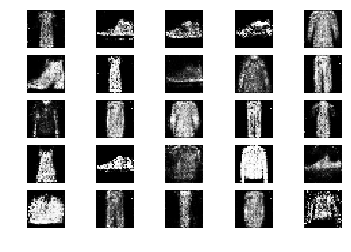

20001 [D loss: 0.658765, acc.: 56.25%] [G loss: 0.861775]
20002 [D loss: 0.670559, acc.: 53.12%] [G loss: 1.009263]
20003 [D loss: 0.666408, acc.: 54.69%] [G loss: 0.896193]
20004 [D loss: 0.593489, acc.: 65.62%] [G loss: 0.863606]
20005 [D loss: 0.686738, acc.: 59.38%] [G loss: 0.835147]
20006 [D loss: 0.603407, acc.: 70.31%] [G loss: 0.936293]
20007 [D loss: 0.637952, acc.: 62.50%] [G loss: 0.903827]
20008 [D loss: 0.653692, acc.: 62.50%] [G loss: 0.998185]
20009 [D loss: 0.674592, acc.: 57.81%] [G loss: 0.867180]
20010 [D loss: 0.685122, acc.: 56.25%] [G loss: 0.918378]
20011 [D loss: 0.663314, acc.: 60.94%] [G loss: 0.876883]
20012 [D loss: 0.581344, acc.: 70.31%] [G loss: 0.853342]
20013 [D loss: 0.637483, acc.: 65.62%] [G loss: 0.903327]
20014 [D loss: 0.645532, acc.: 60.94%] [G loss: 0.899584]
20015 [D loss: 0.702513, acc.: 62.50%] [G loss: 0.882895]
20016 [D loss: 0.659653, acc.: 57.81%] [G loss: 0.975191]
20017 [D loss: 0.652396, acc.: 60.94%] [G loss: 0.931087]
20018 [D loss:

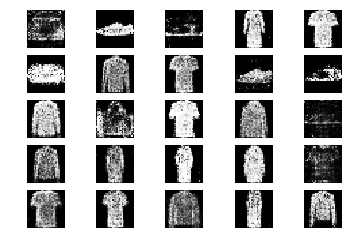

20201 [D loss: 0.593381, acc.: 64.06%] [G loss: 0.847837]
20202 [D loss: 0.604395, acc.: 71.88%] [G loss: 0.864882]
20203 [D loss: 0.594188, acc.: 68.75%] [G loss: 0.927005]
20204 [D loss: 0.615332, acc.: 68.75%] [G loss: 0.960963]
20205 [D loss: 0.598695, acc.: 68.75%] [G loss: 0.960489]
20206 [D loss: 0.628152, acc.: 67.19%] [G loss: 0.943254]
20207 [D loss: 0.683096, acc.: 57.81%] [G loss: 1.023580]
20208 [D loss: 0.662598, acc.: 65.62%] [G loss: 0.984646]
20209 [D loss: 0.640539, acc.: 62.50%] [G loss: 1.037577]
20210 [D loss: 0.658395, acc.: 64.06%] [G loss: 0.976861]
20211 [D loss: 0.624860, acc.: 64.06%] [G loss: 0.933260]
20212 [D loss: 0.740929, acc.: 53.12%] [G loss: 0.964983]
20213 [D loss: 0.638437, acc.: 64.06%] [G loss: 0.996394]
20214 [D loss: 0.603507, acc.: 73.44%] [G loss: 0.951477]
20215 [D loss: 0.670197, acc.: 60.94%] [G loss: 0.892960]
20216 [D loss: 0.562540, acc.: 75.00%] [G loss: 0.926562]
20217 [D loss: 0.692782, acc.: 56.25%] [G loss: 0.830071]
20218 [D loss:

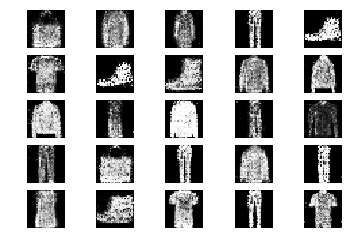

20401 [D loss: 0.588348, acc.: 71.88%] [G loss: 0.775746]
20402 [D loss: 0.717171, acc.: 48.44%] [G loss: 0.881521]
20403 [D loss: 0.624178, acc.: 67.19%] [G loss: 0.951304]
20404 [D loss: 0.616535, acc.: 68.75%] [G loss: 0.910987]
20405 [D loss: 0.593286, acc.: 73.44%] [G loss: 0.891716]
20406 [D loss: 0.730157, acc.: 50.00%] [G loss: 0.904555]
20407 [D loss: 0.603438, acc.: 73.44%] [G loss: 0.945265]
20408 [D loss: 0.625911, acc.: 62.50%] [G loss: 1.027747]
20409 [D loss: 0.685497, acc.: 62.50%] [G loss: 0.968341]
20410 [D loss: 0.697496, acc.: 51.56%] [G loss: 0.808759]
20411 [D loss: 0.650914, acc.: 64.06%] [G loss: 0.960326]
20412 [D loss: 0.721370, acc.: 50.00%] [G loss: 0.918830]
20413 [D loss: 0.614641, acc.: 57.81%] [G loss: 0.971456]
20414 [D loss: 0.683256, acc.: 57.81%] [G loss: 0.966259]
20415 [D loss: 0.591922, acc.: 68.75%] [G loss: 0.926237]
20416 [D loss: 0.672474, acc.: 54.69%] [G loss: 0.939540]
20417 [D loss: 0.687405, acc.: 59.38%] [G loss: 0.939478]
20418 [D loss:

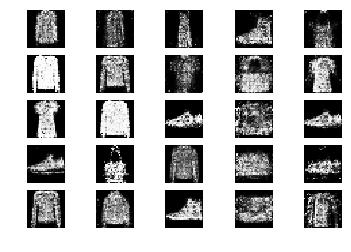

20601 [D loss: 0.660621, acc.: 59.38%] [G loss: 0.869445]
20602 [D loss: 0.691007, acc.: 59.38%] [G loss: 0.826082]
20603 [D loss: 0.661363, acc.: 57.81%] [G loss: 0.839460]
20604 [D loss: 0.698577, acc.: 65.62%] [G loss: 0.831602]
20605 [D loss: 0.644251, acc.: 64.06%] [G loss: 0.921780]
20606 [D loss: 0.590733, acc.: 70.31%] [G loss: 0.850084]
20607 [D loss: 0.677864, acc.: 57.81%] [G loss: 0.917243]
20608 [D loss: 0.624891, acc.: 62.50%] [G loss: 0.961499]
20609 [D loss: 0.670322, acc.: 64.06%] [G loss: 0.941276]
20610 [D loss: 0.569709, acc.: 71.88%] [G loss: 0.948890]
20611 [D loss: 0.648597, acc.: 57.81%] [G loss: 0.942596]
20612 [D loss: 0.652613, acc.: 57.81%] [G loss: 0.938903]
20613 [D loss: 0.621204, acc.: 64.06%] [G loss: 0.810689]
20614 [D loss: 0.629164, acc.: 65.62%] [G loss: 0.975766]
20615 [D loss: 0.660292, acc.: 62.50%] [G loss: 0.903781]
20616 [D loss: 0.639268, acc.: 64.06%] [G loss: 0.891860]
20617 [D loss: 0.601725, acc.: 70.31%] [G loss: 0.948904]
20618 [D loss:

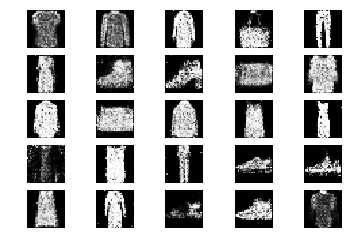

20801 [D loss: 0.641736, acc.: 64.06%] [G loss: 0.961651]
20802 [D loss: 0.621339, acc.: 65.62%] [G loss: 0.821965]
20803 [D loss: 0.587173, acc.: 68.75%] [G loss: 0.881375]
20804 [D loss: 0.613427, acc.: 70.31%] [G loss: 1.003857]
20805 [D loss: 0.633175, acc.: 59.38%] [G loss: 0.873693]
20806 [D loss: 0.626202, acc.: 65.62%] [G loss: 1.015774]
20807 [D loss: 0.638734, acc.: 60.94%] [G loss: 0.949917]
20808 [D loss: 0.666847, acc.: 56.25%] [G loss: 0.825128]
20809 [D loss: 0.668326, acc.: 60.94%] [G loss: 0.858020]
20810 [D loss: 0.639455, acc.: 68.75%] [G loss: 0.876990]
20811 [D loss: 0.632904, acc.: 65.62%] [G loss: 0.987640]
20812 [D loss: 0.677795, acc.: 54.69%] [G loss: 0.885979]
20813 [D loss: 0.666117, acc.: 57.81%] [G loss: 0.893031]
20814 [D loss: 0.631760, acc.: 57.81%] [G loss: 0.961701]
20815 [D loss: 0.585233, acc.: 65.62%] [G loss: 0.930942]
20816 [D loss: 0.669376, acc.: 59.38%] [G loss: 0.952483]
20817 [D loss: 0.591674, acc.: 73.44%] [G loss: 0.934760]
20818 [D loss:

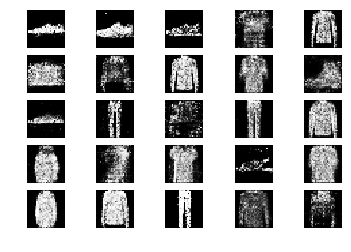

21001 [D loss: 0.634621, acc.: 65.62%] [G loss: 0.873086]
21002 [D loss: 0.604575, acc.: 64.06%] [G loss: 0.970448]
21003 [D loss: 0.678620, acc.: 59.38%] [G loss: 0.924728]
21004 [D loss: 0.619243, acc.: 70.31%] [G loss: 0.851961]
21005 [D loss: 0.688242, acc.: 53.12%] [G loss: 0.929375]
21006 [D loss: 0.615189, acc.: 65.62%] [G loss: 0.927716]
21007 [D loss: 0.691283, acc.: 64.06%] [G loss: 0.903162]
21008 [D loss: 0.596660, acc.: 70.31%] [G loss: 0.939617]
21009 [D loss: 0.744608, acc.: 56.25%] [G loss: 0.887655]
21010 [D loss: 0.708521, acc.: 48.44%] [G loss: 0.843413]
21011 [D loss: 0.656183, acc.: 54.69%] [G loss: 0.888845]
21012 [D loss: 0.608495, acc.: 64.06%] [G loss: 0.854814]
21013 [D loss: 0.608992, acc.: 67.19%] [G loss: 0.921607]
21014 [D loss: 0.640529, acc.: 62.50%] [G loss: 0.983104]
21015 [D loss: 0.651606, acc.: 70.31%] [G loss: 1.069615]
21016 [D loss: 0.604771, acc.: 68.75%] [G loss: 0.948277]
21017 [D loss: 0.658777, acc.: 59.38%] [G loss: 1.013590]
21018 [D loss:

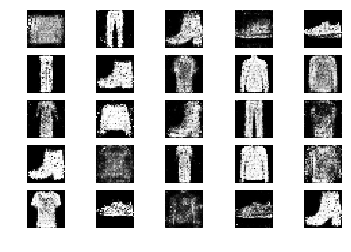

21201 [D loss: 0.722596, acc.: 53.12%] [G loss: 0.927467]
21202 [D loss: 0.639509, acc.: 64.06%] [G loss: 0.882565]
21203 [D loss: 0.641231, acc.: 60.94%] [G loss: 0.910877]
21204 [D loss: 0.648335, acc.: 62.50%] [G loss: 0.882878]
21205 [D loss: 0.691737, acc.: 56.25%] [G loss: 0.960507]
21206 [D loss: 0.705238, acc.: 54.69%] [G loss: 0.882465]
21207 [D loss: 0.607636, acc.: 68.75%] [G loss: 0.942540]
21208 [D loss: 0.609450, acc.: 70.31%] [G loss: 0.918336]
21209 [D loss: 0.605324, acc.: 70.31%] [G loss: 0.956787]
21210 [D loss: 0.666512, acc.: 59.38%] [G loss: 0.958564]
21211 [D loss: 0.720699, acc.: 50.00%] [G loss: 0.933853]
21212 [D loss: 0.636210, acc.: 64.06%] [G loss: 0.996712]
21213 [D loss: 0.700307, acc.: 50.00%] [G loss: 0.913838]
21214 [D loss: 0.676097, acc.: 60.94%] [G loss: 0.883456]
21215 [D loss: 0.645262, acc.: 57.81%] [G loss: 0.830152]
21216 [D loss: 0.663183, acc.: 64.06%] [G loss: 0.879165]
21217 [D loss: 0.632436, acc.: 64.06%] [G loss: 0.996752]
21218 [D loss:

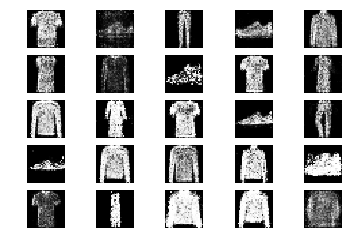

21401 [D loss: 0.664451, acc.: 59.38%] [G loss: 0.872241]
21402 [D loss: 0.622531, acc.: 68.75%] [G loss: 0.920730]
21403 [D loss: 0.680360, acc.: 59.38%] [G loss: 0.872259]
21404 [D loss: 0.646679, acc.: 56.25%] [G loss: 0.832658]
21405 [D loss: 0.649204, acc.: 65.62%] [G loss: 0.940900]
21406 [D loss: 0.656337, acc.: 51.56%] [G loss: 0.888125]
21407 [D loss: 0.637311, acc.: 67.19%] [G loss: 0.905214]
21408 [D loss: 0.645362, acc.: 53.12%] [G loss: 0.926822]
21409 [D loss: 0.635863, acc.: 67.19%] [G loss: 0.970959]
21410 [D loss: 0.642357, acc.: 56.25%] [G loss: 0.960002]
21411 [D loss: 0.626763, acc.: 64.06%] [G loss: 0.918410]
21412 [D loss: 0.632432, acc.: 57.81%] [G loss: 0.958303]
21413 [D loss: 0.590419, acc.: 70.31%] [G loss: 0.979647]
21414 [D loss: 0.703484, acc.: 53.12%] [G loss: 0.925643]
21415 [D loss: 0.618809, acc.: 67.19%] [G loss: 0.985188]
21416 [D loss: 0.677286, acc.: 59.38%] [G loss: 0.868412]
21417 [D loss: 0.739958, acc.: 42.19%] [G loss: 0.876234]
21418 [D loss:

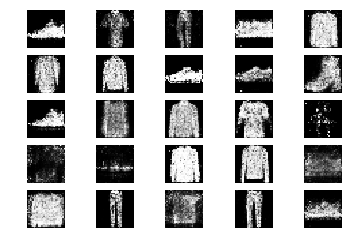

21601 [D loss: 0.656093, acc.: 62.50%] [G loss: 0.839288]
21602 [D loss: 0.674411, acc.: 64.06%] [G loss: 0.979861]
21603 [D loss: 0.697705, acc.: 60.94%] [G loss: 0.910760]
21604 [D loss: 0.596256, acc.: 71.88%] [G loss: 0.993680]
21605 [D loss: 0.654308, acc.: 67.19%] [G loss: 0.889653]
21606 [D loss: 0.652265, acc.: 64.06%] [G loss: 0.973401]
21607 [D loss: 0.691157, acc.: 60.94%] [G loss: 0.934064]
21608 [D loss: 0.653172, acc.: 54.69%] [G loss: 0.883801]
21609 [D loss: 0.647925, acc.: 60.94%] [G loss: 0.910294]
21610 [D loss: 0.621536, acc.: 67.19%] [G loss: 0.915414]
21611 [D loss: 0.757542, acc.: 40.62%] [G loss: 0.953762]
21612 [D loss: 0.599080, acc.: 68.75%] [G loss: 0.857192]
21613 [D loss: 0.613861, acc.: 64.06%] [G loss: 0.893639]
21614 [D loss: 0.594235, acc.: 76.56%] [G loss: 0.922049]
21615 [D loss: 0.652999, acc.: 59.38%] [G loss: 0.946187]
21616 [D loss: 0.726080, acc.: 60.94%] [G loss: 0.833019]
21617 [D loss: 0.618645, acc.: 70.31%] [G loss: 0.873648]
21618 [D loss:

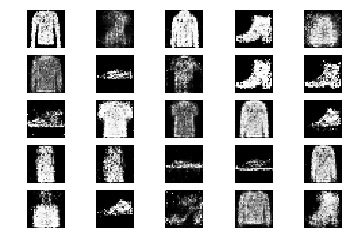

21801 [D loss: 0.685059, acc.: 57.81%] [G loss: 0.918189]
21802 [D loss: 0.650163, acc.: 64.06%] [G loss: 0.921958]
21803 [D loss: 0.674013, acc.: 62.50%] [G loss: 0.897183]
21804 [D loss: 0.699556, acc.: 46.88%] [G loss: 0.918929]
21805 [D loss: 0.599113, acc.: 71.88%] [G loss: 0.906956]
21806 [D loss: 0.591178, acc.: 71.88%] [G loss: 0.988678]
21807 [D loss: 0.611785, acc.: 68.75%] [G loss: 0.978523]
21808 [D loss: 0.577105, acc.: 73.44%] [G loss: 1.043358]
21809 [D loss: 0.633169, acc.: 64.06%] [G loss: 1.056377]
21810 [D loss: 0.589390, acc.: 70.31%] [G loss: 0.946704]
21811 [D loss: 0.595311, acc.: 68.75%] [G loss: 1.034668]
21812 [D loss: 0.672180, acc.: 59.38%] [G loss: 0.863818]
21813 [D loss: 0.612020, acc.: 60.94%] [G loss: 0.897351]
21814 [D loss: 0.695278, acc.: 57.81%] [G loss: 0.780517]
21815 [D loss: 0.634396, acc.: 56.25%] [G loss: 0.994889]
21816 [D loss: 0.654420, acc.: 64.06%] [G loss: 0.925613]
21817 [D loss: 0.687283, acc.: 56.25%] [G loss: 0.918481]
21818 [D loss:

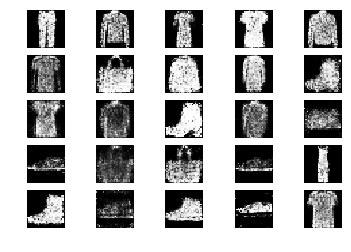

22001 [D loss: 0.609136, acc.: 62.50%] [G loss: 1.019742]
22002 [D loss: 0.683960, acc.: 60.94%] [G loss: 0.916819]
22003 [D loss: 0.735378, acc.: 48.44%] [G loss: 0.921773]
22004 [D loss: 0.692525, acc.: 51.56%] [G loss: 0.918221]
22005 [D loss: 0.627467, acc.: 67.19%] [G loss: 0.941672]
22006 [D loss: 0.719118, acc.: 54.69%] [G loss: 0.953647]
22007 [D loss: 0.662424, acc.: 57.81%] [G loss: 0.845007]
22008 [D loss: 0.657489, acc.: 60.94%] [G loss: 0.900437]
22009 [D loss: 0.618728, acc.: 70.31%] [G loss: 0.936179]
22010 [D loss: 0.631924, acc.: 62.50%] [G loss: 1.011222]
22011 [D loss: 0.680276, acc.: 60.94%] [G loss: 0.965173]
22012 [D loss: 0.741807, acc.: 45.31%] [G loss: 0.963232]
22013 [D loss: 0.687495, acc.: 54.69%] [G loss: 0.874500]
22014 [D loss: 0.665212, acc.: 65.62%] [G loss: 0.879776]
22015 [D loss: 0.692020, acc.: 53.12%] [G loss: 0.975252]
22016 [D loss: 0.652152, acc.: 57.81%] [G loss: 0.926368]
22017 [D loss: 0.602524, acc.: 67.19%] [G loss: 0.862826]
22018 [D loss:

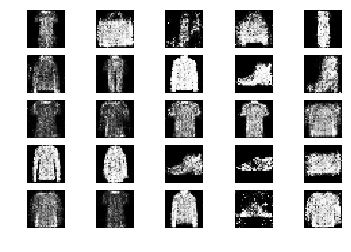

22201 [D loss: 0.715208, acc.: 53.12%] [G loss: 0.923748]
22202 [D loss: 0.680808, acc.: 54.69%] [G loss: 0.981863]
22203 [D loss: 0.679676, acc.: 60.94%] [G loss: 0.881064]
22204 [D loss: 0.621350, acc.: 65.62%] [G loss: 0.899189]
22205 [D loss: 0.626097, acc.: 60.94%] [G loss: 0.923338]
22206 [D loss: 0.623343, acc.: 64.06%] [G loss: 0.929688]
22207 [D loss: 0.632902, acc.: 64.06%] [G loss: 1.008820]
22208 [D loss: 0.618994, acc.: 62.50%] [G loss: 0.978345]
22209 [D loss: 0.652854, acc.: 62.50%] [G loss: 0.933544]
22210 [D loss: 0.680811, acc.: 65.62%] [G loss: 0.928240]
22211 [D loss: 0.735596, acc.: 50.00%] [G loss: 0.946125]
22212 [D loss: 0.680138, acc.: 51.56%] [G loss: 0.957487]
22213 [D loss: 0.675071, acc.: 57.81%] [G loss: 0.969505]
22214 [D loss: 0.640344, acc.: 65.62%] [G loss: 0.894827]
22215 [D loss: 0.644614, acc.: 59.38%] [G loss: 0.803420]
22216 [D loss: 0.663063, acc.: 65.62%] [G loss: 0.849054]
22217 [D loss: 0.585609, acc.: 68.75%] [G loss: 1.016863]
22218 [D loss:

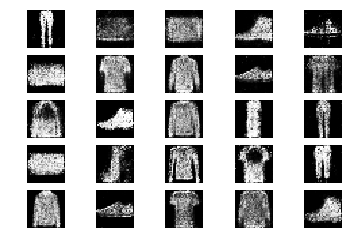

22401 [D loss: 0.668074, acc.: 57.81%] [G loss: 0.995347]
22402 [D loss: 0.647866, acc.: 60.94%] [G loss: 0.913618]
22403 [D loss: 0.598527, acc.: 65.62%] [G loss: 0.883980]
22404 [D loss: 0.657795, acc.: 53.12%] [G loss: 0.975393]
22405 [D loss: 0.695985, acc.: 54.69%] [G loss: 1.026585]
22406 [D loss: 0.662629, acc.: 53.12%] [G loss: 1.000108]
22407 [D loss: 0.618274, acc.: 64.06%] [G loss: 0.968488]
22408 [D loss: 0.752721, acc.: 46.88%] [G loss: 1.027262]
22409 [D loss: 0.626332, acc.: 62.50%] [G loss: 0.845977]
22410 [D loss: 0.615439, acc.: 62.50%] [G loss: 1.026073]
22411 [D loss: 0.744983, acc.: 43.75%] [G loss: 0.933083]
22412 [D loss: 0.630694, acc.: 60.94%] [G loss: 0.950199]
22413 [D loss: 0.629106, acc.: 59.38%] [G loss: 0.914080]
22414 [D loss: 0.662289, acc.: 56.25%] [G loss: 0.911056]
22415 [D loss: 0.681554, acc.: 56.25%] [G loss: 1.023757]
22416 [D loss: 0.632406, acc.: 64.06%] [G loss: 1.057577]
22417 [D loss: 0.677278, acc.: 62.50%] [G loss: 0.984490]
22418 [D loss:

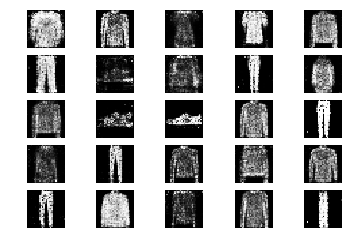

22601 [D loss: 0.614509, acc.: 71.88%] [G loss: 0.963632]
22602 [D loss: 0.604006, acc.: 70.31%] [G loss: 0.944063]
22603 [D loss: 0.655539, acc.: 64.06%] [G loss: 0.960274]
22604 [D loss: 0.641792, acc.: 62.50%] [G loss: 0.901187]
22605 [D loss: 0.652655, acc.: 65.62%] [G loss: 0.894103]
22606 [D loss: 0.642763, acc.: 54.69%] [G loss: 0.934534]
22607 [D loss: 0.653372, acc.: 64.06%] [G loss: 0.900960]
22608 [D loss: 0.644176, acc.: 56.25%] [G loss: 0.950186]
22609 [D loss: 0.718273, acc.: 59.38%] [G loss: 0.907538]
22610 [D loss: 0.627846, acc.: 62.50%] [G loss: 0.956508]
22611 [D loss: 0.714486, acc.: 59.38%] [G loss: 0.919521]
22612 [D loss: 0.717190, acc.: 48.44%] [G loss: 0.879981]
22613 [D loss: 0.628771, acc.: 62.50%] [G loss: 0.910130]
22614 [D loss: 0.676808, acc.: 59.38%] [G loss: 1.051328]
22615 [D loss: 0.636505, acc.: 68.75%] [G loss: 0.971904]
22616 [D loss: 0.651158, acc.: 59.38%] [G loss: 0.978411]
22617 [D loss: 0.646241, acc.: 64.06%] [G loss: 1.040206]
22618 [D loss:

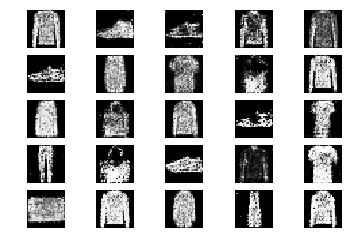

22801 [D loss: 0.611194, acc.: 67.19%] [G loss: 0.974133]
22802 [D loss: 0.625227, acc.: 71.88%] [G loss: 0.937580]
22803 [D loss: 0.633539, acc.: 57.81%] [G loss: 0.818017]
22804 [D loss: 0.680423, acc.: 56.25%] [G loss: 0.834679]
22805 [D loss: 0.594693, acc.: 71.88%] [G loss: 1.011764]
22806 [D loss: 0.571173, acc.: 75.00%] [G loss: 0.922246]
22807 [D loss: 0.643267, acc.: 64.06%] [G loss: 0.966770]
22808 [D loss: 0.657341, acc.: 65.62%] [G loss: 0.954123]
22809 [D loss: 0.707065, acc.: 62.50%] [G loss: 1.017280]
22810 [D loss: 0.688644, acc.: 60.94%] [G loss: 0.979934]
22811 [D loss: 0.616161, acc.: 64.06%] [G loss: 0.911910]
22812 [D loss: 0.668980, acc.: 62.50%] [G loss: 0.913814]
22813 [D loss: 0.556661, acc.: 79.69%] [G loss: 0.930050]
22814 [D loss: 0.683144, acc.: 59.38%] [G loss: 0.909581]
22815 [D loss: 0.694903, acc.: 50.00%] [G loss: 0.915337]
22816 [D loss: 0.629891, acc.: 65.62%] [G loss: 0.966338]
22817 [D loss: 0.667076, acc.: 59.38%] [G loss: 0.895278]
22818 [D loss:

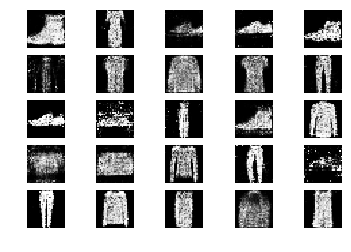

23001 [D loss: 0.667108, acc.: 54.69%] [G loss: 0.947048]
23002 [D loss: 0.650154, acc.: 60.94%] [G loss: 0.923921]
23003 [D loss: 0.640492, acc.: 62.50%] [G loss: 0.811027]
23004 [D loss: 0.567823, acc.: 71.88%] [G loss: 0.864774]
23005 [D loss: 0.691125, acc.: 57.81%] [G loss: 0.900584]
23006 [D loss: 0.601667, acc.: 65.62%] [G loss: 0.851645]
23007 [D loss: 0.567778, acc.: 68.75%] [G loss: 0.952645]
23008 [D loss: 0.719214, acc.: 64.06%] [G loss: 0.919517]
23009 [D loss: 0.632898, acc.: 68.75%] [G loss: 0.929111]
23010 [D loss: 0.629856, acc.: 62.50%] [G loss: 0.870733]
23011 [D loss: 0.589799, acc.: 64.06%] [G loss: 0.937364]
23012 [D loss: 0.668929, acc.: 67.19%] [G loss: 0.992763]
23013 [D loss: 0.664971, acc.: 60.94%] [G loss: 0.977325]
23014 [D loss: 0.606032, acc.: 62.50%] [G loss: 0.948108]
23015 [D loss: 0.716365, acc.: 56.25%] [G loss: 1.017202]
23016 [D loss: 0.638674, acc.: 62.50%] [G loss: 1.016419]
23017 [D loss: 0.638630, acc.: 71.88%] [G loss: 1.030422]
23018 [D loss:

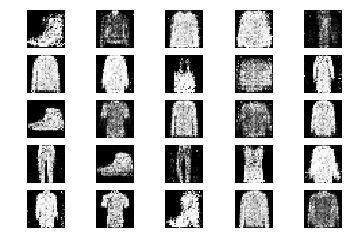

23201 [D loss: 0.677500, acc.: 56.25%] [G loss: 0.905611]
23202 [D loss: 0.698672, acc.: 54.69%] [G loss: 0.909479]
23203 [D loss: 0.632081, acc.: 60.94%] [G loss: 0.914548]
23204 [D loss: 0.612479, acc.: 71.88%] [G loss: 0.942894]
23205 [D loss: 0.614036, acc.: 68.75%] [G loss: 0.989737]
23206 [D loss: 0.643107, acc.: 59.38%] [G loss: 0.952407]
23207 [D loss: 0.630625, acc.: 65.62%] [G loss: 0.956742]
23208 [D loss: 0.631040, acc.: 62.50%] [G loss: 0.903089]
23209 [D loss: 0.657964, acc.: 64.06%] [G loss: 0.840460]
23210 [D loss: 0.591823, acc.: 65.62%] [G loss: 0.916298]
23211 [D loss: 0.729239, acc.: 51.56%] [G loss: 0.918994]
23212 [D loss: 0.719748, acc.: 46.88%] [G loss: 0.841953]
23213 [D loss: 0.641667, acc.: 57.81%] [G loss: 0.932775]
23214 [D loss: 0.647210, acc.: 62.50%] [G loss: 0.888654]
23215 [D loss: 0.586546, acc.: 62.50%] [G loss: 1.022059]
23216 [D loss: 0.683462, acc.: 57.81%] [G loss: 1.008536]
23217 [D loss: 0.709777, acc.: 51.56%] [G loss: 0.924720]
23218 [D loss:

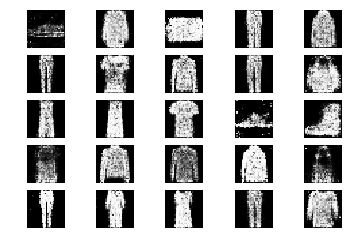

23401 [D loss: 0.590619, acc.: 70.31%] [G loss: 0.840026]
23402 [D loss: 0.621727, acc.: 67.19%] [G loss: 0.833171]
23403 [D loss: 0.622092, acc.: 68.75%] [G loss: 0.881687]
23404 [D loss: 0.636130, acc.: 65.62%] [G loss: 0.823425]
23405 [D loss: 0.623621, acc.: 64.06%] [G loss: 0.987131]
23406 [D loss: 0.676287, acc.: 62.50%] [G loss: 0.899505]
23407 [D loss: 0.649725, acc.: 68.75%] [G loss: 0.953467]
23408 [D loss: 0.586523, acc.: 67.19%] [G loss: 0.944605]
23409 [D loss: 0.661879, acc.: 56.25%] [G loss: 0.957856]
23410 [D loss: 0.632610, acc.: 54.69%] [G loss: 1.012821]
23411 [D loss: 0.700060, acc.: 53.12%] [G loss: 0.883583]
23412 [D loss: 0.709047, acc.: 53.12%] [G loss: 0.863233]
23413 [D loss: 0.695459, acc.: 57.81%] [G loss: 0.917369]
23414 [D loss: 0.652967, acc.: 62.50%] [G loss: 0.920604]
23415 [D loss: 0.587916, acc.: 65.62%] [G loss: 0.961558]
23416 [D loss: 0.595524, acc.: 57.81%] [G loss: 0.920580]
23417 [D loss: 0.624312, acc.: 59.38%] [G loss: 0.911213]
23418 [D loss:

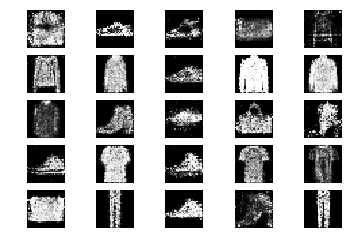

23601 [D loss: 0.635297, acc.: 59.38%] [G loss: 0.885220]
23602 [D loss: 0.676846, acc.: 54.69%] [G loss: 0.976244]
23603 [D loss: 0.678508, acc.: 59.38%] [G loss: 0.973850]
23604 [D loss: 0.602302, acc.: 64.06%] [G loss: 0.850514]
23605 [D loss: 0.602744, acc.: 70.31%] [G loss: 0.901117]
23606 [D loss: 0.667734, acc.: 57.81%] [G loss: 0.953696]
23607 [D loss: 0.607079, acc.: 73.44%] [G loss: 0.862020]
23608 [D loss: 0.746430, acc.: 51.56%] [G loss: 0.973543]
23609 [D loss: 0.674119, acc.: 60.94%] [G loss: 0.850746]
23610 [D loss: 0.638739, acc.: 64.06%] [G loss: 0.940591]
23611 [D loss: 0.620849, acc.: 71.88%] [G loss: 0.962400]
23612 [D loss: 0.670311, acc.: 59.38%] [G loss: 0.995258]
23613 [D loss: 0.688235, acc.: 57.81%] [G loss: 0.880472]
23614 [D loss: 0.662161, acc.: 57.81%] [G loss: 0.873097]
23615 [D loss: 0.671360, acc.: 56.25%] [G loss: 0.958538]
23616 [D loss: 0.677537, acc.: 62.50%] [G loss: 0.963167]
23617 [D loss: 0.698951, acc.: 57.81%] [G loss: 0.964182]
23618 [D loss:

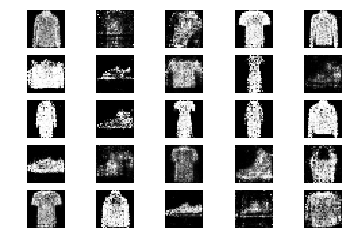

23801 [D loss: 0.698169, acc.: 50.00%] [G loss: 0.893881]
23802 [D loss: 0.718941, acc.: 51.56%] [G loss: 0.861110]
23803 [D loss: 0.607490, acc.: 62.50%] [G loss: 0.936377]
23804 [D loss: 0.548387, acc.: 71.88%] [G loss: 0.886148]
23805 [D loss: 0.670331, acc.: 59.38%] [G loss: 1.030244]
23806 [D loss: 0.691052, acc.: 54.69%] [G loss: 0.943321]
23807 [D loss: 0.709852, acc.: 54.69%] [G loss: 0.962017]
23808 [D loss: 0.670219, acc.: 56.25%] [G loss: 1.017442]
23809 [D loss: 0.614468, acc.: 64.06%] [G loss: 0.932571]
23810 [D loss: 0.635786, acc.: 54.69%] [G loss: 0.953375]
23811 [D loss: 0.806947, acc.: 54.69%] [G loss: 0.958155]
23812 [D loss: 0.632200, acc.: 60.94%] [G loss: 0.885872]
23813 [D loss: 0.650412, acc.: 57.81%] [G loss: 0.942081]
23814 [D loss: 0.645723, acc.: 62.50%] [G loss: 1.003471]
23815 [D loss: 0.610678, acc.: 65.62%] [G loss: 0.953527]
23816 [D loss: 0.628552, acc.: 59.38%] [G loss: 0.909127]
23817 [D loss: 0.654068, acc.: 64.06%] [G loss: 0.901377]
23818 [D loss:

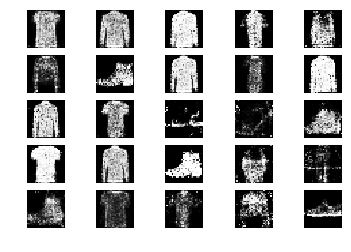

24001 [D loss: 0.647793, acc.: 57.81%] [G loss: 0.957681]
24002 [D loss: 0.692129, acc.: 57.81%] [G loss: 0.835050]
24003 [D loss: 0.592493, acc.: 68.75%] [G loss: 0.885374]
24004 [D loss: 0.665738, acc.: 57.81%] [G loss: 0.899112]
24005 [D loss: 0.657047, acc.: 64.06%] [G loss: 0.998170]
24006 [D loss: 0.714850, acc.: 59.38%] [G loss: 0.921311]
24007 [D loss: 0.635240, acc.: 62.50%] [G loss: 1.000665]
24008 [D loss: 0.661383, acc.: 60.94%] [G loss: 0.890707]
24009 [D loss: 0.656085, acc.: 57.81%] [G loss: 0.859066]
24010 [D loss: 0.650162, acc.: 62.50%] [G loss: 0.951750]
24011 [D loss: 0.685102, acc.: 54.69%] [G loss: 0.911745]
24012 [D loss: 0.681898, acc.: 51.56%] [G loss: 0.822267]
24013 [D loss: 0.664006, acc.: 64.06%] [G loss: 0.929569]
24014 [D loss: 0.702519, acc.: 51.56%] [G loss: 0.944361]
24015 [D loss: 0.600925, acc.: 71.88%] [G loss: 0.932302]
24016 [D loss: 0.660440, acc.: 57.81%] [G loss: 0.909366]
24017 [D loss: 0.671636, acc.: 59.38%] [G loss: 0.946392]
24018 [D loss:

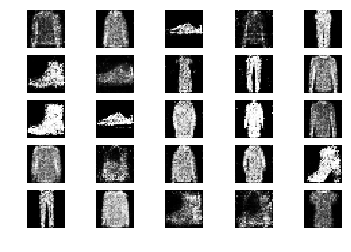

24201 [D loss: 0.629660, acc.: 64.06%] [G loss: 0.924598]
24202 [D loss: 0.635477, acc.: 64.06%] [G loss: 0.864573]
24203 [D loss: 0.649348, acc.: 65.62%] [G loss: 0.915123]
24204 [D loss: 0.681202, acc.: 54.69%] [G loss: 0.850496]
24205 [D loss: 0.637963, acc.: 60.94%] [G loss: 0.828278]
24206 [D loss: 0.678063, acc.: 54.69%] [G loss: 0.852784]
24207 [D loss: 0.619919, acc.: 60.94%] [G loss: 0.937810]
24208 [D loss: 0.696247, acc.: 56.25%] [G loss: 0.941930]
24209 [D loss: 0.596578, acc.: 76.56%] [G loss: 0.937722]
24210 [D loss: 0.680030, acc.: 56.25%] [G loss: 0.862517]
24211 [D loss: 0.663651, acc.: 60.94%] [G loss: 0.937369]
24212 [D loss: 0.667601, acc.: 65.62%] [G loss: 0.952935]
24213 [D loss: 0.648070, acc.: 56.25%] [G loss: 1.025196]
24214 [D loss: 0.639911, acc.: 56.25%] [G loss: 0.922670]
24215 [D loss: 0.668490, acc.: 62.50%] [G loss: 1.029598]
24216 [D loss: 0.614465, acc.: 62.50%] [G loss: 0.964887]
24217 [D loss: 0.672705, acc.: 60.94%] [G loss: 1.007807]
24218 [D loss:

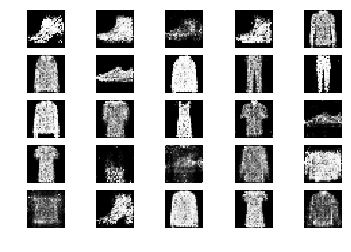

24401 [D loss: 0.687059, acc.: 60.94%] [G loss: 0.959695]
24402 [D loss: 0.585779, acc.: 70.31%] [G loss: 0.952845]
24403 [D loss: 0.636114, acc.: 60.94%] [G loss: 0.956662]
24404 [D loss: 0.622801, acc.: 64.06%] [G loss: 0.932478]
24405 [D loss: 0.647505, acc.: 65.62%] [G loss: 0.842195]
24406 [D loss: 0.585092, acc.: 71.88%] [G loss: 0.959773]
24407 [D loss: 0.564482, acc.: 71.88%] [G loss: 0.816297]
24408 [D loss: 0.673482, acc.: 57.81%] [G loss: 0.915816]
24409 [D loss: 0.641171, acc.: 68.75%] [G loss: 0.927542]
24410 [D loss: 0.682065, acc.: 57.81%] [G loss: 0.881422]
24411 [D loss: 0.600236, acc.: 67.19%] [G loss: 1.068303]
24412 [D loss: 0.665593, acc.: 65.62%] [G loss: 0.968672]
24413 [D loss: 0.618499, acc.: 65.62%] [G loss: 1.027959]
24414 [D loss: 0.620071, acc.: 65.62%] [G loss: 0.952523]
24415 [D loss: 0.655582, acc.: 62.50%] [G loss: 0.923894]
24416 [D loss: 0.674447, acc.: 57.81%] [G loss: 0.963453]
24417 [D loss: 0.661362, acc.: 56.25%] [G loss: 1.016203]
24418 [D loss:

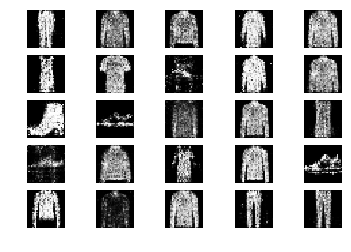

24601 [D loss: 0.600104, acc.: 65.62%] [G loss: 0.917385]
24602 [D loss: 0.590862, acc.: 67.19%] [G loss: 0.980543]
24603 [D loss: 0.656241, acc.: 60.94%] [G loss: 0.965630]
24604 [D loss: 0.620617, acc.: 59.38%] [G loss: 1.014464]
24605 [D loss: 0.599600, acc.: 70.31%] [G loss: 0.994267]
24606 [D loss: 0.605539, acc.: 71.88%] [G loss: 0.882511]
24607 [D loss: 0.626895, acc.: 67.19%] [G loss: 0.952021]
24608 [D loss: 0.697473, acc.: 54.69%] [G loss: 0.875760]
24609 [D loss: 0.641002, acc.: 64.06%] [G loss: 0.945400]
24610 [D loss: 0.643871, acc.: 64.06%] [G loss: 0.974327]
24611 [D loss: 0.631021, acc.: 65.62%] [G loss: 0.908347]
24612 [D loss: 0.631095, acc.: 67.19%] [G loss: 0.955291]
24613 [D loss: 0.636172, acc.: 60.94%] [G loss: 0.965820]
24614 [D loss: 0.646210, acc.: 64.06%] [G loss: 0.989834]
24615 [D loss: 0.642165, acc.: 65.62%] [G loss: 0.934598]
24616 [D loss: 0.652860, acc.: 59.38%] [G loss: 0.903111]
24617 [D loss: 0.628983, acc.: 59.38%] [G loss: 0.907187]
24618 [D loss:

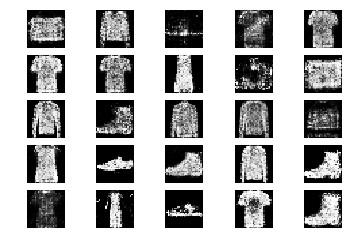

24801 [D loss: 0.653313, acc.: 67.19%] [G loss: 0.976526]
24802 [D loss: 0.612210, acc.: 67.19%] [G loss: 0.918232]
24803 [D loss: 0.557817, acc.: 71.88%] [G loss: 0.984486]
24804 [D loss: 0.586042, acc.: 71.88%] [G loss: 0.912974]
24805 [D loss: 0.583470, acc.: 59.38%] [G loss: 0.983173]
24806 [D loss: 0.658124, acc.: 60.94%] [G loss: 0.997670]
24807 [D loss: 0.687763, acc.: 59.38%] [G loss: 0.805961]
24808 [D loss: 0.653695, acc.: 57.81%] [G loss: 0.944724]
24809 [D loss: 0.625745, acc.: 64.06%] [G loss: 0.943145]
24810 [D loss: 0.645054, acc.: 56.25%] [G loss: 0.981574]
24811 [D loss: 0.606191, acc.: 59.38%] [G loss: 0.942327]
24812 [D loss: 0.708373, acc.: 60.94%] [G loss: 0.912100]
24813 [D loss: 0.691737, acc.: 56.25%] [G loss: 0.934733]
24814 [D loss: 0.584065, acc.: 68.75%] [G loss: 0.974687]
24815 [D loss: 0.597900, acc.: 68.75%] [G loss: 0.903616]
24816 [D loss: 0.653720, acc.: 65.62%] [G loss: 0.897291]
24817 [D loss: 0.687712, acc.: 53.12%] [G loss: 0.898611]
24818 [D loss:

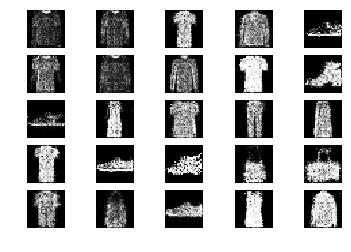

25001 [D loss: 0.556125, acc.: 79.69%] [G loss: 0.914514]
25002 [D loss: 0.651516, acc.: 59.38%] [G loss: 0.920141]
25003 [D loss: 0.658069, acc.: 56.25%] [G loss: 0.918215]
25004 [D loss: 0.623225, acc.: 68.75%] [G loss: 0.974394]
25005 [D loss: 0.627788, acc.: 65.62%] [G loss: 0.912067]
25006 [D loss: 0.552830, acc.: 73.44%] [G loss: 0.938493]
25007 [D loss: 0.666358, acc.: 56.25%] [G loss: 0.879498]
25008 [D loss: 0.701702, acc.: 51.56%] [G loss: 0.782129]
25009 [D loss: 0.705890, acc.: 56.25%] [G loss: 0.849725]
25010 [D loss: 0.662848, acc.: 62.50%] [G loss: 0.744840]
25011 [D loss: 0.692319, acc.: 56.25%] [G loss: 0.950255]
25012 [D loss: 0.728414, acc.: 45.31%] [G loss: 0.952731]
25013 [D loss: 0.672160, acc.: 62.50%] [G loss: 0.961309]
25014 [D loss: 0.630192, acc.: 64.06%] [G loss: 1.114315]
25015 [D loss: 0.658090, acc.: 62.50%] [G loss: 1.039449]
25016 [D loss: 0.632744, acc.: 57.81%] [G loss: 1.030116]
25017 [D loss: 0.681802, acc.: 48.44%] [G loss: 0.922545]
25018 [D loss:

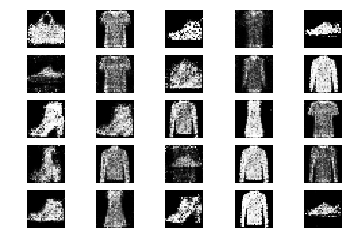

25201 [D loss: 0.618549, acc.: 59.38%] [G loss: 0.932820]
25202 [D loss: 0.616704, acc.: 64.06%] [G loss: 1.109978]
25203 [D loss: 0.668646, acc.: 62.50%] [G loss: 0.916915]
25204 [D loss: 0.654686, acc.: 57.81%] [G loss: 1.064962]
25205 [D loss: 0.630090, acc.: 59.38%] [G loss: 1.007438]
25206 [D loss: 0.692014, acc.: 62.50%] [G loss: 0.980060]
25207 [D loss: 0.643329, acc.: 67.19%] [G loss: 1.003544]
25208 [D loss: 0.655185, acc.: 62.50%] [G loss: 0.941524]
25209 [D loss: 0.684687, acc.: 56.25%] [G loss: 0.899084]
25210 [D loss: 0.546109, acc.: 73.44%] [G loss: 1.023121]
25211 [D loss: 0.631978, acc.: 62.50%] [G loss: 0.985024]
25212 [D loss: 0.650214, acc.: 57.81%] [G loss: 0.846577]
25213 [D loss: 0.641967, acc.: 64.06%] [G loss: 0.859171]
25214 [D loss: 0.674251, acc.: 57.81%] [G loss: 0.904685]
25215 [D loss: 0.617838, acc.: 68.75%] [G loss: 1.015811]
25216 [D loss: 0.584081, acc.: 64.06%] [G loss: 0.917851]
25217 [D loss: 0.605604, acc.: 75.00%] [G loss: 0.947659]
25218 [D loss:

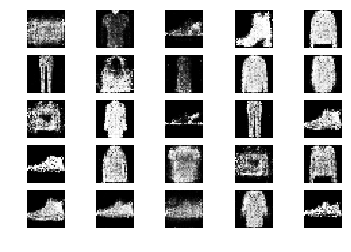

25401 [D loss: 0.670033, acc.: 56.25%] [G loss: 0.926771]
25402 [D loss: 0.633495, acc.: 60.94%] [G loss: 0.959793]
25403 [D loss: 0.644002, acc.: 65.62%] [G loss: 1.033766]
25404 [D loss: 0.612142, acc.: 60.94%] [G loss: 0.898759]
25405 [D loss: 0.674790, acc.: 65.62%] [G loss: 0.947830]
25406 [D loss: 0.656465, acc.: 60.94%] [G loss: 1.040159]
25407 [D loss: 0.681542, acc.: 54.69%] [G loss: 1.039675]
25408 [D loss: 0.629886, acc.: 65.62%] [G loss: 0.954727]
25409 [D loss: 0.623462, acc.: 65.62%] [G loss: 0.888259]
25410 [D loss: 0.617280, acc.: 65.62%] [G loss: 1.034010]
25411 [D loss: 0.682493, acc.: 60.94%] [G loss: 0.934780]
25412 [D loss: 0.700183, acc.: 53.12%] [G loss: 0.935328]
25413 [D loss: 0.598687, acc.: 67.19%] [G loss: 0.972138]
25414 [D loss: 0.711593, acc.: 48.44%] [G loss: 0.798163]
25415 [D loss: 0.596511, acc.: 65.62%] [G loss: 0.832925]
25416 [D loss: 0.605061, acc.: 73.44%] [G loss: 0.916613]
25417 [D loss: 0.635991, acc.: 67.19%] [G loss: 0.961646]
25418 [D loss:

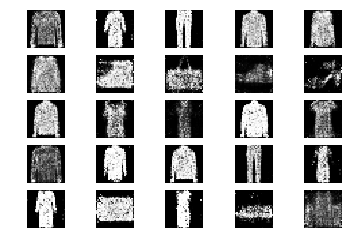

25601 [D loss: 0.623272, acc.: 64.06%] [G loss: 0.831295]
25602 [D loss: 0.625767, acc.: 64.06%] [G loss: 0.907292]
25603 [D loss: 0.582839, acc.: 67.19%] [G loss: 0.952728]
25604 [D loss: 0.632077, acc.: 65.62%] [G loss: 0.873840]
25605 [D loss: 0.740389, acc.: 53.12%] [G loss: 1.028572]
25606 [D loss: 0.665277, acc.: 54.69%] [G loss: 0.993904]
25607 [D loss: 0.651527, acc.: 64.06%] [G loss: 0.976851]
25608 [D loss: 0.661343, acc.: 57.81%] [G loss: 0.927010]
25609 [D loss: 0.751616, acc.: 54.69%] [G loss: 0.900424]
25610 [D loss: 0.646370, acc.: 64.06%] [G loss: 0.911771]
25611 [D loss: 0.605981, acc.: 67.19%] [G loss: 0.974229]
25612 [D loss: 0.605598, acc.: 67.19%] [G loss: 0.923800]
25613 [D loss: 0.625930, acc.: 59.38%] [G loss: 0.935825]
25614 [D loss: 0.696520, acc.: 51.56%] [G loss: 0.832646]
25615 [D loss: 0.685824, acc.: 59.38%] [G loss: 0.882396]
25616 [D loss: 0.578864, acc.: 70.31%] [G loss: 1.012194]
25617 [D loss: 0.640673, acc.: 56.25%] [G loss: 0.967484]
25618 [D loss:

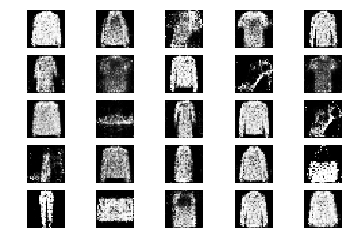

25801 [D loss: 0.622204, acc.: 71.88%] [G loss: 0.815518]
25802 [D loss: 0.569890, acc.: 71.88%] [G loss: 0.935843]
25803 [D loss: 0.634072, acc.: 60.94%] [G loss: 0.973647]
25804 [D loss: 0.565704, acc.: 76.56%] [G loss: 0.907941]
25805 [D loss: 0.633402, acc.: 68.75%] [G loss: 0.915943]
25806 [D loss: 0.635848, acc.: 62.50%] [G loss: 0.993115]
25807 [D loss: 0.626682, acc.: 62.50%] [G loss: 0.974992]
25808 [D loss: 0.675057, acc.: 57.81%] [G loss: 0.971166]
25809 [D loss: 0.540793, acc.: 75.00%] [G loss: 0.972614]
25810 [D loss: 0.629250, acc.: 62.50%] [G loss: 1.038942]
25811 [D loss: 0.630631, acc.: 62.50%] [G loss: 1.014154]
25812 [D loss: 0.706999, acc.: 53.12%] [G loss: 1.061977]
25813 [D loss: 0.603555, acc.: 67.19%] [G loss: 0.968129]
25814 [D loss: 0.668301, acc.: 60.94%] [G loss: 0.919086]
25815 [D loss: 0.604049, acc.: 68.75%] [G loss: 0.994674]
25816 [D loss: 0.719083, acc.: 48.44%] [G loss: 0.894036]
25817 [D loss: 0.607324, acc.: 70.31%] [G loss: 0.876447]
25818 [D loss:

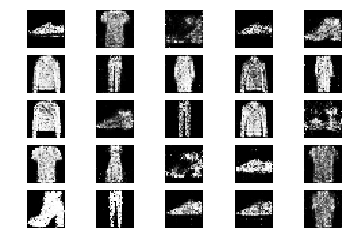

26001 [D loss: 0.592933, acc.: 68.75%] [G loss: 1.112358]
26002 [D loss: 0.565616, acc.: 75.00%] [G loss: 0.998737]
26003 [D loss: 0.681048, acc.: 54.69%] [G loss: 0.914334]
26004 [D loss: 0.674531, acc.: 62.50%] [G loss: 0.864547]
26005 [D loss: 0.625243, acc.: 57.81%] [G loss: 0.909341]
26006 [D loss: 0.591252, acc.: 64.06%] [G loss: 0.948601]
26007 [D loss: 0.632983, acc.: 64.06%] [G loss: 0.888874]
26008 [D loss: 0.636718, acc.: 67.19%] [G loss: 0.951956]
26009 [D loss: 0.718031, acc.: 56.25%] [G loss: 0.978237]
26010 [D loss: 0.651853, acc.: 56.25%] [G loss: 0.985915]
26011 [D loss: 0.639661, acc.: 62.50%] [G loss: 0.984882]
26012 [D loss: 0.611032, acc.: 68.75%] [G loss: 0.957908]
26013 [D loss: 0.580967, acc.: 71.88%] [G loss: 0.907079]
26014 [D loss: 0.593208, acc.: 65.62%] [G loss: 1.003220]
26015 [D loss: 0.612282, acc.: 68.75%] [G loss: 0.979555]
26016 [D loss: 0.621120, acc.: 62.50%] [G loss: 0.937197]
26017 [D loss: 0.641418, acc.: 60.94%] [G loss: 0.957390]
26018 [D loss:

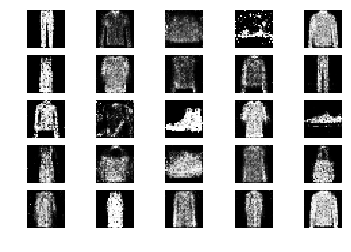

26201 [D loss: 0.614333, acc.: 67.19%] [G loss: 1.066912]
26202 [D loss: 0.663320, acc.: 60.94%] [G loss: 0.916855]
26203 [D loss: 0.690255, acc.: 53.12%] [G loss: 0.942333]
26204 [D loss: 0.639448, acc.: 71.88%] [G loss: 0.908410]
26205 [D loss: 0.651214, acc.: 64.06%] [G loss: 0.944622]
26206 [D loss: 0.699602, acc.: 57.81%] [G loss: 0.983930]
26207 [D loss: 0.620512, acc.: 65.62%] [G loss: 0.779349]
26208 [D loss: 0.612275, acc.: 62.50%] [G loss: 0.858702]
26209 [D loss: 0.640620, acc.: 59.38%] [G loss: 0.858666]
26210 [D loss: 0.583789, acc.: 73.44%] [G loss: 0.935495]
26211 [D loss: 0.639242, acc.: 60.94%] [G loss: 1.035328]
26212 [D loss: 0.627795, acc.: 62.50%] [G loss: 0.879221]
26213 [D loss: 0.616657, acc.: 70.31%] [G loss: 0.930211]
26214 [D loss: 0.618116, acc.: 62.50%] [G loss: 1.024360]
26215 [D loss: 0.664595, acc.: 54.69%] [G loss: 0.991294]
26216 [D loss: 0.610969, acc.: 65.62%] [G loss: 0.992267]
26217 [D loss: 0.614711, acc.: 67.19%] [G loss: 0.977349]
26218 [D loss:

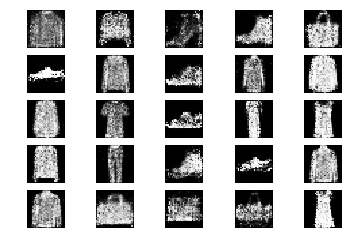

26401 [D loss: 0.663882, acc.: 54.69%] [G loss: 0.951753]
26402 [D loss: 0.630124, acc.: 65.62%] [G loss: 1.002337]
26403 [D loss: 0.667483, acc.: 62.50%] [G loss: 0.895533]
26404 [D loss: 0.684028, acc.: 56.25%] [G loss: 0.901181]
26405 [D loss: 0.589206, acc.: 73.44%] [G loss: 0.922196]
26406 [D loss: 0.609778, acc.: 67.19%] [G loss: 0.900628]
26407 [D loss: 0.685830, acc.: 57.81%] [G loss: 0.954323]
26408 [D loss: 0.652932, acc.: 62.50%] [G loss: 0.984360]
26409 [D loss: 0.590488, acc.: 70.31%] [G loss: 0.954324]
26410 [D loss: 0.687467, acc.: 51.56%] [G loss: 0.911172]
26411 [D loss: 0.667516, acc.: 59.38%] [G loss: 0.963538]
26412 [D loss: 0.666503, acc.: 65.62%] [G loss: 0.946594]
26413 [D loss: 0.639423, acc.: 70.31%] [G loss: 0.978470]
26414 [D loss: 0.756026, acc.: 51.56%] [G loss: 0.903904]
26415 [D loss: 0.623021, acc.: 70.31%] [G loss: 0.925886]
26416 [D loss: 0.639050, acc.: 60.94%] [G loss: 0.935730]
26417 [D loss: 0.653898, acc.: 60.94%] [G loss: 0.911937]
26418 [D loss:

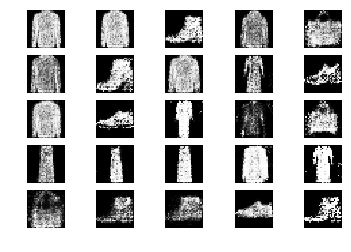

26601 [D loss: 0.618988, acc.: 68.75%] [G loss: 0.979973]
26602 [D loss: 0.640186, acc.: 65.62%] [G loss: 0.907376]
26603 [D loss: 0.607496, acc.: 68.75%] [G loss: 0.988422]
26604 [D loss: 0.602397, acc.: 65.62%] [G loss: 0.970046]
26605 [D loss: 0.689134, acc.: 50.00%] [G loss: 0.993202]
26606 [D loss: 0.651550, acc.: 62.50%] [G loss: 0.953228]
26607 [D loss: 0.655123, acc.: 57.81%] [G loss: 0.912462]
26608 [D loss: 0.627465, acc.: 73.44%] [G loss: 1.019835]
26609 [D loss: 0.636583, acc.: 67.19%] [G loss: 0.984498]
26610 [D loss: 0.696377, acc.: 57.81%] [G loss: 0.875200]
26611 [D loss: 0.654967, acc.: 65.62%] [G loss: 0.984435]
26612 [D loss: 0.613753, acc.: 67.19%] [G loss: 1.090677]
26613 [D loss: 0.612525, acc.: 68.75%] [G loss: 0.931560]
26614 [D loss: 0.629154, acc.: 64.06%] [G loss: 0.950080]
26615 [D loss: 0.652853, acc.: 64.06%] [G loss: 0.961013]
26616 [D loss: 0.670938, acc.: 60.94%] [G loss: 0.850647]
26617 [D loss: 0.597105, acc.: 67.19%] [G loss: 0.915544]
26618 [D loss:

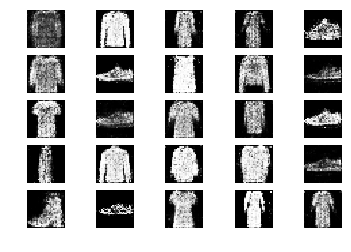

26801 [D loss: 0.573496, acc.: 68.75%] [G loss: 0.876368]
26802 [D loss: 0.692872, acc.: 46.88%] [G loss: 0.821090]
26803 [D loss: 0.595920, acc.: 68.75%] [G loss: 0.887305]
26804 [D loss: 0.668087, acc.: 60.94%] [G loss: 0.912178]
26805 [D loss: 0.594881, acc.: 67.19%] [G loss: 0.842729]
26806 [D loss: 0.572801, acc.: 76.56%] [G loss: 0.929091]
26807 [D loss: 0.644237, acc.: 57.81%] [G loss: 0.942916]
26808 [D loss: 0.647518, acc.: 59.38%] [G loss: 0.839148]
26809 [D loss: 0.614708, acc.: 57.81%] [G loss: 0.892296]
26810 [D loss: 0.533884, acc.: 71.88%] [G loss: 0.936909]
26811 [D loss: 0.622586, acc.: 67.19%] [G loss: 0.982374]
26812 [D loss: 0.681431, acc.: 50.00%] [G loss: 0.892005]
26813 [D loss: 0.674193, acc.: 60.94%] [G loss: 0.929920]
26814 [D loss: 0.612382, acc.: 62.50%] [G loss: 0.894460]
26815 [D loss: 0.706196, acc.: 54.69%] [G loss: 0.934895]
26816 [D loss: 0.679498, acc.: 56.25%] [G loss: 0.847610]
26817 [D loss: 0.646270, acc.: 62.50%] [G loss: 0.916358]
26818 [D loss:

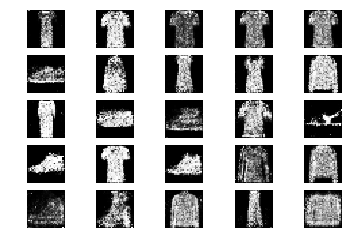

27001 [D loss: 0.612927, acc.: 65.62%] [G loss: 0.908762]
27002 [D loss: 0.647512, acc.: 56.25%] [G loss: 0.932387]
27003 [D loss: 0.679809, acc.: 56.25%] [G loss: 1.050429]
27004 [D loss: 0.606020, acc.: 68.75%] [G loss: 0.916684]
27005 [D loss: 0.612646, acc.: 68.75%] [G loss: 0.916887]
27006 [D loss: 0.585022, acc.: 73.44%] [G loss: 0.776460]
27007 [D loss: 0.525053, acc.: 79.69%] [G loss: 0.931176]
27008 [D loss: 0.685484, acc.: 57.81%] [G loss: 0.931216]
27009 [D loss: 0.649851, acc.: 60.94%] [G loss: 0.906205]
27010 [D loss: 0.612131, acc.: 64.06%] [G loss: 0.875242]
27011 [D loss: 0.686910, acc.: 56.25%] [G loss: 0.894772]
27012 [D loss: 0.655552, acc.: 64.06%] [G loss: 0.945609]
27013 [D loss: 0.725417, acc.: 60.94%] [G loss: 0.951930]
27014 [D loss: 0.570424, acc.: 73.44%] [G loss: 0.932466]
27015 [D loss: 0.692520, acc.: 57.81%] [G loss: 0.931879]
27016 [D loss: 0.587107, acc.: 73.44%] [G loss: 0.944632]
27017 [D loss: 0.632612, acc.: 68.75%] [G loss: 0.959804]
27018 [D loss:

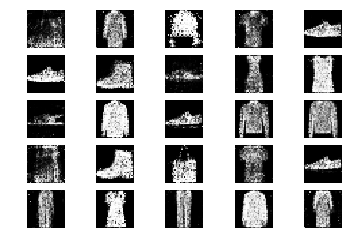

27201 [D loss: 0.643408, acc.: 64.06%] [G loss: 0.970265]
27202 [D loss: 0.694723, acc.: 50.00%] [G loss: 0.997928]
27203 [D loss: 0.734299, acc.: 54.69%] [G loss: 0.904279]
27204 [D loss: 0.647477, acc.: 67.19%] [G loss: 0.975939]
27205 [D loss: 0.641935, acc.: 57.81%] [G loss: 0.984679]
27206 [D loss: 0.655646, acc.: 57.81%] [G loss: 0.979280]
27207 [D loss: 0.662377, acc.: 56.25%] [G loss: 0.944015]
27208 [D loss: 0.679077, acc.: 62.50%] [G loss: 0.933449]
27209 [D loss: 0.637579, acc.: 59.38%] [G loss: 0.892675]
27210 [D loss: 0.627528, acc.: 67.19%] [G loss: 0.945339]
27211 [D loss: 0.682619, acc.: 54.69%] [G loss: 0.914165]
27212 [D loss: 0.577937, acc.: 71.88%] [G loss: 0.974160]
27213 [D loss: 0.585531, acc.: 75.00%] [G loss: 0.916729]
27214 [D loss: 0.662789, acc.: 59.38%] [G loss: 1.016541]
27215 [D loss: 0.614633, acc.: 71.88%] [G loss: 1.070478]
27216 [D loss: 0.674873, acc.: 54.69%] [G loss: 0.942909]
27217 [D loss: 0.614461, acc.: 62.50%] [G loss: 1.028068]
27218 [D loss:

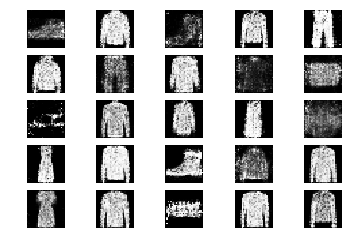

27401 [D loss: 0.662170, acc.: 56.25%] [G loss: 0.902507]
27402 [D loss: 0.699201, acc.: 54.69%] [G loss: 0.985167]
27403 [D loss: 0.572407, acc.: 78.12%] [G loss: 1.032045]
27404 [D loss: 0.684207, acc.: 59.38%] [G loss: 0.860891]
27405 [D loss: 0.684570, acc.: 57.81%] [G loss: 0.873597]
27406 [D loss: 0.622344, acc.: 60.94%] [G loss: 0.973152]
27407 [D loss: 0.648660, acc.: 60.94%] [G loss: 1.048798]
27408 [D loss: 0.607355, acc.: 70.31%] [G loss: 1.015544]
27409 [D loss: 0.566870, acc.: 73.44%] [G loss: 0.879196]
27410 [D loss: 0.642203, acc.: 62.50%] [G loss: 0.964807]
27411 [D loss: 0.712559, acc.: 48.44%] [G loss: 0.974774]
27412 [D loss: 0.651660, acc.: 60.94%] [G loss: 0.920880]
27413 [D loss: 0.721557, acc.: 48.44%] [G loss: 0.823847]
27414 [D loss: 0.618168, acc.: 60.94%] [G loss: 0.984300]
27415 [D loss: 0.593748, acc.: 73.44%] [G loss: 0.923592]
27416 [D loss: 0.652934, acc.: 57.81%] [G loss: 0.930736]
27417 [D loss: 0.611369, acc.: 68.75%] [G loss: 1.003056]
27418 [D loss:

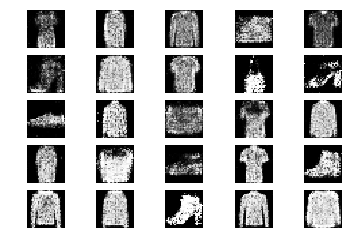

27601 [D loss: 0.560296, acc.: 71.88%] [G loss: 1.009981]
27602 [D loss: 0.680737, acc.: 56.25%] [G loss: 0.991117]
27603 [D loss: 0.657407, acc.: 60.94%] [G loss: 0.904486]
27604 [D loss: 0.598169, acc.: 71.88%] [G loss: 0.946463]
27605 [D loss: 0.639878, acc.: 64.06%] [G loss: 0.892452]
27606 [D loss: 0.654465, acc.: 64.06%] [G loss: 1.000557]
27607 [D loss: 0.667828, acc.: 67.19%] [G loss: 0.814292]
27608 [D loss: 0.612853, acc.: 65.62%] [G loss: 0.950792]
27609 [D loss: 0.726558, acc.: 57.81%] [G loss: 0.882136]
27610 [D loss: 0.629235, acc.: 64.06%] [G loss: 1.029008]
27611 [D loss: 0.581095, acc.: 70.31%] [G loss: 1.090289]
27612 [D loss: 0.703411, acc.: 56.25%] [G loss: 0.935482]
27613 [D loss: 0.646460, acc.: 60.94%] [G loss: 0.944300]
27614 [D loss: 0.719528, acc.: 53.12%] [G loss: 0.957611]
27615 [D loss: 0.597327, acc.: 70.31%] [G loss: 1.073177]
27616 [D loss: 0.609796, acc.: 71.88%] [G loss: 1.025591]
27617 [D loss: 0.642860, acc.: 64.06%] [G loss: 0.926427]
27618 [D loss:

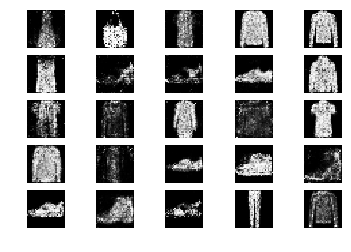

27801 [D loss: 0.681111, acc.: 60.94%] [G loss: 1.032325]
27802 [D loss: 0.676982, acc.: 57.81%] [G loss: 1.011693]
27803 [D loss: 0.618968, acc.: 57.81%] [G loss: 0.900153]
27804 [D loss: 0.610011, acc.: 65.62%] [G loss: 0.883921]
27805 [D loss: 0.688395, acc.: 48.44%] [G loss: 1.013040]
27806 [D loss: 0.647773, acc.: 54.69%] [G loss: 0.924950]
27807 [D loss: 0.664773, acc.: 59.38%] [G loss: 0.988163]
27808 [D loss: 0.577690, acc.: 70.31%] [G loss: 0.876825]
27809 [D loss: 0.703239, acc.: 54.69%] [G loss: 0.969333]
27810 [D loss: 0.781346, acc.: 43.75%] [G loss: 0.906318]
27811 [D loss: 0.693929, acc.: 51.56%] [G loss: 0.927409]
27812 [D loss: 0.606054, acc.: 64.06%] [G loss: 1.015929]
27813 [D loss: 0.624451, acc.: 65.62%] [G loss: 1.012013]
27814 [D loss: 0.631040, acc.: 64.06%] [G loss: 0.938889]
27815 [D loss: 0.674652, acc.: 54.69%] [G loss: 0.958351]
27816 [D loss: 0.694958, acc.: 54.69%] [G loss: 0.938600]
27817 [D loss: 0.673064, acc.: 64.06%] [G loss: 0.911222]
27818 [D loss:

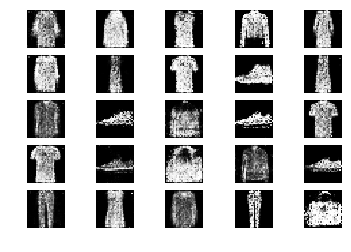

28001 [D loss: 0.578037, acc.: 70.31%] [G loss: 0.930338]
28002 [D loss: 0.612083, acc.: 64.06%] [G loss: 0.961568]
28003 [D loss: 0.608558, acc.: 65.62%] [G loss: 0.933036]
28004 [D loss: 0.715379, acc.: 54.69%] [G loss: 0.861378]
28005 [D loss: 0.669227, acc.: 50.00%] [G loss: 1.033593]
28006 [D loss: 0.593224, acc.: 71.88%] [G loss: 1.020118]
28007 [D loss: 0.650285, acc.: 54.69%] [G loss: 0.910036]
28008 [D loss: 0.684722, acc.: 65.62%] [G loss: 0.985310]
28009 [D loss: 0.592666, acc.: 70.31%] [G loss: 0.950361]
28010 [D loss: 0.643944, acc.: 67.19%] [G loss: 0.993993]
28011 [D loss: 0.630362, acc.: 62.50%] [G loss: 1.042650]
28012 [D loss: 0.615471, acc.: 67.19%] [G loss: 1.058511]
28013 [D loss: 0.701810, acc.: 54.69%] [G loss: 0.904839]
28014 [D loss: 0.612634, acc.: 67.19%] [G loss: 0.999123]
28015 [D loss: 0.647990, acc.: 62.50%] [G loss: 0.863870]
28016 [D loss: 0.723186, acc.: 51.56%] [G loss: 0.877273]
28017 [D loss: 0.644765, acc.: 60.94%] [G loss: 0.926578]
28018 [D loss:

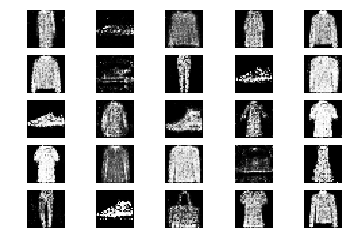

28201 [D loss: 0.565969, acc.: 68.75%] [G loss: 0.936296]
28202 [D loss: 0.600219, acc.: 68.75%] [G loss: 0.914638]
28203 [D loss: 0.659540, acc.: 60.94%] [G loss: 0.954863]
28204 [D loss: 0.595191, acc.: 67.19%] [G loss: 0.952599]
28205 [D loss: 0.653565, acc.: 60.94%] [G loss: 1.020887]
28206 [D loss: 0.647120, acc.: 64.06%] [G loss: 1.111391]
28207 [D loss: 0.668062, acc.: 54.69%] [G loss: 1.055025]
28208 [D loss: 0.652635, acc.: 65.62%] [G loss: 1.068216]
28209 [D loss: 0.618831, acc.: 64.06%] [G loss: 0.952957]
28210 [D loss: 0.708307, acc.: 50.00%] [G loss: 1.005470]
28211 [D loss: 0.641451, acc.: 67.19%] [G loss: 0.892451]
28212 [D loss: 0.601707, acc.: 73.44%] [G loss: 0.981848]
28213 [D loss: 0.631941, acc.: 67.19%] [G loss: 0.989490]
28214 [D loss: 0.669395, acc.: 67.19%] [G loss: 0.949448]
28215 [D loss: 0.640979, acc.: 60.94%] [G loss: 0.972603]
28216 [D loss: 0.572518, acc.: 68.75%] [G loss: 1.024534]
28217 [D loss: 0.649412, acc.: 62.50%] [G loss: 0.988178]
28218 [D loss:

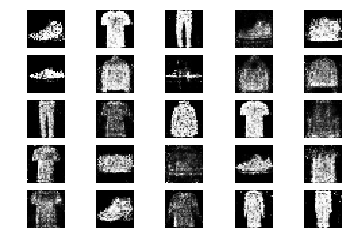

28401 [D loss: 0.611964, acc.: 57.81%] [G loss: 1.015805]
28402 [D loss: 0.620837, acc.: 67.19%] [G loss: 1.023764]
28403 [D loss: 0.663333, acc.: 54.69%] [G loss: 0.923380]
28404 [D loss: 0.617199, acc.: 65.62%] [G loss: 0.974409]
28405 [D loss: 0.612505, acc.: 70.31%] [G loss: 1.007859]
28406 [D loss: 0.660249, acc.: 57.81%] [G loss: 0.925709]
28407 [D loss: 0.636184, acc.: 59.38%] [G loss: 0.922413]
28408 [D loss: 0.618536, acc.: 62.50%] [G loss: 1.004143]
28409 [D loss: 0.683768, acc.: 60.94%] [G loss: 1.016197]
28410 [D loss: 0.583093, acc.: 70.31%] [G loss: 0.993856]
28411 [D loss: 0.656592, acc.: 64.06%] [G loss: 0.961968]
28412 [D loss: 0.590761, acc.: 73.44%] [G loss: 1.073467]
28413 [D loss: 0.665650, acc.: 56.25%] [G loss: 1.053995]
28414 [D loss: 0.648727, acc.: 64.06%] [G loss: 0.992621]
28415 [D loss: 0.624518, acc.: 60.94%] [G loss: 0.951878]
28416 [D loss: 0.653807, acc.: 60.94%] [G loss: 0.971257]
28417 [D loss: 0.614964, acc.: 62.50%] [G loss: 1.039375]
28418 [D loss:

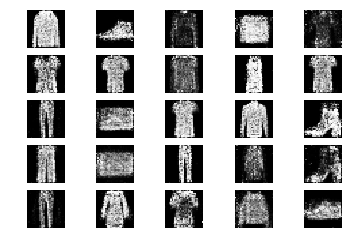

28601 [D loss: 0.693531, acc.: 51.56%] [G loss: 0.871953]
28602 [D loss: 0.607534, acc.: 70.31%] [G loss: 1.036413]
28603 [D loss: 0.675340, acc.: 56.25%] [G loss: 0.825117]
28604 [D loss: 0.641259, acc.: 67.19%] [G loss: 0.841502]
28605 [D loss: 0.667163, acc.: 60.94%] [G loss: 0.930800]
28606 [D loss: 0.664524, acc.: 60.94%] [G loss: 0.879627]
28607 [D loss: 0.621789, acc.: 67.19%] [G loss: 0.921699]
28608 [D loss: 0.622468, acc.: 60.94%] [G loss: 0.951265]
28609 [D loss: 0.635654, acc.: 60.94%] [G loss: 0.952078]
28610 [D loss: 0.631762, acc.: 60.94%] [G loss: 0.967101]
28611 [D loss: 0.592771, acc.: 67.19%] [G loss: 0.924984]
28612 [D loss: 0.645530, acc.: 62.50%] [G loss: 0.962410]
28613 [D loss: 0.603649, acc.: 71.88%] [G loss: 1.025100]
28614 [D loss: 0.599958, acc.: 70.31%] [G loss: 0.915368]
28615 [D loss: 0.679446, acc.: 64.06%] [G loss: 0.944264]
28616 [D loss: 0.576757, acc.: 67.19%] [G loss: 0.969420]
28617 [D loss: 0.654787, acc.: 59.38%] [G loss: 0.969655]
28618 [D loss:

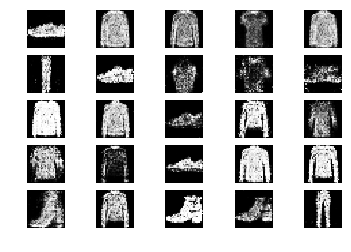

28801 [D loss: 0.667368, acc.: 65.62%] [G loss: 0.842977]
28802 [D loss: 0.706381, acc.: 53.12%] [G loss: 0.936709]
28803 [D loss: 0.641906, acc.: 65.62%] [G loss: 0.923402]
28804 [D loss: 0.545675, acc.: 71.88%] [G loss: 0.922493]
28805 [D loss: 0.620890, acc.: 68.75%] [G loss: 0.901595]
28806 [D loss: 0.619920, acc.: 62.50%] [G loss: 0.895105]
28807 [D loss: 0.647113, acc.: 54.69%] [G loss: 0.940736]
28808 [D loss: 0.619653, acc.: 65.62%] [G loss: 0.981006]
28809 [D loss: 0.641481, acc.: 65.62%] [G loss: 0.945428]
28810 [D loss: 0.679341, acc.: 59.38%] [G loss: 1.000662]
28811 [D loss: 0.587915, acc.: 71.88%] [G loss: 0.927428]
28812 [D loss: 0.624275, acc.: 59.38%] [G loss: 0.924339]
28813 [D loss: 0.636904, acc.: 60.94%] [G loss: 0.956909]
28814 [D loss: 0.627578, acc.: 73.44%] [G loss: 1.036375]
28815 [D loss: 0.573387, acc.: 68.75%] [G loss: 0.913606]
28816 [D loss: 0.627002, acc.: 71.88%] [G loss: 0.881401]
28817 [D loss: 0.581541, acc.: 67.19%] [G loss: 1.008374]
28818 [D loss:

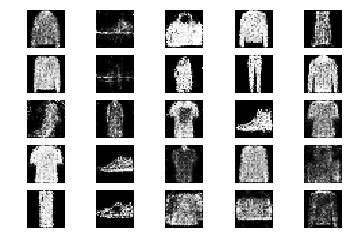

29001 [D loss: 0.635227, acc.: 68.75%] [G loss: 0.987518]
29002 [D loss: 0.588158, acc.: 73.44%] [G loss: 0.984960]
29003 [D loss: 0.610443, acc.: 68.75%] [G loss: 0.996667]
29004 [D loss: 0.612597, acc.: 60.94%] [G loss: 0.837540]
29005 [D loss: 0.689500, acc.: 54.69%] [G loss: 0.947027]
29006 [D loss: 0.610446, acc.: 62.50%] [G loss: 0.941700]
29007 [D loss: 0.613797, acc.: 68.75%] [G loss: 0.889848]
29008 [D loss: 0.606731, acc.: 68.75%] [G loss: 1.018199]
29009 [D loss: 0.580131, acc.: 75.00%] [G loss: 0.882187]
29010 [D loss: 0.691452, acc.: 59.38%] [G loss: 1.034131]
29011 [D loss: 0.622993, acc.: 68.75%] [G loss: 0.883027]
29012 [D loss: 0.614470, acc.: 60.94%] [G loss: 0.975559]
29013 [D loss: 0.605132, acc.: 68.75%] [G loss: 1.007282]
29014 [D loss: 0.677422, acc.: 54.69%] [G loss: 0.905635]
29015 [D loss: 0.589316, acc.: 73.44%] [G loss: 0.991085]
29016 [D loss: 0.657674, acc.: 60.94%] [G loss: 1.095316]
29017 [D loss: 0.594042, acc.: 73.44%] [G loss: 0.990379]
29018 [D loss:

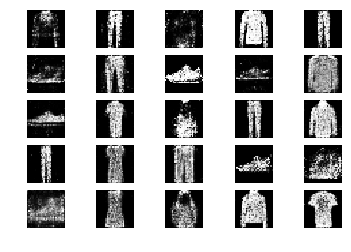

29201 [D loss: 0.624832, acc.: 62.50%] [G loss: 0.950549]
29202 [D loss: 0.636846, acc.: 65.62%] [G loss: 0.974747]
29203 [D loss: 0.607346, acc.: 71.88%] [G loss: 0.991873]
29204 [D loss: 0.687487, acc.: 56.25%] [G loss: 0.911655]
29205 [D loss: 0.596293, acc.: 70.31%] [G loss: 0.970092]
29206 [D loss: 0.630329, acc.: 59.38%] [G loss: 0.986665]
29207 [D loss: 0.613112, acc.: 71.88%] [G loss: 0.995143]
29208 [D loss: 0.649683, acc.: 65.62%] [G loss: 0.977668]
29209 [D loss: 0.679417, acc.: 57.81%] [G loss: 0.933960]
29210 [D loss: 0.662345, acc.: 57.81%] [G loss: 0.977889]
29211 [D loss: 0.688997, acc.: 59.38%] [G loss: 0.925654]
29212 [D loss: 0.650469, acc.: 60.94%] [G loss: 0.868345]
29213 [D loss: 0.578366, acc.: 70.31%] [G loss: 0.934124]
29214 [D loss: 0.672660, acc.: 57.81%] [G loss: 1.000799]
29215 [D loss: 0.635855, acc.: 60.94%] [G loss: 0.979410]
29216 [D loss: 0.623999, acc.: 68.75%] [G loss: 0.939785]
29217 [D loss: 0.665939, acc.: 64.06%] [G loss: 0.941913]
29218 [D loss:

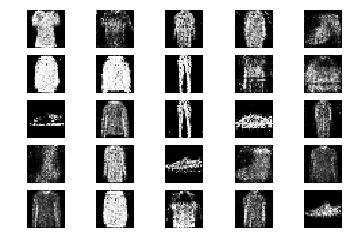

29401 [D loss: 0.597160, acc.: 68.75%] [G loss: 0.958574]
29402 [D loss: 0.614056, acc.: 62.50%] [G loss: 0.960492]
29403 [D loss: 0.598354, acc.: 67.19%] [G loss: 0.953223]
29404 [D loss: 0.646461, acc.: 59.38%] [G loss: 0.946176]
29405 [D loss: 0.667289, acc.: 67.19%] [G loss: 0.928581]
29406 [D loss: 0.709007, acc.: 50.00%] [G loss: 0.979905]
29407 [D loss: 0.638754, acc.: 59.38%] [G loss: 1.019686]
29408 [D loss: 0.573754, acc.: 79.69%] [G loss: 0.932115]
29409 [D loss: 0.673679, acc.: 62.50%] [G loss: 0.903930]
29410 [D loss: 0.659658, acc.: 70.31%] [G loss: 0.937765]
29411 [D loss: 0.627487, acc.: 65.62%] [G loss: 0.936226]
29412 [D loss: 0.614292, acc.: 65.62%] [G loss: 1.060045]
29413 [D loss: 0.642606, acc.: 62.50%] [G loss: 0.904749]
29414 [D loss: 0.683704, acc.: 54.69%] [G loss: 0.998647]
29415 [D loss: 0.620290, acc.: 68.75%] [G loss: 0.836410]
29416 [D loss: 0.606480, acc.: 68.75%] [G loss: 0.940312]
29417 [D loss: 0.651297, acc.: 60.94%] [G loss: 0.994363]
29418 [D loss:

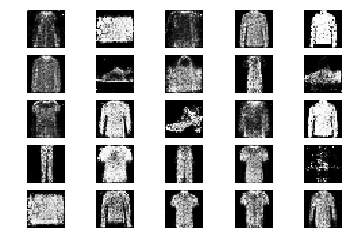

29601 [D loss: 0.590403, acc.: 71.88%] [G loss: 0.894786]
29602 [D loss: 0.676254, acc.: 50.00%] [G loss: 0.888873]
29603 [D loss: 0.571788, acc.: 68.75%] [G loss: 0.961792]
29604 [D loss: 0.683365, acc.: 56.25%] [G loss: 0.881321]
29605 [D loss: 0.644635, acc.: 59.38%] [G loss: 1.067705]
29606 [D loss: 0.604782, acc.: 73.44%] [G loss: 0.977143]
29607 [D loss: 0.670982, acc.: 57.81%] [G loss: 0.955150]
29608 [D loss: 0.663253, acc.: 62.50%] [G loss: 0.983013]
29609 [D loss: 0.625815, acc.: 71.88%] [G loss: 0.986174]
29610 [D loss: 0.580601, acc.: 73.44%] [G loss: 1.163961]
29611 [D loss: 0.676172, acc.: 64.06%] [G loss: 0.986630]
29612 [D loss: 0.654106, acc.: 62.50%] [G loss: 0.882029]
29613 [D loss: 0.687468, acc.: 59.38%] [G loss: 0.877072]
29614 [D loss: 0.666383, acc.: 65.62%] [G loss: 0.926311]
29615 [D loss: 0.606129, acc.: 62.50%] [G loss: 0.895386]
29616 [D loss: 0.645396, acc.: 60.94%] [G loss: 0.925396]
29617 [D loss: 0.560397, acc.: 73.44%] [G loss: 0.927445]
29618 [D loss:

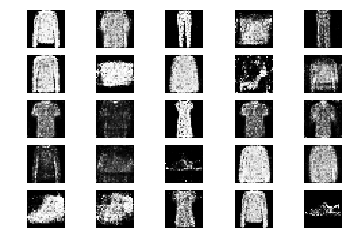

29801 [D loss: 0.699220, acc.: 53.12%] [G loss: 0.986545]
29802 [D loss: 0.655869, acc.: 59.38%] [G loss: 1.034688]
29803 [D loss: 0.546169, acc.: 65.62%] [G loss: 0.987062]
29804 [D loss: 0.684968, acc.: 54.69%] [G loss: 0.968543]
29805 [D loss: 0.557262, acc.: 73.44%] [G loss: 1.066721]
29806 [D loss: 0.648936, acc.: 62.50%] [G loss: 0.962303]
29807 [D loss: 0.658696, acc.: 57.81%] [G loss: 0.879046]
29808 [D loss: 0.594433, acc.: 75.00%] [G loss: 0.992518]
29809 [D loss: 0.640281, acc.: 59.38%] [G loss: 0.896409]
29810 [D loss: 0.766556, acc.: 46.88%] [G loss: 0.954003]
29811 [D loss: 0.611602, acc.: 67.19%] [G loss: 1.012712]
29812 [D loss: 0.640743, acc.: 64.06%] [G loss: 0.992162]
29813 [D loss: 0.583895, acc.: 73.44%] [G loss: 0.944184]
29814 [D loss: 0.658230, acc.: 59.38%] [G loss: 0.896955]
29815 [D loss: 0.598719, acc.: 65.62%] [G loss: 0.988405]
29816 [D loss: 0.631458, acc.: 62.50%] [G loss: 0.939864]
29817 [D loss: 0.647842, acc.: 59.38%] [G loss: 0.936187]
29818 [D loss:

In [3]:
gan = GAN()
gan.train(epochs=30000, batch_size=32, sample_interval=200)

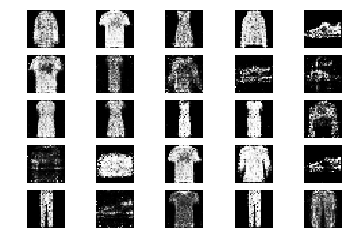

In [4]:
# plot some sample images
gan.sample_images(0)

In [0]:
 # fuction to plot a signel image 
 def plot_image(gan):
        noise = np.random.normal(0, 1, (1, gan.latent_dim))
        gen_imgs = gan.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        plt.imshow(gen_imgs[0, :, :, 0], cmap='gray')
        plt.show()
        plt.close()

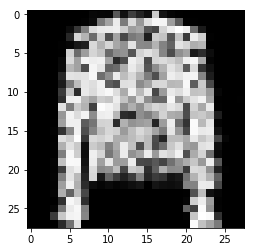

In [6]:
# plot a single image 
plot_image(gan)

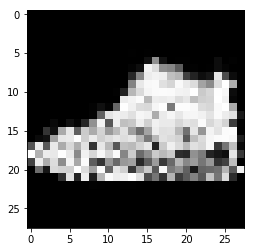

In [9]:
# plot another image 
plot_image(gan)